# 🎧 Spotify Listening History: A Personal Data Analytics Project

## 📝Executive Summary

This project uses a Python and PostgreSQL-based pipeline to analyze 10+ years of Spotify listening history, combining local JSON data with external metadata to explore trends in genre discovery, artist loyalty, and podcast habits.

We integrate data from the [Spotify Web API](https://developer.spotify.com/documentation/web-api/reference/get-an-artist) to include musical genre information to analyze shifts in musical preference over time. Using PostgreSQL, SQLAlchemy, Plotly, and Seaborn, the project surfaces insights about listening habits mirroring and adapting the "Spotify Wrapped" question list.

This analysis quantifies patterns such as the most-played artists and tracks per year, the recurrence of top genres, daily and seasonal listening habits, and the timeline of genre discovery. We also experiment with "genre-mapping," seeking to leverage data from [Every Noise at Once](https://everynoise.com/ ) to plot genres on a coordinate system to examine visually how listening preferences shifted through this "genre-space" over time.

## 📌 Project Objectives

- Analyze _entire_ personal listening data from Spotify
- Quantify behavioral patterns and genre evolution
- Replicate "Spotify Wrapped" functionality as fully as possible

## 📦 Library Imports

In [11]:
# Standard Library
import os
import sys
import json
import time
import base64
import socket
import logging
import datetime
import re
import traceback
import calendar
from collections import defaultdict
from pathlib import Path, PurePath
from time import sleep
from typing import List, Optional, Dict, Any

# Data Handling
import pandas as pd
import numpy as np

# SQL and Database
import duckdb
import psycopg2
from sqlalchemy import create_engine, text, insert, inspect, update, select, and_, or_, MetaData, Table
from sqlalchemy.dialects.postgresql import insert as pgsql_insert
from sqlalchemy.orm import sessionmaker
from sqlalchemy.engine import Engine

# API Access
import requests
from dotenv import load_dotenv

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.patches as mpatches

# Notebook Utilities
from IPython.display import display, JSON
from tqdm import tqdm


## 🔐 Environmental and Credential Setup

We set up our environment variables for the Spotify Web API as well as database credentials. We use the [dotenv](https://pypi.org/project/python-dotenv/) Python library to avoid stashing credentials within notebooks in clear-text. It can be used for other environmental variables as well. 

In [14]:
# Load environment variables
load_dotenv()

CLIENT_ID = os.getenv("SPOTIFY_CLIENT_ID")
CLIENT_SECRET = os.getenv("SPOTIFY_CLIENT_SECRET")

# Define global Spotify API base URL
SPOTIFY_API_BASE_URL = "https://api.spotify.com/v1/"

# Configure Local Database config and credentials
db_user = os.getenv("DB_USER")
db_host = os.getenv("DB_HOST")
db_name = os.getenv("DB_NAME")
db_password = os.getenv("DB_PASSWORD")
db_port = os.getenv("DB_PORT")

## 🌍 Global Constants and File Path Configuration

In [6]:
# By default, the current working directory will be the same directory that the notebook resides
# Ex: <gh_repo>/notebooks
# We need to change this so that the current working directory will be the base directory of the 
# Github repo. We can traverse to the top level directory relatively using the ".." shorthand

# Set env variable to 'None' value. O
DATA_PATH = None
# Change current working directory from notebooks directory to one level above.

# Use conditional to ensure we do not traverse to higher level dir.
if not DATA_PATH:
    # Change current working directory from `notebooks` directory to one level above.
    os.chdir('..')
    
    # Get current path
    cwd = PurePath(Path.cwd())
    
    # Construct path to archive location
    DATA_PATH = cwd / 'data' 
    
    # Construct query output path
    QUERY_OUTPUT_PATH = cwd / 'data'/ 'sql' / 'query_results'


In [41]:
# Confirm location where data files are stored.
print(str(DATA_PATH))

C:\Users\lover\Documents\Github\Spotify_Listening_History_Analysis\data\raw


Sometimes you want to see the _full_ contents of dataframes, but the notebook will only display truncated versions. Uncomment and execute the cell below to enable full row and column display.

In [1]:
# Modify display options to show full column or row contents
# pd.set_option('display.max_columns', None)
# pd.set_option('display.max_rows', None)

### Constants Mapping

Placeholder section to be used for static items we may need. (Seasons, genres, lists).

## 🛠️ Function Definitions

### File I/O and JSON Processing

In [18]:
def get_json_files(directory: str) -> List[PurePath]:
    """
    Return list of PurePath objects for all JSON files in a given directory.
    """
    return [
        PurePath(directory, f)
        for f in os.listdir(directory)
        if PurePath(directory, f).is_file() and f.endswith(".json")
    ]


def list_files_pathlib(path_str: str) -> List[str]:
    """
    Return a list of filenames from a valid directory path using pathlib.
    """
    path = Path(PurePath(path_str))
    if not path.is_dir():
        return []
    return [entry.name for entry in path.iterdir() if entry.is_file()]


def list_files_os(path_str: str) -> List[str]:
    """
    Return list of filenames from a valid directory path using os and PurePath.
    """
    path = PurePath(path_str)
    if not os.path.isdir(path):
        return []
    return [
        f for f in os.listdir(path)
        if os.path.isfile(os.path.join(path, f))
    ]


def load_json_from_file(json_file: str, engine: Engine, db_table: str) -> None:
    """
    Load JSON file and insert records into a PostgreSQL table using SQLAlchemy.
    """
    with open(json_file, 'r', encoding='utf-8', errors='ignore') as input_file:
        json_data = json.load(input_file)

    with engine.connect() as conn:
        for record in json_data:
            if record.get("offline_timestamp"):
                ts = int(record["offline_timestamp"] / 1000)
                record["offline_timestamp"] = datetime.datetime.fromtimestamp(ts, datetime.UTC)

            insert_data = {
                "timestamp_column": record.get("ts"),
                "platform": record.get("platform"),
                "ms_played": record.get("ms_played"),
                "conn_country": record.get("conn_country"),
                "track_name": record.get("master_metadata_track_name"),
                "artist_name": record.get("master_metadata_album_artist_name"),
                "album_name": record.get("master_metadata_album_album_name"),
                "spotify_track_uri": record.get("spotify_track_uri"),
                "episode_name": record.get("episode_name"),
                "episode_show_name": record.get("episode_show_name"),
                "spotify_episode_uri": record.get("spotify_episode_uri"),
                "audiobook_title": record.get("audiobook_title"),
                "audiobook_uri": record.get("audiobook_uri"),
                "audiobook_chapter_uri": record.get("audiobook_chapter_uri"),
                "audiobook_chapter_title": record.get("audiobook_chapter_title"),
                "reason_start": record.get("reason_start"),
                "reason_end": record.get("reason_end"),
                "shuffle": record.get("shuffle"),
                "skipped": record.get("skipped"),
                "offline": record.get("offline"),
                "offline_timestamp": record.get("offline_timestamp"),
                "incognito_mode": record.get("incognito_mode"),
                "ip_addr": record.get("ip_addr"),
            }

            conn.execute(insert(db_table), [insert_data])
            conn.commit()


def get_audio_json_files(directory: Path) -> List[str]:
    """
    Retrieves all files in the directory that match the 'Audio*.json' pattern.
    """
    all_files = list_files_os(directory)
    audio_files = [f for f in all_files if re.match(r'.*Audio.*\.json$', f)]
    return sorted(audio_files)


def preview_sample_json(file_path: Path, sample_idx: int = 0):
    """
    Preview specific record from a JSON file.
    """
    with open(file_path, 'r', encoding='utf-8', errors='ignore') as f:
        data = json.load(f)
    display(JSON(data[sample_idx]))

### Spotify Web API Functions

In [19]:
# Web API: Token Retrieval Function
def get_token(client_id: str=None, client_secret: str=None) -> str:
    """
    Retrieves Spotify API access token using the Client Credentials flow.
    
    Args:
        CLIENT_ID (str): Spotify API Client ID.
        CLIENT_SECRET (str): Spotify API Client Secret.
    
    Returns:
        str: Bearer token for authorization.
    
    Raises:
        Exception: If token request fails or response is invalid.
    # """
    if not client_id:
        client_id = CLIENT_ID
    if not client_secret:
        client_secret = CLIENT_SECRET

    auth_url = "https://accounts.spotify.com/api/token"
    auth_header = base64.b64encode(f"{CLIENT_ID}:{CLIENT_SECRET}".encode()).decode()

    headers = {
        "Authorization": f"Basic {auth_header}",
        "Content-Type": "application/x-www-form-urlencoded"
    }

    data = {
        "grant_type": "client_credentials"
    }

    response = requests.post(auth_url, headers=headers, data=data)
    
    if response.status_code == 200:
        return response.json().get("access_token")
    else:
        raise Exception(f"Failed to retrieve token: {response.status_code} | {response.text}")


# Web API: Auth Header Builder
def get_auth_header(token: str) -> dict:
    """
    Construct the auth-z header for Spotify API requests.

    Args:
        token (str): Bearer token from `get_token()`.

    Returns:
        dict: Dictionary containing Authorization header.
    """
    return {"Authorization": f"Bearer {token}"}


def search_for_artist(token: str, artist_name: str) -> Optional[Dict[str, Any]]:
    """
    Search the Spotify API for an artist by name and return metadata if found.
    """
    url = f"{SPOTIFY_API_BASE_URL}search?q={artist_name}&type=artist&limit=1"
    headers = get_auth_header(token)
    response = requests.get(url, headers=headers)
    try:
        return response.json()["artists"]["items"][0]
    except (KeyError, IndexError):
        print(f"No artist found for '{artist_name}'")
        return None


def search_for_artist_by_id(token: str, artist_id: str) -> Optional[Dict[str, Any]]:
    """
    Retrieve Spotify artist metadata using the artist's Spotify ID.
    """
    url = f"{SPOTIFY_API_BASE_URL}artists/{artist_id}"
    headers = get_auth_header(token)
    response = requests.get(url, headers=headers)

    if response.status_code != 200:
        msg = response.json().get('error', {}).get('message', 'No message')
        print(f"Error {response.status_code}: {msg}")
        return None

    try:
        return response.json()
    except json.JSONDecodeError:
        print("Error decoding JSON response")
        return None


def get_songs_by_artist(token: str, artist_id: str) -> List[Dict[str, Any]]:
    """
    Retrieve top tracks for an artist using their Spotify ID.
    """
    url = f"{SPOTIFY_API_BASE_URL}artists/{artist_id}/top-tracks?country=US"
    headers = get_auth_header(token)
    return requests.get(url, headers=headers).json()["tracks"]


### Database Insert/Update

In [20]:
def insert_artist_genres(
    starting_id: int,
    ending_id: int,
    engine: Engine,
    artists_table,
    CLIENT_ID: str,
    CLIENT_SECRET: str,
    artists_lacking_genres: Optional[Dict[int, str]] = None
) -> int:
    """
    Use the Spotify API to populate missing genre fields in an artist table.
    """
    artists_lacking_genres = artists_lacking_genres or {}
    token = get_token(CLIENT_ID, CLIENT_SECRET)
    records_processed = 0
    last_seen_id = starting_id

    stmt = select(artists_table.c.id, artists_table.c.artist_name).where(
        and_(
            or_(
                artists_table.c.genres == '{}',
                artists_table.c.genres.is_(None)
            ),
            artists_table.c.id >= starting_id,
            artists_table.c.id <= ending_id
        )
    ).order_by(artists_table.c.id)

    with engine.connect() as conn:
        for row in conn.execute(stmt):
            last_seen_id = row.id

            if records_processed and records_processed % 450 == 0:
                token = get_token(CLIENT_ID, CLIENT_SECRET)
                records_processed = 0
                time.sleep(900)

            print(f"Artist: {row.artist_name}\nID: {row.id}")

            try:
                api_result = search_for_artist(token, row.artist_name)
                genre_list = api_result.get("genres", []) if api_result else []

                conn.execute(
                    update(artists_table)
                    .where(artists_table.c.id == row.id)
                    .values(genres=genre_list)
                )
                conn.commit()

            except (KeyError, TypeError, IndexError, json.JSONDecodeError) as e:
                print(f"Error: {e} for artist {row.artist_name}")
                artists_lacking_genres[row.id] = row.artist_name
                return last_seen_id

            except requests.exceptions.RequestException as e:
                print(f"Request failed: {e}")
                return last_seen_id

            time.sleep(7)
            records_processed += 1

    return last_seen_id


def retry_with_backoff(
    func,
    start_id: int,
    ending_id: int,
    engine: Engine,
    artists_table,
    CLIENT_ID: str,
    CLIENT_SECRET: str,
    max_retries: int = 2,
    base_wait: int = 60
) -> None:
    """
    Retry function with exponential backoff in case of failure.
    """
    attempt = 0
    current_id = start_id

    while attempt <= max_retries:
        print(f"\n=== Attempt {attempt + 1} starting at ID {current_id} ===")
        start_time = time.time()

        try:
            last_seen_id = func(
                current_id,
                ending_id,
                engine,
                artists_table,
                CLIENT_ID,
                CLIENT_SECRET
            )
            elapsed = (time.time() - start_time) / 3600
            print(f"Function completed in {elapsed:.2f} hours")
            break

        except Exception as e:
            traceback.print_exc()
            wait_time = base_wait * (2 ** attempt)
            print(f"Exception: {e}\nRetrying in {wait_time} seconds...")
            time.sleep(wait_time)
            current_id = max(0, locals().get("last_seen_id", current_id) - 1)
            attempt += 1

    else:
        print("Max retries exceeded.")


def ingest_audio_jsons_to_db(
    file_list: List[str],
    data_dir: Path,
    engine,
    table_name: str,
    loader_func,  # Injected function that does the loading
    dry_run: bool = False,
    max_files: int = None
) -> Dict[str, int]:
    """
    Generalized loader for JSON audio files into a specified DB table.

    Parameters:
    - file_list: List of filenames to process.
    - data_dir: Directory containing files.
    - engine: SQLAlchemy engine or connection.
    - table_name: Name of the database table to insert into.
    - loader_func: Function that takes (file_path, engine, table_name).
    - dry_run: Preview only, don't insert.
    - max_files: Limit number of files to process.

    Returns:
    - Dictionary mapping filename -> record count.
    """
    results = {}
    files_to_process = file_list if max_files is None else file_list[:max_files]

    if dry_run:
        print("🔍 Dry run mode: previewing file paths only.\n")
        for file_name in files_to_process:
            print(f"[DRY RUN] Would process: {data_dir / file_name}")
        print(f"\n🛑 Dry run complete. {len(files_to_process)} files previewed.")
        return {}

    start_time = time.time()
    for file_name in tqdm(files_to_process, desc="Inserting audio logs"):
        file_path = data_dir / file_name
        try:
            with open(file_path, 'r', encoding='utf-8', errors='ignore') as f:
                file_data = json.load(f)
            record_count = len(file_data)
            loader_func(file_path, engine, table_name)
            results[file_name] = record_count
        except Exception as e:
            logging.error(f"❌ Failed: {file_name} | {str(e)}")
            results[file_name] = 0
    end_time = time.time()

    print(f"\n✅ Loaded {len(results)} files in {(end_time - start_time)/60:.2f} minutes.")
    print(f"📊 Total records inserted: {sum(results.values()):,}")

    return results

### Analysis Helpers

In [42]:
def last_day_of_year(timestamp: str | pd.Timestamp) -> float:
    """
    Return number of days remaining between the timestamp and end of its year.
    """
    ts = pd.to_datetime(timestamp)
    end = datetime.datetime(ts.year, 12, 31, 23, 59, 59, tzinfo=datetime.timezone.utc)
    ts_utc = ts.tz_localize('UTC') if ts.tzinfo is None else ts.astimezone(datetime.timezone.utc)
    return (end - ts_utc).total_seconds() / 86400


def get_surrounding_genres(
    df: pd.DataFrame,
    center_x: float,
    center_y: float,
    radius_pct: float = 5,
    year: Optional[int] = None
) -> pd.DataFrame:
    """
    Return genres within the radius of a center point in 2D genre space.
    """
    required = {"x", "y", "genre", "year"}
    if not required.issubset(df.columns):
        raise ValueError(f"Missing columns: {required - set(df.columns)}")

    if year is not None:
        df = df[df["year"] == year].copy()
        if df.empty:
            raise ValueError(f"No data found for year {year}")

    x_range = df["x"].max() - df["x"].min()
    radius = (radius_pct / 100) * x_range
    df["distance"] = np.sqrt((df["x"] - center_x) ** 2 + (df["y"] - center_y) ** 2)

    nearby = df[df["distance"] <= radius].copy().sort_values("distance")
    return nearby[["genre", "x", "y", "distance", "ms_played", "year"]].reset_index(drop=True)


def fetch_query_results(query: str, engine = None) -> pd.DataFrame:
    """
    Execute SQL query using a given SQLAlchemy engine and return a pandas DataFrame.
    Automatically downcasts any column containing 'year' in its name to integer.

    Parameters:
    - query (str): SQL query to execute.
    - engine (sqlalchemy.engine.Engine): SQLAlchemy engine object for DB connection.

    Returns:
    - pd.DataFrame: Query results with '*year*'-named columns downcasted to integer.
    """
    # Use the global engine if none is provided
    if engine is None:
        engine = globals().get("engine")
        if engine is None:
            raise ValueError("No SQLAlchemy engine provided or found in global scope.")

    with engine.connect() as conn:
        df = pd.read_sql(text(query), conn)

    year_cols = [col for col in df.columns if 'year' in col.lower()]
    for col in year_cols:
        df[col] = pd.to_numeric(df[col], downcast='integer', errors='coerce')

    return df


def execute_query(query: str, engine: Optional[Engine] = None) -> None:
    """
    Executes a SQL query (e.g. INSERT, UPDATE, DELETE) using a SQLAlchemy engine.

    This function is intended for queries that do not return results.

    Parameters:
    - query (str): The SQL query to execute.
    - engine (Optional[Engine]): SQLAlchemy engine to use for the database connection.
      If not provided, the function will look for a global `engine`.

    Raises:
    - ValueError: If no SQLAlchemy engine is provided or found in the global scope.
    - sqlalchemy.exc.SQLAlchemyError: If execution fails due to SQL errors.
    """
    # Use the global engine if none is provided
    if engine is None:
        engine = globals().get("engine")
        if engine is None:
            raise ValueError("No SQLAlchemy engine provided or found in global scope.")

    with engine.connect() as conn:
        conn.execute(text(query))
        conn.commit()

## 🗄️ Database Setup

### Engine and Connection String

In [109]:
# Establish connection with Postgres database
db_name = 'spotify_streaming'
engine = create_engine(f"postgresql+psycopg2://{db_user}:{db_password}@{db_host}:{db_port}/{db_name}") 

In [110]:
# Confirm database connection
with engine.connect() as conn:
    result = conn.execute(text("SELECT version() "))
    print(result.all())

[('PostgreSQL 17.4 on x86_64-windows, compiled by msvc-19.43.34808, 64-bit',)]


In [108]:
engine.dispose()

After confirming our database instance is accessible via our connection string, it is possible to copy/paste the SQL detailed below into an appropriate database administration tool, such as pgadmin4, or execute the contents of `<local_github_repo_dir>/setup/postgresql_setup.sql`. Prior to executing code from strangers on the internet, it is advisable to read and understand each section to be aware of what will be executed and why it is necessary to conduct this analysis.

### Create Main Tables

Create the core table storing imported Spotify JSON data.

Create the `artists` tables, as this is needed to capture artists metadata.

Create a JOIN table linking `artists` to `spotify_data` .

### Index Setup

### Define Triggers

### Apply Permissions & Ownership

To execute the following queries, we need to correctly populate our chosen database user name and credentials. In this snippet, we assume that `spotify_postgres_user` is the chosen user name and have a placeholder set for the password."

### Table Validation

#### Validate Tables via SQL

In [12]:
# Create an inspector to examine the current DB
inspector = inspect(engine)

expected_tables = {"spotify_data", "artists", "ip_metadata", "sd_artists_join"}
existing_tables = set(inspector.get_table_names())

missing_tables = expected_tables - existing_tables
assert not missing_tables, f"Missing expected tables: {missing_tables}"

print("✅ All expected tables are present.")


✅ All expected tables are present.


#### Validate Expected Columns

We can further validate the presence of expected columns in the database table. We listed a few of these tables and associated columns, some with correct column sets, others with incomplete column sets to illustrate this. If you end up altering the schema significantly, revisiting and populating expected columns will lessen likelihood of tables mutating in unexpected ways.

In [13]:
expected_columns = {
    "spotify_data": {"id", "timestamp_column", "ip_addr", "track_name", "artist_name", "year_played"},
    "artists": {"id", "artist_name", "genres", "last_updated"},
    "ip_metadata": {"ip_addr", "status", "continent_code", "country_code", "city"},
    "sd_artists_join": {"artist_name", "sd_id", "artist_id"},
}

for table, expected_cols in expected_columns.items():
    actual_cols = {col["name"] for col in inspector.get_columns(table)}
    missing = expected_cols - actual_cols
    extra = actual_cols - expected_cols
    assert not missing, f"❌ {table} is missing columns: {missing}"
    if extra:
        print(f"⚠️  {table} has extra columns: {extra}")
    else:
        print(f"✅ {table} has expected columns.")


⚠️  spotify_data has extra columns: {'audiobook_chapter_uri', 'ms_played', 'shuffle', 'incognito_mode', 'audiobook_uri', 'reason_end', 'reason_start', 'audiobook_title', 'audiobook_chapter_title', 'time_of_day', 'offline', 'album_name', 'spotify_track_uri', 'conn_country', 'platform', 'offline_timestamp', 'skipped', 'season', 'episode_name', 'spotify_episode_uri', 'episode_show_name'}
✅ artists has expected columns.
⚠️  ip_metadata has extra columns: {'org', 'asn', 'lon', 'isp', 'mobile', 'lat', 'proxy', 'zip', 'timezone', 'region_name', 'hosting', 'asname'}
✅ sd_artists_join has expected columns.


#### Confirm Foreign Key Constraints

In [14]:
expected_fks = {
    "spotify_data": [("ip_addr", "ip_metadata", "ip_addr")],
    "sd_artists_join": [
        ("sd_id", "spotify_data", "id"),
        ("artist_id", "artists", "id")
    ],
}

for table, fks in expected_fks.items():
    actual_fks = inspector.get_foreign_keys(table)
    actual_set = {(fk["constrained_columns"][0], fk["referred_table"], fk["referred_columns"][0])
                  for fk in actual_fks}
    expected_set = set(fks)
    missing = expected_set - actual_set
    assert not missing, f"❌ {table} missing FK constraints: {missing}"
    print(f"✅ {table} foreign keys are valid.")

✅ spotify_data foreign keys are valid.
✅ sd_artists_join foreign keys are valid.


#### Confirm Table Presence

In [22]:
def test_table_exists(engine, table_name):
    inspector = inspect(engine)
    try:
        assert table_name in inspector.get_table_names()
        print(f"Table {table_name} exists.")
    except Exception as e:
        traceback.print_exc()
        print(f"Table {table_name} does *not* exist.")
        print(f"Exception: {e}")

postgres_table_names = ['ip_metadata', 'spotify_data', 'artists', 'sd_artists_join']

for table_name in postgres_table_names:
    test_table_exists(engine, table_name)

Table ip_metadata exists.
Table spotify_data exists.
Table artists exists.
Table sd_artists_join exists.


## 📥 Loading Raw Data from JSON

This notebook section assumes the reader has extracted JSON comprising their Spotify listening history into `<local_github_repo_dir>/data/raw` directory. The full list of JSON files should be accessible here on a per-file basis, and _not_ nested beneath any subdirectories in the `raw` directory. 

In [45]:
# Get matching audio JSONs from our data path. This will return a list of all
# JSON files in our DATA_PATH.
audio_files = get_audio_json_files(DATA_PATH / 'raw')

In [46]:
audio_files

['Streaming_History_Audio_2014-2017_0.json',
 'Streaming_History_Audio_2017-2018_1.json',
 'Streaming_History_Audio_2018-2019_2.json',
 'Streaming_History_Audio_2019-2020_4.json',
 'Streaming_History_Audio_2019_3.json',
 'Streaming_History_Audio_2020-2021_5.json',
 'Streaming_History_Audio_2021-2022_9.json',
 'Streaming_History_Audio_2021_6.json',
 'Streaming_History_Audio_2021_7.json',
 'Streaming_History_Audio_2021_8.json',
 'Streaming_History_Audio_2022-2023_12.json',
 'Streaming_History_Audio_2022_10.json',
 'Streaming_History_Audio_2022_11.json',
 'Streaming_History_Audio_2023-2024_14.json',
 'Streaming_History_Audio_2023_13.json',
 'Streaming_History_Audio_2024-2025_17.json',
 'Streaming_History_Audio_2024_15.json',
 'Streaming_History_Audio_2024_16.json']

In [ ]:
# Take a peek at one of the records. This should return a JSON record for a single track.
sample_file_path = DATA_PATH / 'raw' / audio_files[0]
preview_sample_json(sample_file_path)

In [64]:
# Create a variable capturing the Postgres table that will store our loaded Spotify data.
metadata_obj = MetaData()
# Create a table object to use for inserting our JSON records.
spotify_table = Table('spotify_data', metadata_obj, autoload_with=engine)
spotify_table

Table('spotify_data', MetaData(), Column('id', INTEGER(), table=<spotify_data>, primary_key=True, nullable=False, server_default=Identity(always=True, start=1, increment=1, minvalue=1, maxvalue=2147483647, cycle=False, cache=1)), Column('timestamp_column', TIMESTAMP(timezone=True), table=<spotify_data>), Column('platform', VARCHAR(length=100), table=<spotify_data>), Column('ms_played', INTEGER(), table=<spotify_data>), Column('conn_country', VARCHAR(length=2), table=<spotify_data>), Column('ip_addr', VARCHAR(length=50), ForeignKey('ip_metadata.ip_addr'), table=<spotify_data>), Column('track_name', VARCHAR(length=300), table=<spotify_data>), Column('artist_name', VARCHAR(length=300), table=<spotify_data>), Column('album_name', VARCHAR(length=300), table=<spotify_data>), Column('spotify_track_uri', VARCHAR(length=50), table=<spotify_data>), Column('episode_name', VARCHAR(length=150), table=<spotify_data>), Column('episode_show_name', VARCHAR(length=100), table=<spotify_data>), Column('sp

In [68]:
# Preview 3 files only, no DB writes
audio_ingest_path = DATA_PATH / 'raw'
ingest_audio_jsons_to_db(audio_files,
                         audio_ingest_path,
                         engine,
                         spotify_table,
                         load_json_from_file,
                         dry_run=True,
                         max_files=3)

🔍 Dry run mode: previewing file paths only.

[DRY RUN] Would process: C:\Users\lover\Documents\Github\Spotify_Listening_History_Analysis\data\raw\Streaming_History_Audio_2014-2017_0.json
[DRY RUN] Would process: C:\Users\lover\Documents\Github\Spotify_Listening_History_Analysis\data\raw\Streaming_History_Audio_2017-2018_1.json
[DRY RUN] Would process: C:\Users\lover\Documents\Github\Spotify_Listening_History_Analysis\data\raw\Streaming_History_Audio_2018-2019_2.json

🛑 Dry run complete. 3 files previewed.


{}

In [73]:
# Set ingestion directory
audio_ingest_path = DATA_PATH / 'raw'
# Full ingestion of all JSON files
results = ingest_audio_jsons_to_db(
    file_list=audio_files,
    data_dir=audio_ingest_path,
    engine=engine,
    table_name=spotify_table,
    loader_func=load_json_from_file
)

Inserting audio logs: 100%|██████████| 18/18 [02:05<00:00,  6.98s/it]


✅ Loaded 18 files in 2.09 minutes.
📊 Total records inserted: 274,795


### Confirm Database Functionality

In [75]:
# Confirm we have records in the `spotify_data` table. A simple COUNT() does the trick.
query = """
    SELECT COUNT(*)
    FROM spotify_data
    """
query_results = fetch_query_results(query, engine)

# Validate non-zero number of results
query_results

,count
0,274795


In [77]:
# A test search for Stevie Wonder.
query = """
    SELECT 
        artist_name
        ,album_name
        ,track_name
        ,timestamp_column
    FROM spotify_data
    WHERE artist_name = 'Stevie Wonder'
    """
query_results = fetch_query_results(query, engine)
query_results

,artist_name,album_name,track_name,timestamp_column
0,Stevie Wonder,"Signed, Sealed And Delivered","Signed, Sealed, Delivered (I'm Yours)",2017-05-11 21:44:30-07:00
1,Stevie Wonder,"Signed, Sealed And Delivered",We Can Work It Out,2020-08-21 19:27:29-07:00
2,Stevie Wonder,The Definitive Collection,Do I Do,2023-12-29 21:37:23-08:00


### How to Populate the `artists` Table

In order to cleanly surface genres data for our tracks, we need to look up artist information. We have an `artists` table laid out, but lacking data. Use the following query to seed artists information from the `spotify_data` table. (This query can also be found inside of the `sql/queries.sql` file.)

In [49]:
query = """
-- Insert artists data into `artists` table
WITH distinct_artists (artist_name) AS (
	SELECT DISTINCT artist_name 
	FROM spotify_data 
)
INSERT INTO artists (artist_name)
SELECT da.artist_name
FROM distinct_artists AS da
LEFT JOIN artists AS a 
    ON da.artist_name = a.artist_name
WHERE a.artist_name IS NULL;
"""

In [48]:
# Execute query to insert data into the `artists` table.
# No results are returned.
execute_query(query)

After insertion of data into `artists`, query the DB to see if we have records inserted. 

In [61]:
query ="""
-- Execute query to shallow confirm data insertion into artists table
SELECT * 
FROM artists 
LIMIT 5;
"""

In [62]:
artists_results = fetch_query_results(query)
artists_results

,id,artist_name,genres,last_updated
0,8,$CYTHE SHAWTY,None,2025-07-18 08:50:03.329224+00:00
1,9,$ebu,None,2025-07-18 08:50:03.329224+00:00
2,10,$HEEPDAH$LEEPER,None,2025-07-18 08:50:03.329224+00:00
3,11,$hirak,None,2025-07-18 08:50:03.329224+00:00
4,12,$imba,None,2025-07-18 08:50:03.329224+00:00


With the `artists` table populated, we create a JOIN table to link the `artists` table to the `spotify_data` table. Since the only IDs we want must be based on these two existing tables, we set constraints on both `artists` and `spotify_data` tables first. This can be done out-of-the-box within our `setup/postgresql.sql` file, but we detail the process for clarity.

After this, we create our join table, reference both the `id` columns in `artists` and `spotify_data` table, as well as setting up a composite primary key.

We still must populate the `sd_artists_join` table with data from `artists` and `spotify_data` table. Since there may be NULL values in our `artists` table, we add an appropriate `WHERE` clause for that scenario.

## 🌐 Spotify API Enrichment

Now that we have our JOIN table linking `artists` and `spotify_data` tables, we need to populate the artists table with genre data. We extract the artist's name from the database, make a request against the [Spotify Web API](https://developer.spotify.com/documentation/web-api), retrieve the result, and insert genre data for the respective artist into the `genres` column. This is necessary as genre data is _not_ directly stored within any column of the `spotify_data` table.

### Test API Interactions

In [103]:
# Obtain a token based on our Client ID and Client Secret. These can be sent as params
# but we have opted to set them as default in the function. 
token = get_token()
# print(token)  # DO NOT persist this in your notebook.

# Search for one of my favorite artists.
result = search_for_artist(token, "Green Piccolo")

# Extract the artist ID from the JSON result.
artist_id = result["id"]

# Use our function to extract songs based on the artist's id value.
songs = get_songs_by_artist(token, artist_id)

# Do a clean notebook presentation of JSON.
display(JSON(songs, expanded=False))

<IPython.core.display.JSON object>

In [104]:
# View full JSON result data.
result

{'external_urls': {'spotify': 'https://open.spotify.com/artist/0Of8ndqAY23l2wV3sS6Zez'},
 'followers': {'href': None, 'total': 11032},
 'genres': ['lo-fi beats'],
 'href': 'https://api.spotify.com/v1/artists/0Of8ndqAY23l2wV3sS6Zez',
 'id': '0Of8ndqAY23l2wV3sS6Zez',
 'images': [{'url': 'https://i.scdn.co/image/ab6761610000e5eb01c742e1f3b38c51747f65dd',
   'height': 640,
   'width': 640},
  {'url': 'https://i.scdn.co/image/ab6761610000517401c742e1f3b38c51747f65dd',
   'height': 320,
   'width': 320},
  {'url': 'https://i.scdn.co/image/ab6761610000f17801c742e1f3b38c51747f65dd',
   'height': 160,
   'width': 160}],
 'name': 'Green Piccolo',
 'popularity': 33,
 'type': 'artist',
 'uri': 'spotify:artist:0Of8ndqAY23l2wV3sS6Zez'}

In [105]:
# Peruse a list of genres from the result.
result['genres']

['lo-fi beats']

We observe the JSON result is rich with relevant information, along with nice-to-have-elements. This includes links to Artist Spotify URL, their number of followers, associated images, and popularity.

### Preparing the `artists` Table for Genres

We create a variable representing the `artists` table. Our intent is to iterate over every artist present, issue a Spotify API request based on the artist's name, extract the genres from the returned JSON, then insert this data into the `genres` ARRAY column in the `artists` table.  

In [100]:
# Create table object for `artists`
metadata_obj = MetaData()
artists_table = Table('artists', metadata_obj, autoload_with=engine)

Create a query that willl return records in an ordered fashion. This will ensure the ability to mark some windows of records as "seen" or "unseen" with future processing.  

In [101]:
# Select all artists, in an ordered fashion.
select_all_artists_stmt = select(
    artists_table.c.id,
    artists_table.c.artist_name
).where(
        artists_table.c.id <= 18880                    # Apply to all records by setting this 18880
).order_by(artists_table.c.id)


In [102]:
print(select_all_artists_stmt)

SELECT artists.id, artists.artist_name 
FROM artists 
WHERE artists.id <= :id_1 ORDER BY artists.id


#### Exponential Backoff for Genre Acquisition

With preparation of the underlying database tables out of the way, we now set about processing every artist present in the `artists` table via `select_all_artists_stmt`, accessing the API, then inserting their genre into the array column appropriately. 

The Spotify Web API is free, but has rate-limiting restrictions. Exceeding their API rate limit will cause subsequent API requests to fail, and delay the time before requests can be made again. To avoid this situation, we tried to be conservative with the timing between individual API requests, so as not to exhaust our daily quota limits. In an effort to avoid spamming the endpoint unnecessarily, prevent manual intervention, and automate data collection, we use an [exponential backoff](https://bit.ly/4jZi9tN) method to retry API requests if any kind of failure, network disconnection occurs and space out the time gap between each of our data-gathering "sessions." 

Below is a cell with an example genre data insertion into the local DB. Even here we see an API timeout failure with a small amount of records, likely meriting elongating the time gap between requests.

In [114]:
# Execute insertions with a small set of records. Even here we see API timeout.
retry_with_backoff(insert_artist_genres,1,10, engine, artists_table, CLIENT_ID, CLIENT_SECRET)


=== Attempt 1 starting at ID 1 ===
Artist: 'Til Tuesday
ID: 1
Artist: !!!
ID: 2
Artist: #Calmante
ID: 3
No artist found for '#Calmante'
Artist: #Relajante
ID: 4
No artist found for '#Relajante'
Artist: $affie
ID: 5
Artist: $AVAGE
ID: 6
Artist: $ayyf
ID: 7
Artist: $CYTHE SHAWTY
ID: 8
Request failed: HTTPSConnectionPool(host='api.spotify.com', port=443): Read timed out. (read timeout=None)
Function completed in 0.02 hours


If our code becomes disconnected or the processing is halted by API quota limit, we will restart insertion by invoking our functions with parameters to filter the last processed `artists.id` value. By selecting records in an "ordered" fashion, we can use the last seen record ids to know what boundaries to set for reprocessing. If swaths of records failed to be processed correctly, we can simply record the starting and ending `id` values and re-initiate the processing. This will ensure we only process the amount of requests needed and avoid recurring data for already-seen artists.

Programmatically acquiring genre data via API can be extremely time-consuming and rife with failure. For this project, we were seeking the _entirety_ of our listening history. It may be suggested limiting the number of records to several hundred at a time, and analyzing those. This means utilizing the `retry_with_backoff` function with smaller starting and ending `id` values.

## 🔬 Post-Ingestion Overview

Despite our data coming directly from Spotify as a source, we engage in data cleaning processes. We will recap the data we have collected and walk through cleaning queries to confirm whether or not our data has any problems.

### Grain

* **spotify_data**: Each row in this table represents a single Spotify playback event
* **artists**: Each row uniquely identifies an artist and may contain a `genres` array.
* **sd_artists_join**: A JOIN table linking `spotify_data` to `artists` handling one-to-many mapping between an artist and multiple entries in `spotify_data`. 

### Measures

* **ms_played**: Actual playback time in milliseconds. This is not necessarily equivalent to full playback time of an event.

### Dimensions

Every other column in the `spotify_data` table can be considered a dimension. Some examples of these include:

* `timestamp_column`
* `platform`
* `track_name`
* `artist_name`
* `album_name`
* `ip_addr`
* `conn_country`
* `reason_start`
* `reason_end`

## 🧩 Locate Solvable Issues

First, we want to see how many tracks have NULLs column entries. If there are a sizable amount of issues or errors, the validity of any insights or conclusions drawn may be in doubt.

### Null Records

In [66]:
# Get total records in `spotify_data` table.
query = """
SELECT COUNT(*)
FROM spotify_data
"""

In [67]:
print(fetch_query_results(query))

    count
0  274795


In [63]:
query = """
-- Check for NULLs in important columns in `spotify_data`
SELECT
    COUNT(*) FILTER (WHERE timestamp_column IS NULL) AS null_timestamps,
    COUNT(*) FILTER (WHERE ms_played IS NULL) AS null_ms_played,
    COUNT(*) FILTER (WHERE track_name IS NULL) AS null_track_names,
    COUNT(*) FILTER (WHERE artist_name IS NULL) AS null_artist_names,
    COUNT(*) FILTER (WHERE platform IS NULL) AS null_platforms,
    COUNT(*) FILTER (WHERE ip_addr IS NULL) AS null_ips
FROM spotify_data;
"""

In [64]:
print(fetch_query_results(query))

   null_timestamps  null_ms_played  null_track_names  null_artist_names  \
0                0               0               177                177   

   null_platforms  null_ips  
0               0         0  


Running the above query, we only encountered **177** records that had a combination of empty track names and empty artist names. On further inspection, **173** of these entries were podcast episodes, having a non-null `episode_name`, while the remaining **4** entries were audiobooks.

### Check for Empty Strings

In [72]:
# We prepend the string with 'r' to process as a raw string.
query = r"""
-- Check for empty strings
SELECT COUNT(*) FROM spotify_data WHERE track_name = '' OR track_name ~ '^\s+$';
SELECT COUNT(*) FROM spotify_data WHERE artist_name = '' OR artist_name ~ '^\s+$';
"""

In [71]:
print(fetch_query_results(query))

   count
0      0


No records with empty strings were found.

### Detecting Duplicates

It may seem a bit daunting to locate duplicate records in this dataset. We define a "duplicate" record where we encounter the same track name, same artist, same `spotify_track_uri`, and timestamps. 

Let's get a count of all duplicates. We will use a subquery, first detecting duplicates than just outputting the count of duplicates. We use `HAVING` to filter the results of `GROUP BY` after aggregation has been applied; in this case, that is done via `COUNT`.

In [89]:
dupe_check_query = """
-- Obtain count of duplicates
SELECT SUM(dup_count - 1) AS total_duplicates
FROM (
  SELECT COUNT(*) AS dup_count
  FROM spotify_data
  GROUP BY
    timestamp_column,
    artist_name,
    track_name,
    ms_played,
	spotify_track_uri,
	ip_addr
  HAVING COUNT(*) > 1
) sub;
"""

In [90]:
print(fetch_query_results(dupe_check_query))

   total_duplicates
0            2970.0


After using  `GROUP BY` with multiple column values, if the counts are greater than one, we have located duplicate records. Given it is a streaming service, it _may_ be theoretically possible to stream the same track in different locations. At the time of writing, Spotify did not allow you to stream from more than one location. It is also even more implausible for the same track to be played at the _exact_ same time from different locations. For samples of our duplicate output:

The timestamp, IP address, platform, and so on, were _exact_ matches. This caught an error I made in data ingestion, loading in the JSON Spotify records; most likely reading the same input file multiple times. There may also be some duplication occurring within the source data, if the JSON files happened to have some temporal overlap. In any case, we can clean these up. 

We create a query with `spotify_data` to find and remove duplicates, relying upon our serial ID column to assist. 

In [82]:
query = """
SELECT current_database()
"""

In [83]:
print(fetch_query_results(query))

  current_database
0       testing_db


In [91]:
dup_delete_query = """
-- DELETE duplicate records in the spotify_data table.
--USE WITH CAUTION! Be sure to backup tables prior to destructive actions.
DELETE FROM spotify_data a
USING spotify_data b
WHERE
  a.ctid < b.ctid AND  -- Keep the "first" row
  a.timestamp_column = b.timestamp_column AND
  a.artist_name = b.artist_name AND
  a.track_name = b.track_name AND
  a.spotify_track_uri = b.spotify_track_uri AND
  a.ip_addr = b.ip_addr AND
  a.ms_played = b.ms_played;
"""

In [92]:
# Execute the query to remove duplicate record from `spotify_data` table
execute_query(dup_delete_query)

In [93]:
# Rerun our duplicate check query
print(fetch_query_results(dupe_check_query))

  total_duplicates
0             None


After this query, no duplicates were found in the `spotify_data` table.

### Check for Suspicious Playtime Values

Given that tracks have playtimes in milliseconds, it would stand to reason that extraordinarily large or negative playtime values should be detected.

In [99]:
neg_play_query = """
-- Check for negative playtimes
SELECT * FROM spotify_data WHERE ms_played < 0;
"""

long_play_query = """
-- Check for elongated playtime
SELECT * FROM spotify_data WHERE ms_played > 36000000; -- 10 hours
"""

future_play_query = """
-- Check for playtimes in the future
SELECT * FROM spotify_data WHERE timestamp_column > now();
"""

In [100]:
# Check for negative play time
print(fetch_query_results(neg_play_query))

# Check for elongated play time
print(fetch_query_results(long_play_query))

# Check for playtimes in the Jetson era
print(fetch_query_results(future_play_query))
                         

Empty DataFrame
Columns: [id, timestamp_column, platform, ms_played, conn_country, ip_addr, track_name, artist_name, album_name, spotify_track_uri, episode_name, episode_show_name, spotify_episode_uri, audiobook_title, audiobook_uri, audiobook_chapter_uri, audiobook_chapter_title, reason_start, reason_end, shuffle, skipped, offline, offline_timestamp, incognito_mode, time_of_day, season, year_played]
Index: []

[0 rows x 27 columns]
Empty DataFrame
Columns: [id, timestamp_column, platform, ms_played, conn_country, ip_addr, track_name, artist_name, album_name, spotify_track_uri, episode_name, episode_show_name, spotify_episode_uri, audiobook_title, audiobook_uri, audiobook_chapter_uri, audiobook_chapter_title, reason_start, reason_end, shuffle, skipped, offline, offline_timestamp, incognito_mode, time_of_day, season, year_played]
Index: []

[0 rows x 27 columns]
Empty DataFrame
Columns: [id, timestamp_column, platform, ms_played, conn_country, ip_addr, track_name, artist_name, album_nam

All the queries above returned no entries.

### Augment the Data

Since we anticipate gleaning information on listening patterns in highly granular fashion, we augment our data with a `time_of_day` column. We share the SQL to add this column to an existing `spotify_data` table lacking `time_of_day`. If this column already exists, the command will fail.

After updating the table (if necessary) we can then update the values for `time_of_day` using the following query.

In [102]:
update_tod_query = """
UPDATE spotify_data
SET time_of_day = CASE
  WHEN EXTRACT(HOUR FROM timestamp_column) BETWEEN 5 AND 11 THEN 'morning'
  WHEN EXTRACT(HOUR FROM timestamp_column) BETWEEN 12 AND 17 THEN 'afternoon'
  WHEN EXTRACT(HOUR FROM timestamp_column) BETWEEN 18 AND 22 THEN 'evening'
  ELSE 'night'
END;
"""

In [103]:
# Update `spotify_data` table with time of day column data based on the timestamp column.
# This will take several seconds based upon the size of your dataset.
execute_query(update_tod_query)

We similarly add seasonal information to our data.

In [104]:
seasons_update_query = """
-- Add seasonal data to records
UPDATE spotify_data
SET season = CASE
    WHEN (EXTRACT(MONTH FROM timestamp_column) = 12 AND EXTRACT(DAY FROM timestamp_column) >= 21)
      OR (EXTRACT(MONTH FROM timestamp_column) IN (1, 2))
      OR (EXTRACT(MONTH FROM timestamp_column) = 3 AND EXTRACT(DAY FROM timestamp_column) <= 19)
        THEN 'Winter'
    WHEN (EXTRACT(MONTH FROM timestamp_column) = 3 AND EXTRACT(DAY FROM timestamp_column) >= 20)
      OR (EXTRACT(MONTH FROM timestamp_column) IN (4, 5))
      OR (EXTRACT(MONTH FROM timestamp_column) = 6 AND EXTRACT(DAY FROM timestamp_column) <= 20)
        THEN 'Spring'
    WHEN (EXTRACT(MONTH FROM timestamp_column) = 6 AND EXTRACT(DAY FROM timestamp_column) >= 21)
      OR (EXTRACT(MONTH FROM timestamp_column) IN (7, 8))
      OR (EXTRACT(MONTH FROM timestamp_column) = 9 AND EXTRACT(DAY FROM timestamp_column) <= 22)
        THEN 'Summer'
    WHEN (EXTRACT(MONTH FROM timestamp_column) = 9 AND EXTRACT(DAY FROM timestamp_column) >= 23)
      OR (EXTRACT(MONTH FROM timestamp_column) IN (10, 11))
      OR (EXTRACT(MONTH FROM timestamp_column) = 12 AND EXTRACT(DAY FROM timestamp_column) <= 20)
        THEN 'Fall'
    ELSE 'Unknown'
END;
"""

In [105]:
# Update `spotify_data` table with seasonal data based on the timestamp column.
# This will take several seconds based upon the size of your dataset.
execute_query(seasons_update_query)

## ❓ Answering Spotify Wrapped Questions

Our analysis will focus on answer, verbatim, Spotify Wrapped questions detailed in the ["Understanding My Data"](https://support.spotify.com/us/article/understanding-my-data/) document _and_ seek to apply the answer across the entire listening history. 

1. Number of unique artists listened to for the year.
2. Top artists for the year.
3. Milliseconds spent listening to the number 1 artists.
4. Top percentage fan for the top artist.
5. Number of genres listened to for the year.
6. Top genres for the year.
7. Top podcasts for the year.
8. Milliseconds spent listening to the top podcast.
9. Top percentage fan for the top podcast.
10. Total milliseconds spent listening to podcasts for the year.
11. Top tracks for the year.
12. Amount of plays for the top track of the year.
13. First date the top track was played for the year.
14. Total distinct tracks played for the year.
15. Total milliseconds listened on Spotify for the year.
16. Day with the most time spent listening for the year.
17. Minutes of content listened on the top listening day for the year.
18. Top percentage of worldwide listeners for the year.
19. One-off Wrapped stories for that year.

Some of these questions cannot be answered from our available data, such as the "Top percentage fan for the top artist" or "Top percentage of worldwide listeners for the year," but the other questions, we will strive to explore.

To ensure we avoid including songs that were played mistakenly, or that were skipped immediately, we only consider songs with a play time greater than 5000 ms (5 seconds.)

### Unique Artists Listened To For a Year

This should be simple enough to obtain from our database by first extracting the unique artist and the year the stream was listened to, and then grouping the tuples by year.

In [106]:
query = """
--- Find unique artists streamed per year. Use songs playing longer than 5 seconds.
WITH distinct_artist_year (artist_name, year_streamed, ts_count) 
AS (
	SELECT DISTINCT 
        artist_name
    	,date_part('year', timestamp_column)::INT  AS year_streamed
    	,COUNT(timestamp_column) AS ts_count 
	FROM spotify_data
	WHERE ms_played > 5000
	GROUP BY 
        artist_name
        ,year_streamed
)
SELECT year_streamed, COUNT(*) as unique_artist_count
FROM distinct_artist_year
GROUP BY year_streamed 
ORDER BY year_streamed ASC
"""

In [107]:
unique_artists_per_year = fetch_query_results(query)
unique_artists_per_year

,year_streamed,unique_artist_count
0,2014,1
1,2015,5
2,2017,1704
3,2018,2142
4,2019,2254
5,2020,2599
6,2021,3143
7,2022,3654
8,2023,4932
9,2024,7657


We use a common table expression to first query for tuples of distinct artists and extract the year portion from the stream timestamp when their streams were observed. The subsequent query aggregates this by year.

In [72]:
# Ensure "year_streamed" is the index temporarily.
unique_artists_per_year_df.set_index("year_streamed", inplace=True)

# Reindex directly, filling missing years with 0. This to deal with no streams in 2016.
unique_artists_per_year_df = unique_artists_per_year_df.reindex(
    range(unique_artists_per_year_df.index.min(), unique_artists_per_year_df.index.max() + 1), 
    fill_value=0
)

# Restore "year_streamed" as a regular column.
unique_artists_per_year_df.reset_index(inplace=True)

# Ensure column names are correct.
unique_artists_per_year_df.rename(columns={"index": "year_streamed"}, inplace=True)

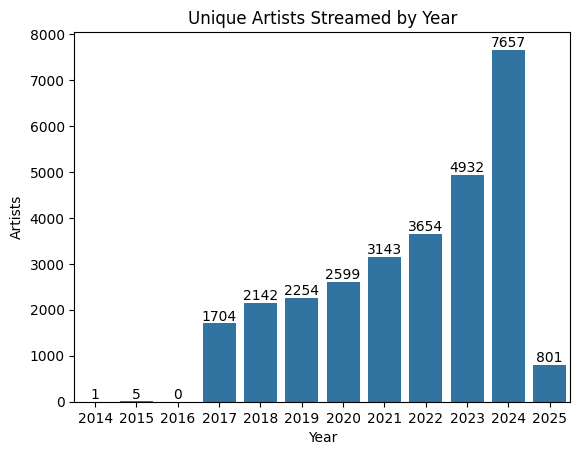

In [73]:
# Plot the barplot without error bars and with ordered categories.
ax = sns.barplot(
    x="year_streamed", 
    y="unique_artist_count", 
    data=unique_artists_per_year_df, 
    errorbar=None,  # Disable error bars
    # order=weekdays_order  # Set the order of the days
)

# Set a bar label to show amounts.
ax.bar_label(ax.containers[0], fontsize=10);

# Add title and labels for clarity
plt.title("Unique Artists Streamed by Year")
plt.xlabel("Year")
plt.ylabel("Artists")
plt.show()

I spent the first few years not listening to Spotify at all, or listening to the point the stream count was negligible, prior to there being large amounts of consistent streaming activity coupled with consistent year over year growth.

As my time on the platform increases, I seem to be seeking out more and more new artists. In spite of my own self-image being one of "binge-listening" until I get sick of tracks, I appear to be landing on fresh artists yearly. 

### Top Artists for Every Year

We will focus on obtaining the top 5 artists by stream count per year.

In [123]:
query = """
-- Find the top artists per year by stream count. We use a lateral JOIN to avoid unnecessary row scans.
WITH yearly_counts AS (
    SELECT 
        artist_name
        ,date_part('year', timestamp_column)::INT AS year_streamed 
        ,COUNT(*) AS ts_count
    FROM spotify_data
    WHERE ms_played > 5000
    GROUP BY 
        artist_name
        ,year_streamed
)
SELECT 
    y.year_streamed
    ,top_artist.artist_name
    ,top_artist.ts_count
FROM (
    SELECT DISTINCT date_part('year', timestamp_column)::INT AS year_streamed
    FROM spotify_data
) y
LEFT JOIN LATERAL (
    SELECT 
        artist_name
        ,ts_count
    FROM yearly_counts yc
    WHERE yc.year_streamed = y.year_streamed
    ORDER BY ts_count DESC
    LIMIT 5
) top_artist ON true
ORDER BY y.year_streamed ASC;
"""

The `LATERAL` join is used to act as a "for loop," processing each distinct year individually. The query then orders the results by the year ascending and the stream count descending.

In [124]:
# Find the top artists per year by stream count.
top_5_artists_per_year_df = fetch_query_results(query)

# Sample the results
top_5_artists_per_year_df.head()

,year_streamed,artist_name,ts_count
0,2014,Ron Basejam,1
1,2015,Lars Behrenroth,3
2,2015,Pelican,1
3,2015,Prof.Sakamoto,1
4,2015,Scott Walker,1


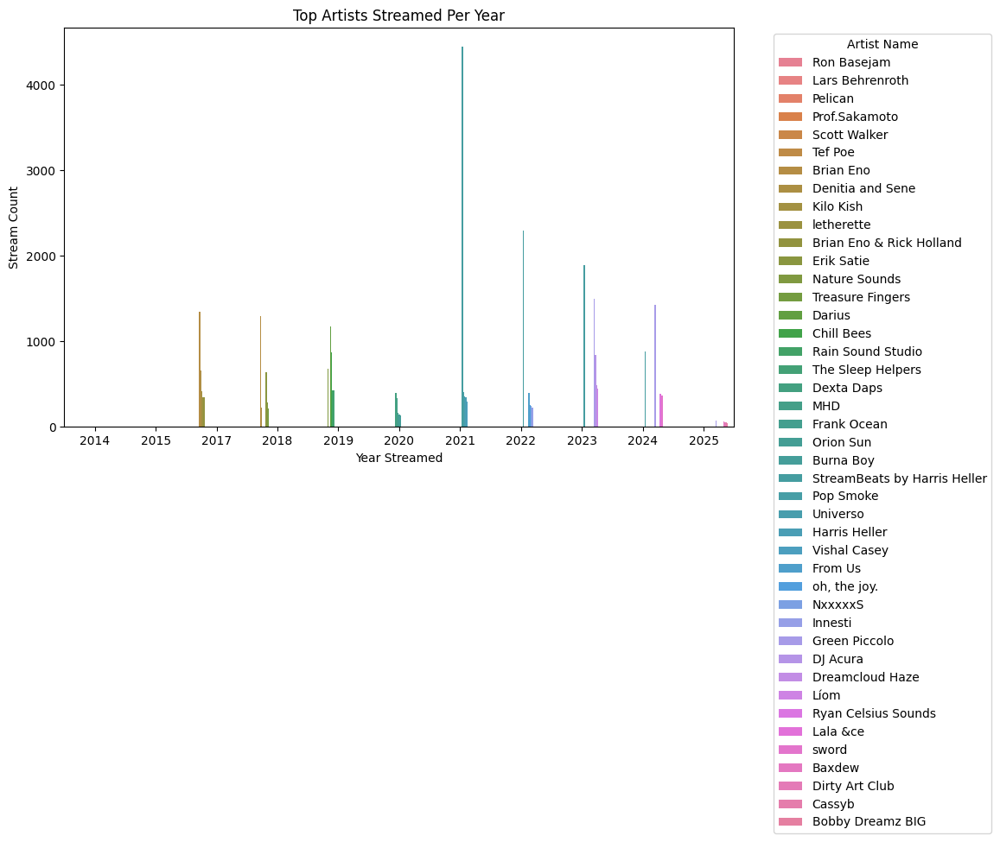

In [78]:
# Create the clustered column chart (grouped bar chart)
plt.figure(figsize=(10, 6))
ax = sns.barplot(data=top_5_artists_per_year_df, x="year_streamed", y="ts_count", hue="artist_name", dodge=True)
# Labels and title
plt.xlabel("Year Streamed")
plt.ylabel("Stream Count")
plt.title("Top Artists Streamed Per Year")

# Show legend outside
plt.legend(title="Artist Name", bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()

The above chart is extremely UNREADABLE, so we can break down the results year by year, outputting a table for each year to introspect on them in isolation.

Index(['year_streamed', 'artist_name', 'ts_count'], dtype='object')


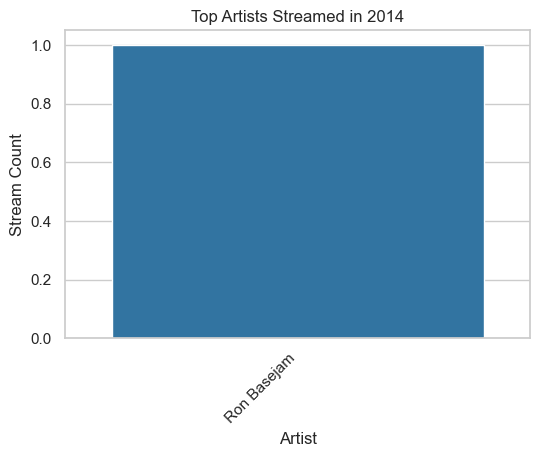

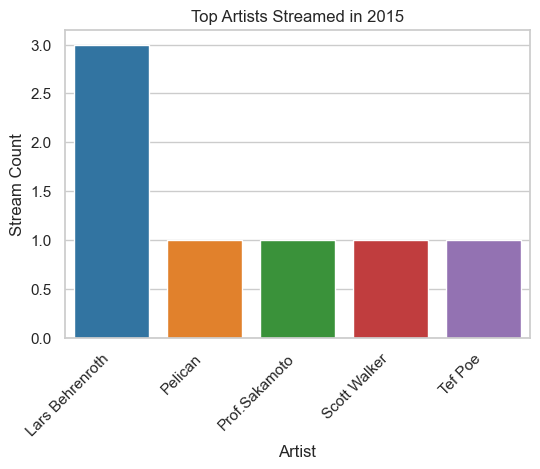

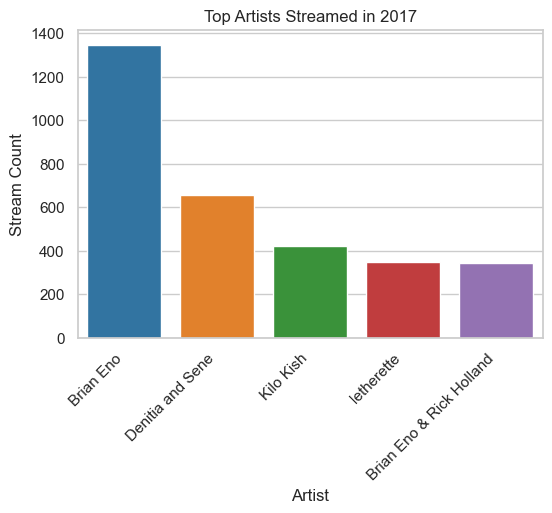

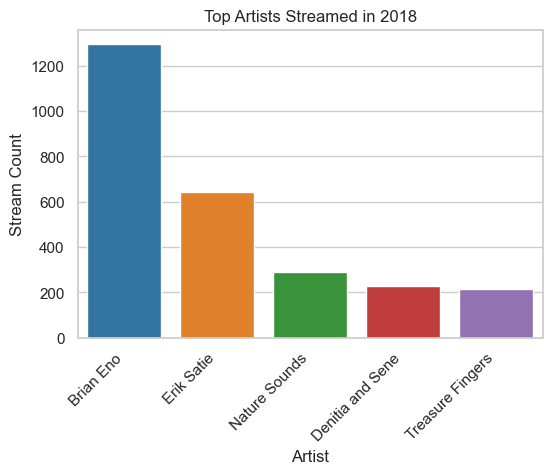

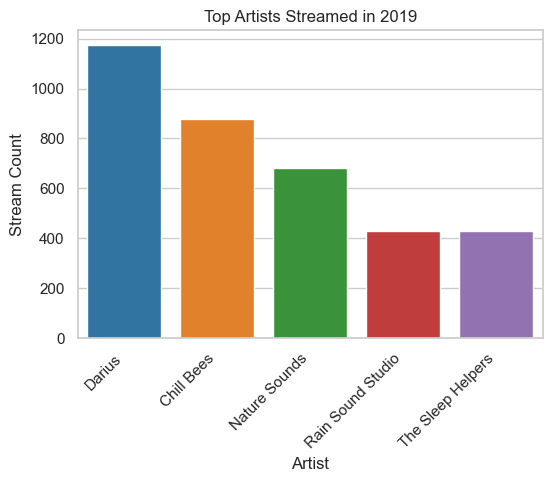

...

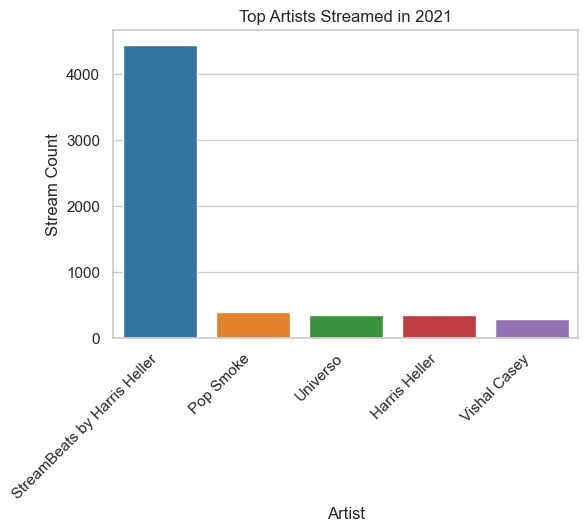

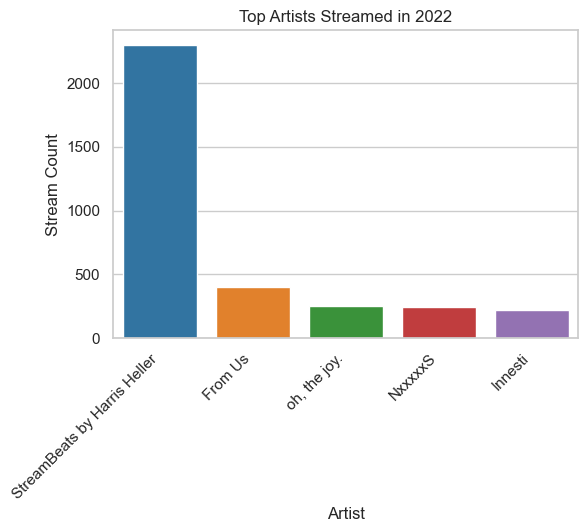

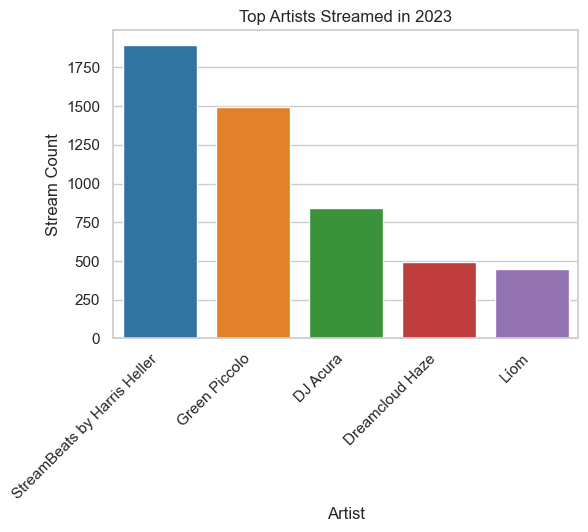

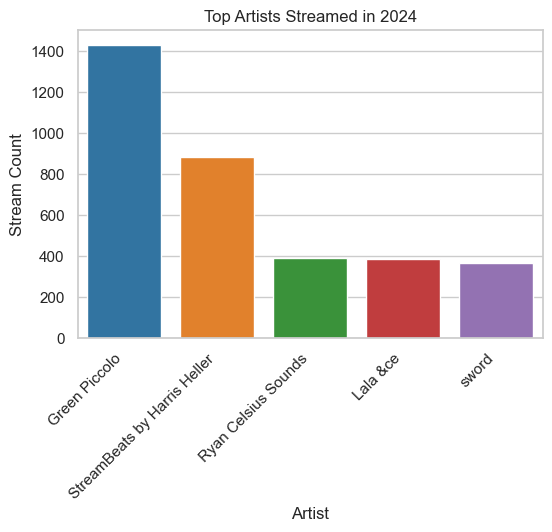

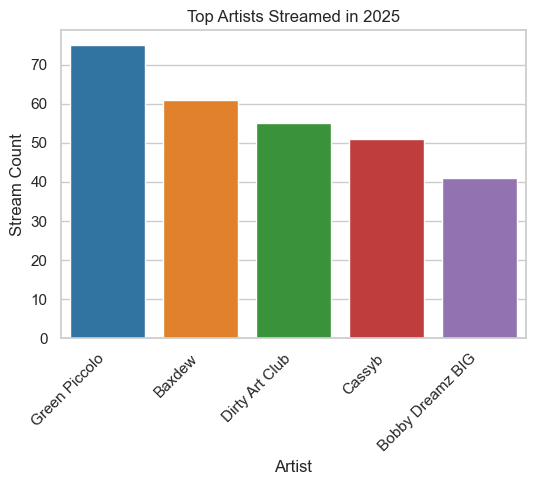

In [88]:
# Ensure the 'year_streamed' column exists and strip whitespace.
top_5_artists_per_year_df.columns = top_5_artists_per_year_df.columns.str.strip()

# Convert 'year_streamed' to integer type.
top_5_artists_per_year_df["year_streamed"] = top_5_artists_per_year_df["year_streamed"].astype(int)

# Confirm the column exists.
print(top_5_artists_per_year_df.columns)  # Should output Index(['year_streamed', 'artist_name', 'ts_count'], dtype='object')

# Set theme.
sns.set_theme(style="whitegrid")


# Group data by year and plot separately.
for year, group in top_5_artists_per_year_df.groupby("year_streamed"):

    # Assign a dummy hue to avoid annoying deprecation warnings.
    group["dummy_hue"] = group["artist_name"]
    
    plt.figure(figsize=(6, 4))  # Create a new figure for each plot.
    ax = sns.barplot(data=group, x="artist_name", y="ts_count", palette="tab10", hue="dummy_hue", legend=False)

    # Add labels and title
    plt.xlabel("Artist")
    plt.ylabel("Stream Count")
    plt.title(f"Top Artists Streamed in {year}")

    # Rotate x-axis labels for readability.
    plt.xticks(rotation=45, ha="right")

    # Show each plot separately.
    plt.show()

* **2015** is when our data starts, minimally with [Ron Basejam](https://open.spotify.com/artist/3LijUg92GG1XomQ1OkuvfD?si=et47ZoJoT3ib6ROFzy3THg). Never heard of this person before. I wonder why he was one of the first artists discovered.
* **2016** with the exception of [Lars Behrenroth](https://open.spotify.com/artist/7mvD9STpAXPlADKNQAYxFP?si=__UqS2svQVOwPGxTPb86nw) and [Tef Poe](https://open.spotify.com/artist/0Wqbw2ZKno6MrvDcLpc0ax?si=hoLtP_zbTQS9KJPQ1_SK8A), most artists here are unrecognizable. I have acted as an executive producer for one of Lars' shows many moons ago.
* From **2017** - **2018** we see beginnings of the [Brian Eno](https://open.spotify.com/artist/7MSUfLeTdDEoZiJPDSBXgi?si=h36SrxlkSWuAjIPANd0B6w) era. Other artists I have found memories of being [denitia and sene](https://open.spotify.com/playlist/5vznv7lzMcvEAwYIKjIb3Q?si=6864ffc0347b43bc) and [Kilo Kish](https://open.spotify.com/artist/7lsnwlX6puQ7lcpSEpJbZE?si=dcVYR6xHTUilpbs50A14WA).
* In **2019**, we see the atmospheric, sleep, and nature sounds strewn about. Oddly enough I may never have known I listened to [The Sleep Helpers] if not for this project.
* **2020** dominated by my binging of reggae with Dexta Daps and Burna Boy. Melancholic R&B championed by Orion Sun and Frank Ocean. MHD being present here echoes the Francophone influence we uncover later on in our analysis.
* **2021** - **2022** indicates the beginning of my content creation and streaming career, with Harris Heller being my DMCA-safe background music. With the exception of [Pop Smoke](https://open.spotify.com/artist/0eDvMgVFoNV3TpwtrVCoTj?si=wKkfPiayQ5O1J7zKffZfPQ) and [NxxxxxS](https://open.spotify.com/artist/36r4ltZmLqtiDBdAs9XSqn?si=di0aqfr2SXiuQ8bafhjbyA), I really do not recognize any other artist in this time period.
* My fixation on the `phonk` genre takes off in **2023** onwards, with [Green Piccolo](https://open.spotify.com/artist/0Of8ndqAY23l2wV3sS6Zez?si=WL0_qdc5Rsq1pOF9OG0bXg), [DJ Acura](https://open.spotify.com/artist/5b8G38VIrYrOdzKocAOH4n?si=v3joabOmQfiNvUiKA_gZJw), [Ryan Celsius Sounds](https://open.spotify.com/artist/2AtYJoC6VmUtkxonmVnbVR?si=-EbJYW_UQX2EtAaeotxbKw), and [Baxdew](https://open.spotify.com/artist/2SQGn8IQmPyUTO6oJtejAl?si=K0IjyLzqSjuIzwyAszGpJw) taking up more slots in the top 5 plots drawing closer to present day. What intrigues me the most is that these artists are "underground," more likely to have cultivated audiences on alternative platforms like SoundCloud or by other means.

### Total Milliseconds Spent Listening to Top Artists

With over a decade of data, we scope our answer to yearly time periods. Our method to isolate this can build on prior art:
1. Isolate the number one artist by streams, per year, for all years.
2. Aggregate all songs, solo or collaborative, including this artist.
3. Calculate the total streaming time in milliseconds and in a "human-readable" format.
4. Compare the total milliseconds streamed by the top artist versus the total amount of milliseconds stream for that year.

As we have calculated the top 5 artists by streams already, we need only select the most streamed artist per year from this data.

In [127]:
query = """
-- Reuse previous query but limit results to one artist per year
WITH yearly_counts AS (
    SELECT 
        artist_name
        ,date_part('year', timestamp_column)::INT AS year_streamed 
        ,COUNT(*) AS ts_count
    FROM spotify_data
    WHERE ms_played > 5000
    GROUP BY 
        artist_name
        ,year_streamed
)
SELECT 
    y.year_streamed
    ,top_artist.artist_name
    ,top_artist.ts_count
FROM (
    SELECT DISTINCT date_part('year', timestamp_column)::INT AS year_streamed
    FROM spotify_data
) y
LEFT JOIN LATERAL (
    SELECT 
        artist_name
        ,ts_count
    FROM yearly_counts yc
    WHERE yc.year_streamed = y.year_streamed
    ORDER BY ts_count DESC
    LIMIT 1
) top_artist ON true
ORDER BY y.year_streamed ASC;
"""

In [128]:
# Find time spent listening to top artists.
top_artists_per_year_df = fetch_query_results(query)
top_artists_per_year_df

,year_streamed,artist_name,ts_count
0,2014,Ron Basejam,1
1,2015,Lars Behrenroth,3
2,2017,Brian Eno,1348
3,2018,Brian Eno,1294
4,2019,Darius,1174
5,2020,Dexta Daps,398
6,2021,StreamBeats by Harris Heller,4442
7,2022,StreamBeats by Harris Heller,2297
8,2023,StreamBeats by Harris Heller,1895
9,2024,Green Piccolo,1430


To save time and effort, we generate SQL snippets with code iterating over the top artists for each year parameterizing SQL queries that we will eventually combine into a singular dataframe capturing how much time the top artists were played per year. 

In [102]:
# Create a list to store rows from our queries
combined_rows = []

# Iterate over artist + year combinations
for index, row in top_artists_per_year_df.iterrows():
    artist = row["artist_name"]
    year = int(row["year_streamed"])

    # Query for artist playtime.
    artist_query = text("""
        SELECT
            date_part('year', timestamp_column)::int AS year_streamed,
            SUM(ms_played) AS total_artist_ms_played
        FROM spotify_data
        WHERE artist_name ILIKE :artist_pattern
          AND date_part('year', timestamp_column)::int = :year
        GROUP BY year_streamed
    """)

    # Query for total playtime that year.
    total_query = text("""
        SELECT
            date_part('year', timestamp_column)::int AS year,
            SUM(ms_played) AS total_ms_played
        FROM spotify_data
        WHERE date_part('year', timestamp_column)::int = :year
        GROUP BY year
    """)

    # Execute queries
    with engine.connect() as conn:
        artist_result = conn.execute(
            artist_query, {"artist_pattern": f"%{artist}%", "year": year}
        ).fetchone()

        total_result = conn.execute(
            total_query, {"year": year}
        ).fetchone()

    # Skip if either query yields nothing
    if artist_result is None or total_result is None:
        continue

    # Unpack the results
    year_streamed, total_artist_ms_played = artist_result
    _, total_ms_played = total_result

    # Append combined results
    combined_rows.append({
        "year_streamed": year_streamed,
        "artist_name": artist,
        "total_artist_ms_played": total_artist_ms_played,
        "total_ms_played": total_ms_played,
        "artist_share": total_artist_ms_played / total_ms_played
    })

# Build final DataFrame
time_listened_top_artists_df = pd.DataFrame(combined_rows)


In [114]:
# Armed with a dataframe with time listening to top artists, we can converts ms
# into hours to more easily measure listening activity.
time_listened_top_artists_df['total_artist_hours_played'] = time_listened_top_artists_df['total_artist_ms_played'] / 3600000

# Convert artist share (x/1) to percentage
time_listened_top_artists_df['percentage_artist_share'] = time_listened_top_artists_df['artist_share'] * 100

time_listened_top_artists_df

,year_streamed,artist_name,total_artist_ms_played,total_ms_played,artist_share,total_artist_hours_played,percentage_artist_share
0,2014,Ron Basejam,345730,345730,1.000000,0.096036,100.000000
1,2015,Lars Behrenroth,459475,663391,0.692616,0.127632,69.261567
2,2017,Brian Eno,579718682,4136121442,0.140160,161.032967,14.015998
3,2018,Brian Eno,506806758,4227769631,0.119876,140.779655,11.987568
4,2019,Darius,251337405,7075897806,0.035520,69.815946,3.552021
5,2020,Dexta Daps,75273949,3747164747,0.020088,20.909430,2.008824
6,2021,StreamBeats by Harris Heller,599903147,8781157419,0.068317,166.639763,6.831709
7,2022,StreamBeats by Harris Heller,309252413,7394639284,0.041821,85.903448,4.182116
8,2023,StreamBeats by Harris Heller,258420940,7917803004,0.032638,71.783594,3.263796
9,2024,Green Piccolo,247078638,7219201694,0.034225,68.632955,3.422520


This information mostly coincides with our "Top Artists" assessment.  I observe an interesting set of "eras" in the top artists. [Ron Basejam](https://open.spotify.com/artist/3LijUg92GG1XomQ1OkuvfD?si=b-IE8_BrQGKzmQVKYI3BFQ) and [Lars Behrenroth](https://open.spotify.com/artist/7mvD9STpAXPlADKNQAYxFP?si=6zXmlYYTTdykdEvwxCZaww) being within the Dance/Electronic genres. The presence of Brian Eno and [Darius](https://open.spotify.com/artist/5vfEaoOBcK0Lzr07WN8KaK?si=8i-1vizvRN2fKucoToG5aA) seems a bit more atmospheric; both artists producing ambient, downtempo electronic music. Much less "danceable."  A hard pivot to Dancehall Reggae with [Dexta Daps](https://open.spotify.com/artist/28UDeKu2FPrU0T7dpUiSGY?si=jlaoTooRQie4rHh4BGQ31A); I suspect I binge-listened to "Breaking News" due to the provocative lyrics and the story they told. 
[Harris Heller](https://open.spotify.com/artist/6GTRLqqiBPUqaOgyxOraHp?si=f7LpJKWmSfuNMkubDkEncg)'s three years of heavy rotation was derived from my streaming career and needing to have music free from DMCA restrictions to use to add background to my streams; the genres produced by Harris Heller can vary, but I would generally use Lo-Fi or House Music. [Green Piccolo](https://open.spotify.com/artist/0Of8ndqAY23l2wV3sS6Zez?si=XAxVLIfHR--WLumst1PykA) is a Phonk artist from Europe, with that genre being an eclectic amalgam of African American music across several different decades.
.


In [113]:
time_listened_top_artists_df['total_artist_hours_played'].describe()

count     11.000000
mean      71.754835
std       62.809325
min        0.096036
25%       12.245595
50%       69.815946
75%      113.341552
max      166.639763
Name: total_artist_hours_played, dtype: float64

In [115]:
time_listened_top_artists_df['percentage_artist_share'].describe()

count     11.000000
mean      20.186927
std       32.818172
min        2.008824
25%        3.476301
50%        4.182116
75%       13.001783
max      100.000000
Name: percentage_artist_share, dtype: float64

Quite surprised that the average time listening to a favorite artists is around **71.8** hours per year. The percentage of my total streaming time for a favorite artists falls in the range of **3.53%** and **4.18%** for the past four years. 

### Number of Genres Listened to for the Year

Spotify does not bundle genre information with individual tracks. Genre associations are tied to artists instead of songs. This design decision on Spotify's part seems efficient. You save tons of storage space that would be "wasted" storing this information within tracks.  It is _possible_ to infer what genre a song is strictly by the artist, assuming the artist has consistency within their catalog. 

What this fails to account for is the possibility of artists potentially shifting or changing genres on a per-track basis. It may also be a challenge if songs have more than one collaborator, from a diverse genre, which may render deciding a song's genre even more challenging. Which artist's genre should take precedence in this scenario? Despite these corner cases, I suspect that Spotify felt the edge cases did not override the generalized ability to identify a song's genre based on the artist.

With genres present in the `artists` table from our previous work, we can determine how many unique genres were listened to, partitioning by year.

Using a CTE, we "unnest" the genres from the `genres` column in the `artists` table, while joining with the `sd_artists_join` and `spotify_data` table, while also ensuring we do not count records that are null, empty, nor tracks that have not been played longer than 5 seconds (5000 ms).

After this, we use another CTE to generate distinct genres per year, which we subsequently aggregate via the `COUNT` function. We are not concerned with how often a genre appeared in a year, just that it appeared at all. We can then output each year and how many genres are present in our streaming history per year.

#### Plotting Unique Genre Counts Per Year

In [49]:
query = """
-- Find how many unique genres were played per year 
WITH genre_year_cte AS (
    SELECT
        DISTINCT UNNEST(a.genres) AS genre
        ,DATE_PART('year', sd.timestamp_column)::INT AS stream_year
    FROM artists a
    JOIN sd_artists_join sdj
        ON a.id = sdj.artist_id
    JOIN spotify_data sd
        ON sdj.sd_id = sd.id
    WHERE a.genres IS NOT NULL
      AND a.genres != '{}'
      AND sd.ms_played > 5000
),
distinct_genres_per_year AS (
    SELECT 
        stream_year
        ,genre
    FROM genre_year_cte
    GROUP BY 
        stream_year
        ,genre
)
SELECT
    stream_year
    ,COUNT(*) AS unique_genre_count
FROM distinct_genres_per_year
GROUP BY stream_year
ORDER BY stream_year ASC;
"""

In [50]:
# Query DB for unique genres per year.
unique_genre_counts_per_year_df = fetch_query_results(query)
unique_genre_counts_per_year_df

,stream_year,unique_genre_count
0,2015,1
1,2017,309
2,2018,344
3,2019,356
4,2020,392
5,2021,403
6,2022,428
7,2023,483
8,2024,554
9,2025,112


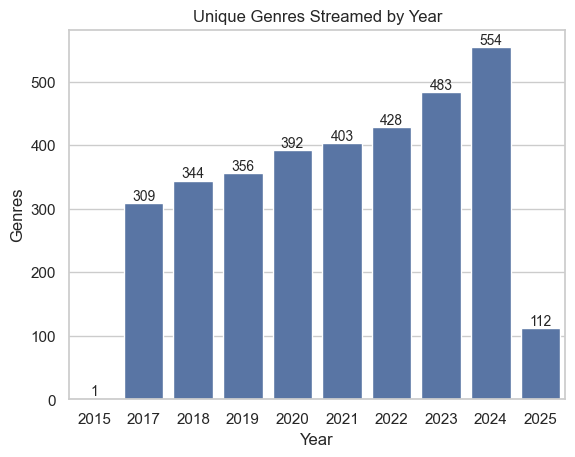

In [121]:
# Plot the barplot without error bars and with ordered categories
ax = sns.barplot(
    x="stream_year", 
    y="unique_genre_count", 
    data=unique_genre_count_per_year_df, 
    errorbar=None,  # Disable error bars
    # order=weekdays_order  # Set the order of the days
)

# Set a bar label to show amounts
ax.bar_label(ax.containers[0], fontsize=10);

# Add title and labels for clarity
plt.title("Unique Genres Streamed by Year")
plt.xlabel("Year")
plt.ylabel("Genres")
plt.show()

We see a gradual increase in unique genres played per year. The plot edges are explainable outliers, with the initial meteoric rise of my earnest use Spotify starting in **2017** and the partial data present for the current year of **2025**.

### Top Genres for the Year

To answer this question, we will consider a "Top Genre" to be a genre played heavily during a yearly time period. This will rely on the elapsed time detailed by `ms_played` field in the `spotify_data` table, and will be determined by the number of songs played in any respective genre. We are using the actual time listened, not the number of tracks listened to.

To craft the SQL query for this, we use two CTEs. The first will provide the `ms_played` along with initial artist and `genres` column data. We then "unnest" the `genres` column, sum the elapsed time for each genre, partitioning by the year for our ranking. Since we want the "top" genres, we filter the genres by their ranking, limiting the amount to ranks less than 10. This is not precise, as ranking "ties" mean that genres may have the same numeric rank.

In [111]:
query = """
-- Generate Top Genres per Year
WITH artist_playtime AS (
	SELECT a.artist_name
		,a.genres
		,sd.ms_played
		,DATE_PART('year', sd.timestamp_column)::INT AS stream_year
	FROM artists AS a
	JOIN sd_artists_join AS sdj 
		ON a.id = sdj.artist_id
	JOIN spotify_data AS sd 
		ON sdj.sd_id = sd.id
),
genre_ranks AS (
	SELECT
		stream_year,
		UNNEST(genres) AS genre,
		ROUND((CAST(SUM(ms_played) AS numeric)  / 3600000) , 2) AS hours_played,
		RANK() OVER (
			PARTITION BY stream_year
			ORDER BY SUM(ms_played) DESC
		) AS genre_rank
	FROM artist_playtime
	GROUP BY stream_year, genre
)
SELECT *
FROM genre_ranks
WHERE genre_rank <= 10
ORDER BY stream_year, genre_rank
"""

In [112]:
# Execute query to find the top genres per year.
top_genres_per_year_df = fetch_query_results(query)

# Peruse top genres per year.
top_genres_per_year_df

,stream_year,genre,hours_played,genre_rank
0,2015,deep house,0.13,1
1,2015,dark ambient,0.00,2
2,2015,doom metal,0.00,2
3,2015,drone,0.00,2
4,2015,sludge metal,0.00,2
...,...,...,...,...
91,2025,memphis rap,6.76,6
92,2025,lo-fi hip hop,3.79,7
93,2025,rally house,2.15,8
94,2025,trip hop,1.93,9


#### Pivot Table Exploration 

We will explore this dataframe using a pivot table, since this enables us to unravel how highly genres rank in a tabular fashion.

In [113]:
# Create pivot dataframe
top_genre_pivot = top_genres_per_year_df.pivot(index='stream_year', columns='genre', values='genre_rank').fillna('-')

# Modify display options to show all columns
pd.set_option('display.max_columns', None)

top_genre_pivot

genre,afro house,afro soul,afrobeat,afrobeats,afropop,afroswing,alternative r&b,ambient,art rock,avant-garde,chillwave,city pop,dancehall,dark ambient,deep house,doom metal,drift phonk,drone,french house,french r&b,french rap,glam rock,grupera,indie soul,jazz beats,jazz rap,krautrock,lo-fi,lo-fi beats,lo-fi hip hop,lo-fi house,memphis rap,minimalism,neoclassical,nu disco,phonk,pop urbaine,rally house,rumba congolaise,sludge metal,soca,space music,space rock,synthwave,trip hop,vaporwave
stream_year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015,-,-,-,-,-,-,-,-,-,2.0,-,-,-,2.0,1.0,2.0,-,2.0,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,2.0,-,-,-,-,-,-
2017,-,-,-,-,-,-,8.0,1.0,7.0,-,-,-,-,-,-,-,-,2.0,-,-,-,6.0,-,-,-,-,5.0,-,-,-,-,-,3.0,10.0,-,-,-,-,-,-,-,4.0,9.0,-,-,-
2018,-,-,-,-,-,-,-,1.0,7.0,-,-,-,-,-,-,-,-,2.0,-,-,-,6.0,-,-,-,-,5.0,10.0,9.0,-,-,-,3.0,-,-,-,-,-,8.0,-,-,4.0,-,-,-,-
2019,-,-,-,-,-,-,10.0,3.0,-,-,-,-,-,-,-,-,-,5.0,4.0,-,-,-,-,1.0,-,-,-,-,9.0,-,7.0,-,6.0,-,2.0,-,-,-,-,-,-,8.0,-,-,-,-
2020,1.0,10.0,3.0,2.0,5.0,7.0,-,-,-,-,-,-,4.0,-,-,-,-,-,-,-,8.0,-,-,-,-,-,-,-,-,-,-,-,-,-,-,-,6.0,-,-,-,9.0,-,-,-,-,-
2021,-,-,-,-,-,-,7.0,5.0,-,-,-,-,-,-,-,-,-,-,-,9.0,6.0,-,10.0,-,-,-,-,3.0,-,-,-,-,1.0,-,-,-,8.0,-,-,-,-,2.0,-,4.0,-,-
2022,-,-,-,-,-,-,-,1.0,-,-,-,8.0,-,7.0,-,-,-,4.0,-,-,-,-,-,-,-,-,-,5.0,9.0,-,-,-,2.0,-,-,10.0,-,-,-,-,-,3.0,-,6.0,-,-
2023,-,-,-,-,-,-,-,1.0,-,-,-,-,-,6.0,-,-,9.0,2.0,-,-,-,-,-,-,-,-,-,4.0,5.0,-,-,-,-,-,-,8.0,-,-,-,-,-,3.0,-,7.0,-,10.0
2024,-,-,-,-,-,-,-,2.0,-,-,9.0,-,-,-,-,-,8.0,10.0,-,-,-,-,-,-,-,-,-,3.0,1.0,-,-,-,-,-,-,6.0,-,-,-,-,-,7.0,-,4.0,-,5.0


As expected, minimal activity is seen in **2015** and a small amount of genres present.

From **2017** through **2019** there were large amounts of genre diversity. The history communicates interest in `art rock`, `ambient`, `drone`, `lo-fi beats`, and `alternative r&b`. I seem to be "kicking the tires" on the platform and stumbling upon things.

The years of **2020** through **2025** shows a shift to more stable listening habits. "Lo-Fi" family genres dominate, such as `lo-fi beats`, `lo-fi hip hop`, and the mall-like resonance of `vaporwave.` Previous genres like `drone` and `ambient` still have presence, implying I have a preference for atmospheric, introspective music.

My tastes appear to be changing organically...or are being guided.

#### How Many Times are Genres in the Top 10?

While we can visually inspect the pivot dataframe and glean by eye what genres appeared in the top ranking by elapsed time played, we can introspect on the original dataframe easily with `value_counts` with some method chaining, and see if there are any dominant genres across all years.

In [114]:
# Count how many times a genre has appeared in the top 10 ranking by time elapsed.
top_genres = top_genres_per_year_df['genre'].value_counts().head(10)

# Peruse top genres.
top_genres

genre
drone              7
ambient            7
space music        7
lo-fi              6
lo-fi beats        6
minimalism         5
synthwave          4
phonk              4
alternative r&b    3
drift phonk        3
Name: count, dtype: int64

No single genre seems on top for all years, but `ambient`, `drone`, and `lo-fi` beats have repeated presence in the top genres. 

I was initially flabbergasted to not see any `*phonk*` topping the charts, but we must recall that this is based on _elapsed time_, not the _volume_ of individual tracks played. Instrumental style genres may have longer track playing times, to add to the intrigue.

In [129]:
# Find out how many times a genre held the number one spot across listening history.
top_rank_genre = top_genres_per_year_df[top_genres_per_year_df['genre_rank'] == 1]

# Count the genre instances.
top_rank_genre_counts = top_rank_genre['genre'].value_counts()

# Peruse top_rank_genre_counts.
top_rank_genre_counts

genre
ambient        4
lo-fi beats    2
deep house     1
indie soul     1
afro house     1
minimalism     1
Name: count, dtype: int64

Again, `ambient` rules the yard with **4** top finishes, with `lo-fi beats` only having half the amount.

To get a sense about _how much_ actual time we played each of these genres, we can group our original dataframe by the genre name, sum the hours played then sort in descending order.

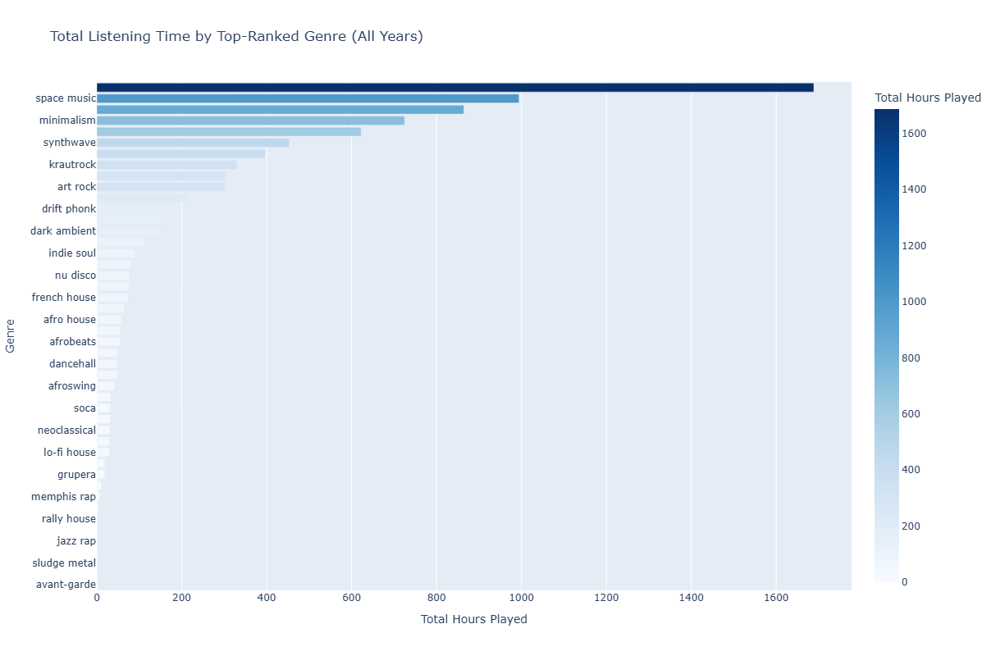

In [118]:
# Compute total hours played per genre (top-ranked only).
genre_totals = (
    top_genres_per_year_df
    .groupby('genre')['hours_played']
    .sum()
    .sort_values(ascending=False)
)

# Convert to dataframe
genre_df = genre_totals.reset_index()

# Create horizontal bar chart
fig = px.bar(
    genre_df,
    x='hours_played',
    y='genre',
    orientation='h',
    color='hours_played',
    color_continuous_scale='Blues',
    labels={'hours_played': 'Total Hours Played', 'genre': 'Genre'},
    title='Total Listening Time by Top-Ranked Genre (All Years)'
)

# Make highest value on top
fig.update_layout(yaxis=dict(categoryorder='total ascending'))
fig.update_layout(height=800)  # Increase height for readability

fig.update_traces(marker_line_width=0.5)

fig.show()


I wondered how much _total_ time I have listened to Spotify from the first listening session to our data-collection date of January 25, 2025.

In [119]:
query = """
-- What is the total time we have listened to *EVERYTHING* on Spotify
SELECT ROUND((CAST(SUM(ms_played) AS numeric)  / 3600000) , 2) AS total_hours_played
FROM spotify_data
"""

In [120]:
# Execute a query to populate our dataframe to find total listening time in hours.
total_historic_listening_time_df = fetch_query_results(query)

# View total listening in hours for entire Spotify history.
total_historic_listening_time_df

,total_hours_played
0,14129.45


In [121]:
# How much of our listening history was `ambient`? (This is the first entry.)
(1688.50 / total_historic_listening_time_df.iloc[0]) * 100

total_hours_played    11.950217
Name: 0, dtype: float64

This ends up being **14129.45** hours, or ~**588.7** days of listening, with `ambient` eating up **11.95%** of our listening history.

#### What is `Space Music`?

Not going to lie, I have _never_ heard of `space music` and wondered why it ranked so highly.  Since the genres are associated with an artist, let's uncover who these folks might be from our database.

In [55]:
query = """
-- We must find the `space music` people
SELECT DISTINCT a.artist_name
	--,a.genres
	,ROUND((CAST(SUM(sd.ms_played) AS numeric)  / 3600000) , 2) AS hours_played
	--,SUM(sd.ms_played) AS time_played
	--,DATE_PART('year', sd.timestamp_column) AS stream_year
FROM artists AS a
JOIN sd_artists_join AS sdj 
	ON a.id = sdj.artist_id
JOIN spotify_data AS sd 
	ON sdj.sd_id = sd.id
WHERE 'space music' = ANY (a.genres)
GROUP BY a.artist_name
ORDER BY hours_played DESC
LIMIT 10
"""

In [56]:
# Query DB for `space music` genre tracks.
top_10_space_music_df = fetch_query_results(query)

# View the `space music` artists and the hours played.
top_10_space_music_df

,artist_name,hours_played
0,Brian Eno,317.10
1,Chihei Hatakeyama,56.44
2,Kilometre Club,39.93
3,Astral Wonder,34.69
4,zakè,33.14
5,Be Still the Earth,29.17
6,Soothe My Soul,26.49
7,Brian Eno & Rick Holland,26.26
8,Matooma,17.51
9,Dear Gravity,15.25


The presence of `space music` makes more sense now. I recognize the artist [Brian Eno](https://open.spotify.com/artist/7MSUfLeTdDEoZiJPDSBXgi?si=hpYRD84HSGO9De1pJWYgRA), as there was a time period I was placing his work on _heavy_ rotation, in addition to downloading his multiple [generative-music phone apps](https://apps.apple.com/us/app/brian-eno-reflection/id1180524479). The airy, atmospheric nature of his music I could see falling into a description akin to `space music`, although I would stereotypically associate the term with background music played over pulp fiction television shows like "Lost In Space."

This does validate the concern I had regarding the association of genres with artists, instead of individual songs. I may _not_ be listening to `space music`, but the artist I listen to may have work relating to that (figurative) space. The genre ranks highly in my history, but I had no idea such a genre even existed. It means increased classification ambiguity in exchange for data storage efficiency. 

### Top Podcasts

I do _not_ generally listen to podcasts, on any platform. I expect to find minimal amounts of listening activity in the data.

There is no direct column that delineates a track from a podcast, but this can be cautiously inferred from the presence of data in the `episode_show_name` and `episode_name` fields. Another interesting aspect of these records, is that none of the records having data present in`episode_show_name` and `episode_name` have any `artist_name` data.  

We should exercise caution with the inferring a record matching the above criteria definitively _is_ a podcast, as evidenced by the infamous `"EndIess [CDQ],"` the audio-only version of [Frankie Ocean's](https://open.spotify.com/artist/2h93pZq0e7k5yf4dywlkpM?si=WfT2R3fSSlS9qt22MVJ9iQ) visual album. This album appears in our search results, and is definitely not a podcast.

In [263]:
query = """
-- Find top podcasts per year.
WITH podcast_tracks AS (
	SELECT * FROM spotify_data
	WHERE 
		ms_played > 5000
	AND episode_show_name IS NOT NULL
	AND episode_name IS NOT NULL
	AND episode_show_name NOT ILIKE '%EndIess [CDQ]%'
)
SELECT DISTINCT episode_show_name
	,DATE_PART('year', timestamp_column) AS stream_year
	,ROUND((CAST(SUM(ms_played) AS numeric)  / 3600000) , 2) AS total_hours_played
FROM podcast_tracks
GROUP BY episode_show_name
    ,artist_name
    ,DATE_PART('year', timestamp_column)
ORDER BY
    DATE_PART('year', timestamp_column) ASC
    ,ROUND((CAST(SUM(ms_played) AS numeric)  / 3600000) , 2) DESC
"""

In [264]:
# Query DB for top podcasts per year.
total_podcasts_per_year_df = fetch_query_results(query)

# View top genres per year.
total_podcasts_per_year_df

,episode_show_name,stream_year,total_hours_played
0,Another Round,2017,1.10
1,TestingMusicvideos,2017,0.31
2,Amber Muse radio show,2018,0.21
3,Another Round,2019,0.95
4,The Athletic FC Podcast,2019,0.57
5,Amber Muse radio show,2019,0.09
6,Ethos Athletes Podcast,2019,0.00
7,Stuff You Should Know,2019,0.00
8,Linear Digressions,2020,2.33
9,The Athletic FC Podcast,2020,1.54


This query will find all records that possess non-null show names and episode names. Using a CTE, we then extract only distinctive show names, computing their total play time. We sort first by the year streamed in ascending order, then by the play time in descending order. This will provide a ranking of the podcasts by the amount of hours played, as well as sorting the records chronologically by year.

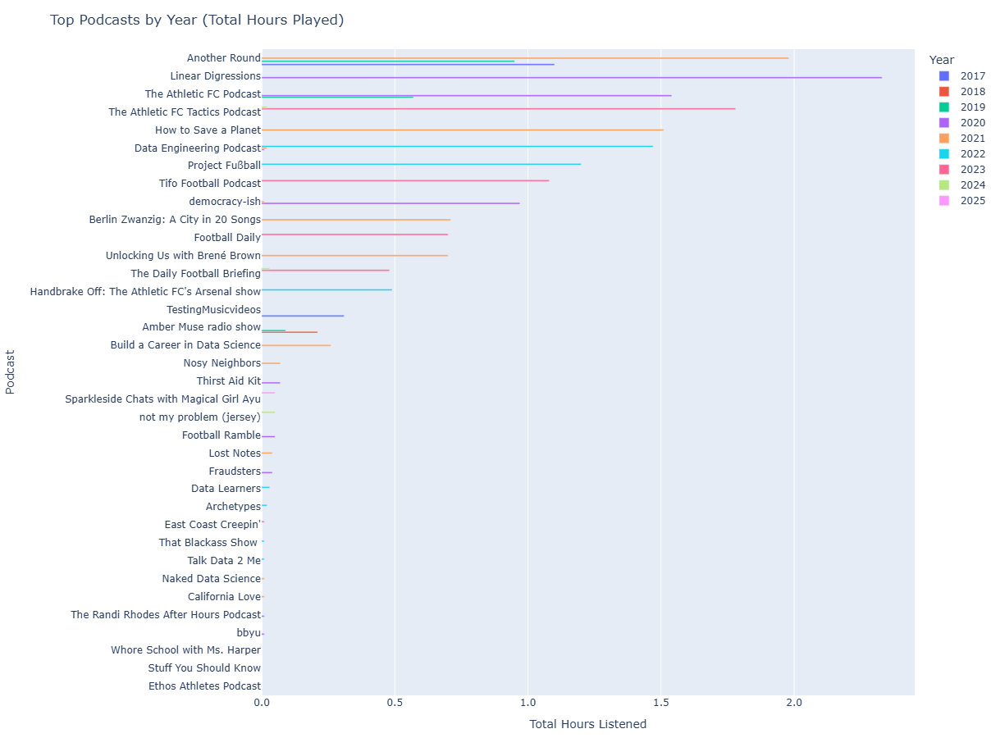

In [25]:
# Convert stream_year as a string for cleaner labels.
total_podcasts_per_year_df['stream_year'] = total_podcasts_per_year_df['stream_year'].astype(str)

# Sort by year and total hours to make the plot readable.
sorted_df = total_podcasts_per_year_df.sort_values(['stream_year', 'total_hours_played'], ascending=[True, False])

fig = px.bar(
    sorted_df,
    x='total_hours_played',
    y='episode_show_name',
    color='stream_year',
    orientation='h',
    title='Top Podcasts by Year (Total Hours Played)',
    labels={
        'episode_show_name': 'Podcast',
        'total_hours_played': 'Total Hours Listened',
        'stream_year': 'Year'
    },
    height=900,  # Adjust height to avoid overlapping bars
)

fig.update_layout(
    yaxis={'categoryorder': 'total ascending'},
    barmode='group',
    legend_title_text='Year',
    xaxis_tickformat='.1f',
    margin=dict(l=200, r=40, t=60, b=40),
)

fig.show()


To augment our analysis, we created a CSV to map podcast categories to each podcast from the following list:

* Comedy
* Football
* Data
* Environment
* Music
* Politics
* Other
* Anime
* Sports

In [58]:
# Load the manually podcast categorization mapping from the CSV.
category_map_df = pd.read_csv(DATA_PATH / 'podcast_categories.csv')

# Create the dictionary correctly.
category_map_dict = dict(zip(category_map_df["episode_show_name"],
                             category_map_df["category"]))

# Add the new category column to dataframe, using the dict to map. 
total_podcasts_per_year_df['category'] = total_podcasts_per_year_df['episode_show_name'].map(category_map_dict)

# Sample the results.
total_podcasts_per_year_df.head()

,episode_show_name,stream_year,total_hours_played,category
0,Another Round,2017,1.10,Comedy
1,TestingMusicvideos,2017,0.31,Comedy
2,Amber Muse radio show,2018,0.21,Music
3,Another Round,2019,0.95,Comedy
4,The Athletic FC Podcast,2019,0.57,Sports


After augmenting the data with categories, we can then plot out how podcasts are distributed across them.

In [60]:
# Count the number of times a podcast category appears.
podcast_category_counts = total_podcasts_per_year_df['category'].value_counts().reset_index()

# Rename columns for clarity.
podcast_category_counts.columns = ['category', 'podcast_count']

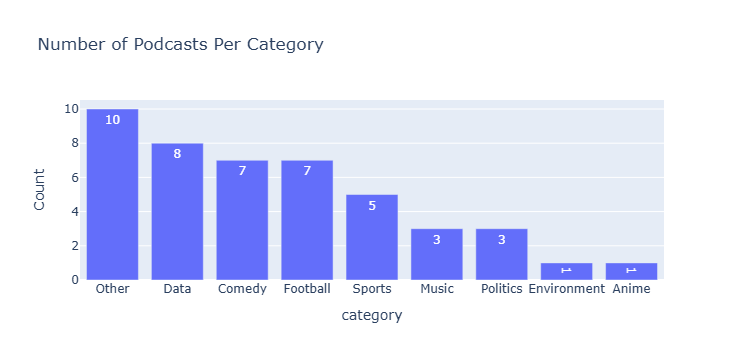

In [64]:
# Create a bar chart showing the number of podcasts per category.
fig = px.bar(
    podcast_category_counts,
    x="category",
    y="podcast_count",
    title="Number of Podcasts Per Category",
    text_auto=True
)
fig.update_layout(yaxis_title="Count")
fig.show()


It is not lost on me that the podcasts I enjoy seem to align with my personal interests over things I can control (data, comedy, football,) and less so on hot-button topics like Politics and the Environment, that I (personally) cannot control.  

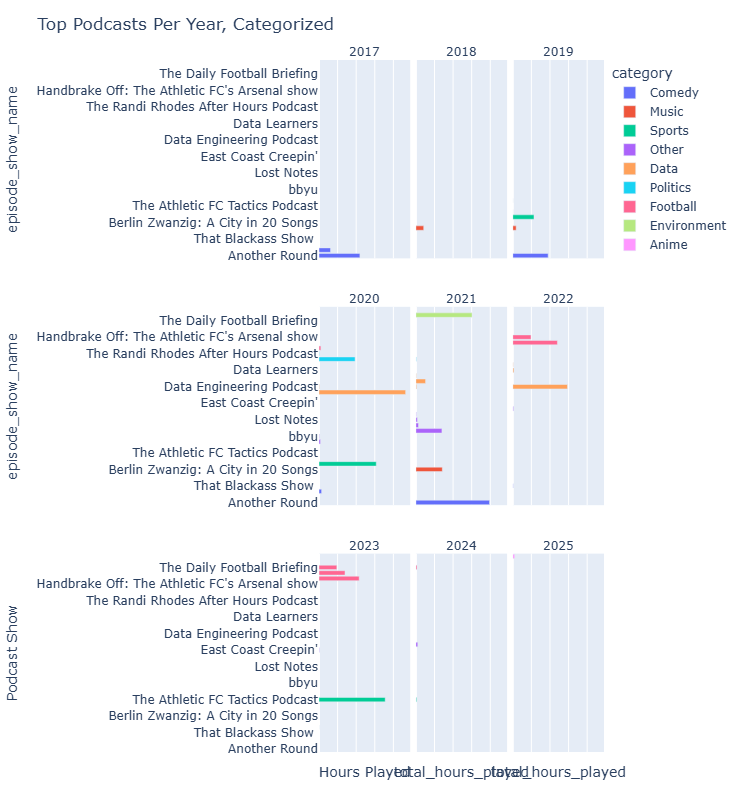

In [65]:
# Display categorized podcast data.
fig = px.bar(
    total_podcasts_per_year_df,
    x='total_hours_played',
    y='episode_show_name',
    color='category',
    facet_col='stream_year',
    facet_col_wrap=3,  # Adjust columns per row
    title="Top Podcasts Per Year, Categorized",
    height=800,
    width=1200
)

# Simplify facet labels by removing 'stream_year=' prefix.
fig.for_each_annotation(lambda a: a.update(text=a.text.split('=')[-1]))

# Clean up layout
fig.update_layout(
    showlegend=True,
    xaxis_title="Hours Played",
    yaxis_title="Podcast Show",
    margin=dict(l=80, r=20, t=60, b=60),
)

# Reduce tick clutter.
fig.update_xaxes(showticklabels=False)

fig.show()


Given my consistent desire to have a career in data, the prominence of data-related podcasts does not surprise me. I was not immediately aware of how often I played `Comedy` podcasts, at least to a level equivalent to `Football` shows.

The `Other` podcasts appear to be either variety shows, shows I cannot categorize due to their absence from the current Spotify catalog, or tracks mistakenly categorized as podcasts.

An interesting pattern, confirming my disinterest in podcasts generally, is that no podcast was _ever_ played more than once in any individual year. There are no shows that were ever played more than once in the same calendar year. Given this behavior, I will deem the "top podcasts" by the number of times played over the entire listening history.

I became curious as to how many _different_ podcasts I would play, each over the entire listening history. 

In [70]:
query = """
	SELECT 
        year_played as year
        ,episode_show_name
        ,COUNT(*) AS podcast_play_count 
        FROM spotify_data
	WHERE 
		ms_played > 5000
	AND episode_show_name IS NOT NULL
	AND episode_name IS NOT NULL
	AND episode_show_name NOT ILIKE '%EndIess [CDQ]%'
    GROUP BY
        year_played
        ,episode_show_name
"""

In [76]:
podcast_play_count = fetch_query_results(query)

In [77]:
# Get a sheer number of podcasts played of any kind.
podcast_play_count.groupby('year')['podcast_play_count'].sum()

year
2017     4
2018     2
2019     9
2020    43
2021    22
2022    22
2023    14
2024     4
2025     1
Name: podcast_play_count, dtype: int64

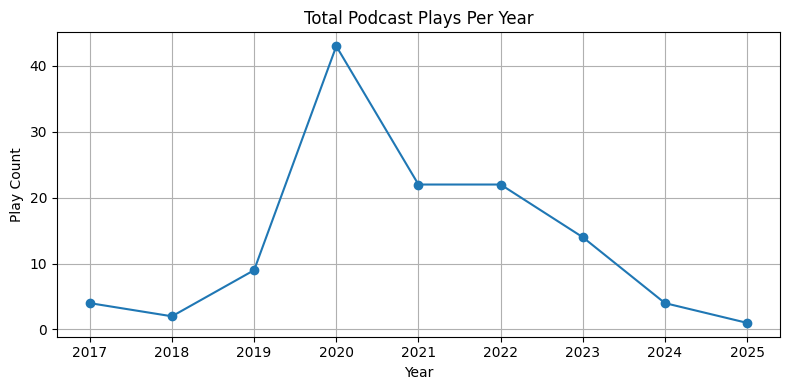

In [91]:
# Total podcast plays per year, we don't care if same show
# or multiple different shows.
podcast_plays_per_year = podcast_play_count.groupby('year')['podcast_play_count'].sum().reset_index()

# Line chart for total podcast plays per year.
plt.figure(figsize=(8, 4))
plt.plot(podcast_plays_per_year['year'], podcast_plays_per_year['podcast_play_count'], marker='o')
plt.title("Total Podcast Plays Per Year")
plt.xlabel("Year")
plt.ylabel("Play Count")
plt.grid(True)
plt.tight_layout()
plt.show()

**2020** gives the impression I am seeking out new content, new voices, new ideas on Spotify. But is this true? Since I know I have binge-style behaviors, we can reveal how many _distinct_ podcasts were listened to.

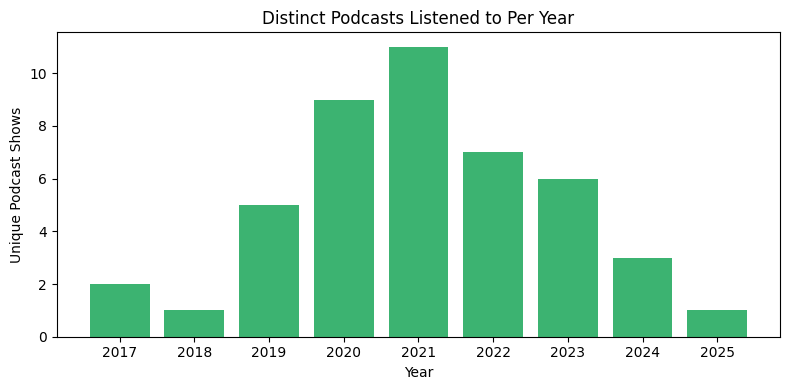

In [85]:
# Distinct podcasts per year
distinct_podcasts_per_year = podcast_play_count.groupby('year')['episode_show_name'].nunique().reset_index()
distinct_podcasts_per_year.columns = ['year', 'distinct_podcast_count']

# Bar chart with number of distinct podcasts played per year
plt.figure(figsize=(8, 4))
plt.bar(distinct_podcasts_per_year['year'], distinct_podcasts_per_year['distinct_podcast_count'], color='mediumseagreen')
plt.title("Distinct Podcasts Listened to Per Year")
plt.xlabel("Year")
plt.ylabel("Unique Podcast Shows")

# Force all year labels to show
plt.xticks(distinct_podcasts_per_year['year'])

plt.tight_layout()
plt.show()


An extremely "normal" looking distribution of distinct podcasts over the listening history, reaching the zenith in **2021**.

In [104]:
total_podcasts_per_year_df[total_podcasts_per_year_df['category'] == 'Sports']

,episode_show_name,stream_year,total_hours_played,category
4,The Athletic FC Podcast,2019,0.57,Sports
6,Ethos Athletes Podcast,2019,0.00,Sports
9,The Athletic FC Podcast,2020,1.54,Sports
35,The Athletic FC Tactics Podcast,2023,1.78,Sports
43,The Athletic FC Tactics Podcast,2024,0.02,Sports


* The top podcast over the entire listening is a `Comedy` podcast called [Another Round](https://open.spotify.com/show/6Fige4EyC2sg8jVVdQgIdN?si=e8c6090ae11c4e41). This show appears in the years **2017**, **2019**, and **2021**. I really enjoy revisiting this show, and hearing happy, joyful women laughing and joking together.
* **2020** onwards, I began to listen increasingly to more data-related content, such as [Linear Digressions](https://open.spotify.com/show/1JdkD0ZoZ52KjwdR0b1WoT?si=8c5f647ebd50492f) and the [Data Engineering Podcast](https://open.spotify.com/show/2iLvljRGVVIGlJshT5vNDS?si=e25a57ca8dc7469c).

* Increasing amounts of football podcasts, starting in **2019**.  I am subscribed to [The Athletic](https://www.nytimes.com/athletic/), am an Arsenal fan, and watch as much football as possible. The leadup to the 2022 World Cup in Qatar also contributed to higher consumption of football-related media. [Project Fußball](https://open.spotify.com/show/4uCsr5lakqLtuEwkVnxVUC?si=b9537a1aa5a8439e) and [Handbrake Off](https://open.spotify.com/show/3ANY129Bnkfhq4tSXytqhn?si=2a7ae58e8447477c) and [Tifo Football Podcast](https://open.spotify.com/show/06QIGhqK31Qw1UvfHzRIDA?si=3d63760305044150) being present is unsurprising.

### Time Spent Listening to Top Podcasts

Since our surfacing of podcasts appears to be singular in nature, we will simply group the data by the show name, total the hours played, then sort the resultant dataframe in descending order to see what shows come out on top.

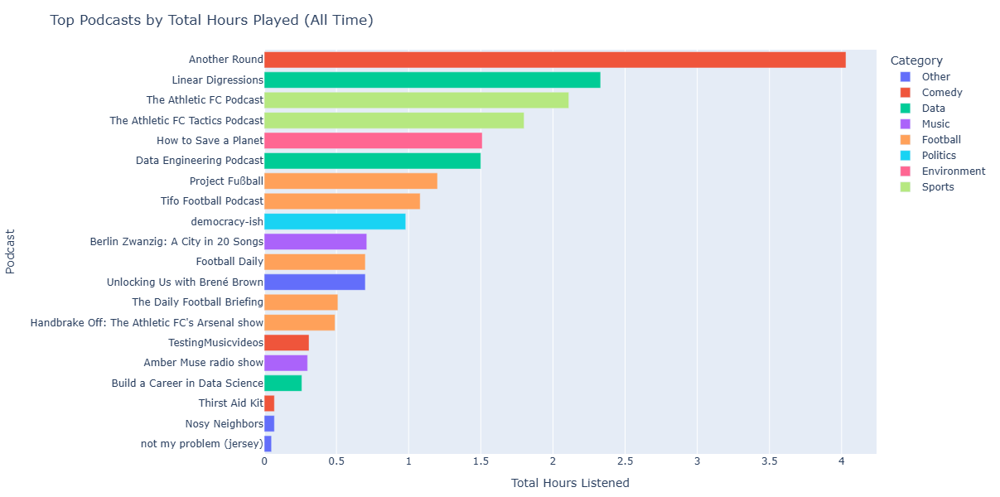

In [108]:
# Step 1: Aggregate by show and category.
podcast_total_df = (
    total_podcasts_per_year_df
    .groupby(['episode_show_name', 'category'], as_index=False)['total_hours_played']
    .sum()
    .sort_values('total_hours_played', ascending=True)
    .tail(20)  # Optionally select top 20
)

# Step 2: Plot using Plotly Express, color-coded by 'category.'
fig = px.bar(
    podcast_total_df,
    x='total_hours_played',
    y='episode_show_name',
    color='category',  # <--- Adds color grouping
    orientation='h',
    title='Top Podcasts by Total Hours Played (All Time)',
    labels={
        'episode_show_name': 'Podcast',
        'total_hours_played': 'Total Hours Listened',
        'category': 'Podcast Category'
    },
    height=600
)

fig.update_layout(
    yaxis=dict(categoryorder='total ascending'),
    margin=dict(l=200, r=40, t=60, b=40),
    legend_title='Category'
)

fig.show()


Viewing the cumulative playing time of podcasts is fine, but we can break down what was listened to and when in a more granular fashion. We can group this data by both the year played and their show names, then do faceted data display, along with color-categorization based on the podcast type. 

In [111]:
# Create a grouped dataframe for podcast data.
grouped_df = (
    total_podcasts_per_year_df
    .groupby(['stream_year', 'episode_show_name'], as_index=False)['total_hours_played']
    .sum()
    .sort_values(['stream_year', 'total_hours_played'], ascending=[True, False])
)

C:\Users\lover\AppData\Local\Temp\ipykernel_22112\2117497945.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



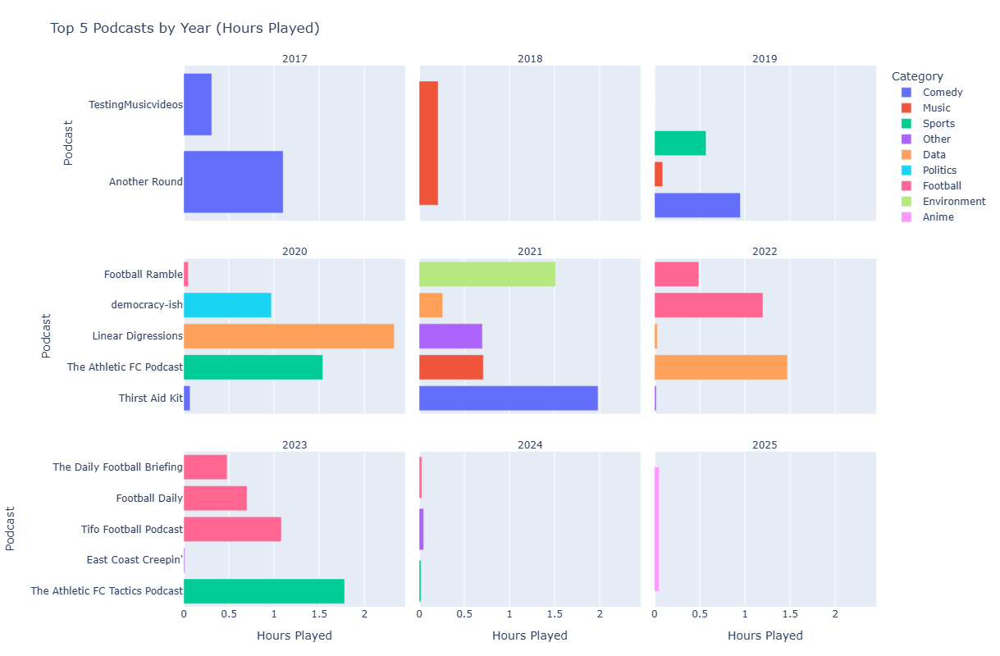

In [124]:
# We can limit to top N amount of shows per year, or expand this more fully
# to include all the podcasts in the history if we choose.

# Group by year and show, sum total hours.
grouped_df = (
    total_podcasts_per_year_df
    .groupby(['stream_year', 'episode_show_name', 'category'], as_index=False)['total_hours_played']
    .sum()
    .sort_values(['stream_year', 'total_hours_played'], ascending=[True, False])
)

# For each year, select the top 5 podcasts.
top_per_year = (
    grouped_df
    .groupby('stream_year', group_keys=False)
    .apply(lambda x: x.nlargest(5, 'total_hours_played'))
    .reset_index(drop=True)
)

# Create faceted horizontal bar charts.
fig = px.bar(
    top_per_year,
    x='total_hours_played',
    y='episode_show_name',
    color='category',
    facet_col='stream_year',
    facet_col_wrap=3,
    orientation='h',
    title='Top 5 Podcasts by Year (Hours Played)',
    labels={
        'stream_year': 'Year',
        'episode_show_name': 'Podcast',
        'total_hours_played': 'Hours Played',
        'category': 'Category'
    },
    hover_data=['category'],
    height=800
)

# Include layout tweaks for clarity
fig.update_layout(
    margin=dict(t=80, l=140, r=40, b=60),
    showlegend=True  # Turn on legend by category
)

fig.update_yaxes(matches=None, automargin=True)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))  # Clean facet titles

# Step 5: Show the plot
fig.show()



Having `Comedy`, `Data`, `Sports` and  `Football` related podcasts as my top listening experiences seems true to form. What solidifies in my mind is the aversion to listening to people speak to me using the Spotify platform. It aligns with an overall trend of avoiding podcasts altogether. I do not listen to podcasts on Spotify, nor do I consume them on other platforms. What _might_ explain this is my tendency to view YouTube videos; this can be a de facto audio and visual experience, with creators segmenting their content for multiple platforms. If I am working and have the video playing in the background, I have a podcast-like experience with the option of visual content and human connection if I face the monitor. 

It is not the case that I no longer enjoy the topics at all, but that I have opted to consume them in an audio-visual format, eschewing the use of audio-only. This may also speak to my personal work-life habits. Many people consume podcasts as part of daily rituals in their workplace commute. Working from home, I am less inclined to consume in this way; I drive and I enjoy the "vibe" of background music more so than human voices.

### Total Podcast Listening Time

Reusing work from the previous section, we already have the individual time spent listening to each individual podcast and are able to determine how much time was spent listening to podcasts each year. Using hours is much more user-friendly than milliseconds.

In [265]:
# Total podcast listening time for our entire Spotify listening history.
total_podcasts_per_year_df['total_hours_played'].sum().round(2)

np.float64(21.01)

In [266]:
# Podcast listening time for each year.
total_podcasts_per_year_df.groupby('stream_year')['total_hours_played'].sum()

stream_year
2017    1.41
2018    0.21
2019    1.61
2020    5.03
2021    5.32
2022    3.23
2023    4.05
2024    0.10
2025    0.05
Name: total_hours_played, dtype: float64

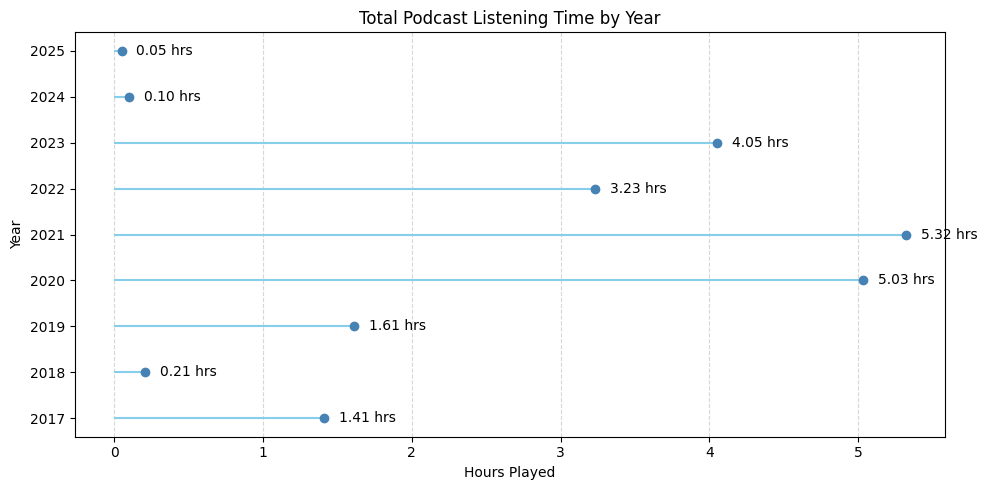

In [267]:
# Set up our dataframe. 
df = total_podcasts_per_year_df.groupby('stream_year')['total_hours_played'].sum().reset_index()

# Configure plot.
fig, ax = plt.subplots(figsize=(10, 5))

# Plot lines and dots.
ax.hlines(y=df['stream_year'], xmin=0, xmax=df['total_hours_played'], color='skyblue')
ax.plot(df['total_hours_played'], df['stream_year'], "o", color='steelblue')

# Add labels
ax.set_xlabel("Hours Played")
ax.set_ylabel("Year")
ax.set_title("Total Podcast Listening Time by Year")
ax.grid(axis='x', linestyle='--', alpha=0.5)

# Annotate the hours.
for i, (val, yr) in enumerate(zip(df['total_hours_played'], df['stream_year'])):
    ax.text(val + 0.1, yr, f"{val:.2f} hrs", va='center')

plt.tight_layout()
plt.show()


Over the entire span of listening history, we observe _less than a full day_ of podcast listening. I _really_ do not care for podcasts at all. The years of **2020** - **2021** may have been outliers due to the impending  World Cup of **2022**, but after **2024** any activity all but dissipates. This may render me a weak "lead" regarding any products or sponsors podcasters may promote. I may have an aversion to the human voice.

### Top Tracks For the Year

I admit being excited for this question, since it drills down into specific songs and artists. We deem "top tracks" those played the most frequently, regardless of their individual elapsed play time.

We start out with a test query to help formulate our strategy to glean the information we want. I want to identify "tracks" uniquely. I am not concerned if the same song title is shared among multiple albums. We will pick an artist I know of, but do not have on heavy rotation of [FKA Twigs](https://open.spotify.com/artist/6nB0iY1cjSY1KyhYyuIIKH?si=w4vL8rRZQHaNq1hE5CzY2A), as the total number of tracks should not be daunting.

In [122]:
fka_query = """
-- Test query for top tracks. 
SELECT COUNT(timestamp_column), artist_name, track_name, album_name, spotify_track_uri
FROM spotify_data
WHERE artist_name = 'FKA twigs'
AND ms_played > 5000
GROUP BY artist_name
    ,track_name
    ,album_name
    ,spotify_track_uri
"""

In [123]:
print(fetch_query_results(fka_query))

    count artist_name                            track_name  \
0       1   FKA twigs                                  Ache   
1       1   FKA twigs                            cellophane   
2       4   FKA twigs                            cellophane   
3       1   FKA twigs                        Don't Judge Me   
4       2   FKA twigs                               Eusexua   
5       5   FKA twigs                          holy terrain   
6       2   FKA twigs                          holy terrain   
7       1   FKA twigs                          holy terrain   
8       2   FKA twigs                         home with you   
9       3   FKA twigs  Measure of a Man (feat. Central Cee)   
10      2   FKA twigs                              Pendulum   
11      1   FKA twigs                      Perfect Stranger   
12      2   FKA twigs                               sad day   

                              album_name                     spotify_track_uri  
0                                   

An initial concern is that we have not encoded a method to uniquely identify "tracks." Thankfully there is a `spotify_track_uri` that does the job for us. From the above query, we can see that there may be tracks that are _effectively_ the same item, but have different albums and different `spotify_track_url` values.  

We observe multiple instances of the [holy terrain track](https://open.spotify.com/track/5ZmzzBiEAIVCkgsPyh80gt?si=64047a7432af4746), with this track present on `MAGDALENE` and several different `spotify_track_uri` entries. We will not count these as separate tracks, so we will use this query for an initial pass, then aggregate the play counts, removing album and `spotify_track_uri` in the final tally.

We create a test query with the same artist, but use a CTE then filter and aggregate to make the tracks "unique."

In [124]:
new_fka_query = """
WITH track_count_cte AS 
	(
		SELECT 
			COUNT(timestamp_column) AS track_count
			,artist_name
			,track_name
			,album_name
			,spotify_track_uri
			,DATE_PART('year', timestamp_column) AS stream_year
		FROM spotify_data
		WHERE 
			artist_name =  'FKA twigs'
			AND ms_played > 5000
		GROUP BY 
		artist_name
		,track_name
		,album_name
		,spotify_track_uri
		,stream_year
	)
SELECT 
	SUM(track_count) as times_played
	,artist_name
	,track_name
	,stream_year
FROM track_count_cte
GROUP BY 
	artist_name
	,track_name
	,stream_year
ORDER BY 
	times_played DESC
"""

In [125]:
print(fetch_query_results(new_fka_query))

    times_played artist_name                            track_name  \
0            5.0   FKA twigs                          holy terrain   
1            4.0   FKA twigs                            cellophane   
2            3.0   FKA twigs  Measure of a Man (feat. Central Cee)   
3            2.0   FKA twigs                               sad day   
4            2.0   FKA twigs                               Eusexua   
5            2.0   FKA twigs                          holy terrain   
6            2.0   FKA twigs                         home with you   
7            2.0   FKA twigs                              Pendulum   
8            1.0   FKA twigs                      Perfect Stranger   
9            1.0   FKA twigs                            cellophane   
10           1.0   FKA twigs                                  Ache   
11           1.0   FKA twigs                        Don't Judge Me   
12           1.0   FKA twigs                          holy terrain   

    stream_year  
0

This is more like it. To satisfy my curiosity about overall track plays across the entire listening history, we modify the query removing the `artist_name` filter to see what songs had the highest overall play count. We ignore the _time elapsed_ playing a track, as we are interested in frequency, and limit this to 10 results. 

In [126]:
query = """
-- Find the most played tracks across entire listening history
WITH track_count_cte AS 
	(
		SELECT 
			COUNT(timestamp_column) AS track_count
			,artist_name
			,track_name
			,album_name
			,spotify_track_uri
			,DATE_PART('year', timestamp_column) AS stream_year
		FROM spotify_data
		WHERE 
			ms_played > 5000
		GROUP BY 
		artist_name
		,track_name
		,album_name
		,spotify_track_uri
		,stream_year
	)
SELECT 
	SUM(track_count) as times_played
	,artist_name
	,track_name
	,stream_year
FROM track_count_cte
GROUP BY 
	artist_name
	,track_name
	,stream_year
ORDER BY 
	times_played DESC
LIMIT 
	10
"""

In [127]:
# Query DB for top 10 tracks played per year.
top_10_tracks_played_df = fetch_query_results(query)

# View top 10 tracks played.
top_10_tracks_played_df

,times_played,artist_name,track_name,stream_year
0,753.0,Chill Bees,Light Rain,2019
1,402.0,From Us,Smyrna,2022
2,198.0,18 Carat Affair,Rhythm Method,2024
3,183.0,Wp Sounds,Rain Sounds,2023
4,177.0,Beautiful Storms,Cartography Of Water,2021
5,171.0,jackLNDN,With You (Fluida Remix),2021
6,170.0,Vishal Casey,Appreciation,2021
7,169.0,Sohn Aelia,Uitblinken,2021
8,167.0,Adeline Verver,Turndown Service,2021
9,167.0,Prescient Liquids,Monrovia,2021


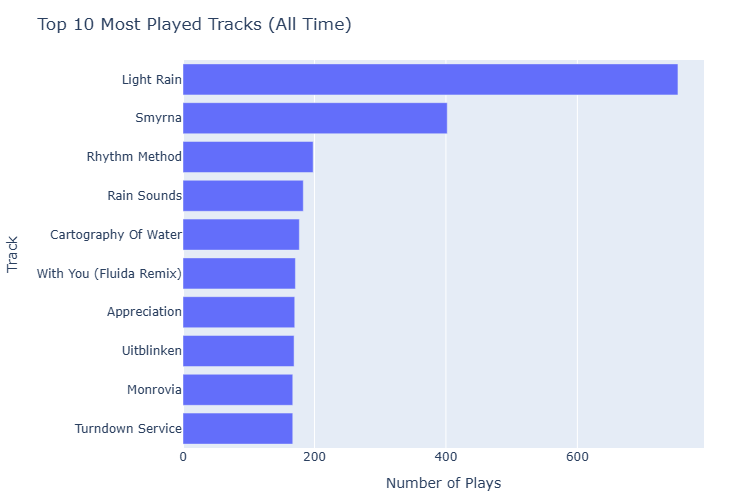

In [128]:
# Overall Top 10 tracks across entire listening history by play count
# Ensure dataframe contents descending order
top_10_tracks_played_df_sorted = (
    top_10_tracks_played_df
    .sort_values(by='times_played', ascending=False)
)

# Plot
fig = px.bar(
    top_10_tracks_played_df_sorted,
    x='times_played',
    y='track_name',
    orientation='h',
    title='Top 10 Most Played Tracks (All Time)',
    labels={
        'track_name': 'Track',
        'times_played': 'Number of Plays'
    },
    hover_data={
        'artist_name': True,
        'stream_year': True,
        'times_played': True,
        'track_name': False  # Already on y-axis
    },
    height=500
)

# Sort bars top to bottom
fig.update_layout(
    yaxis=dict(categoryorder='total ascending'),
    margin=dict(t=60, l=160, r=40, b=40)
)

fig.show()


To my surprise, I only recognize a single artist [jackLNDN](https://open.spotify.com/artist/6ZPZXXnq3PbxZSR9vu9fso?si=MBQvvuWaQsa5QrzMikQvIA) among the ten most-played tracks in my history. I recognize _absolutely none_ of the names, nor the artists listed. Another interesting pattern is that six out of the ten tracks all appear in the year **2021**. I have a suspicion that the proximity to the global pandemic coupled with some observations about my listening habits may underlie this data. We modify the query to include the track genres.

In [131]:
query = """
WITH track_count_cte AS 
	(
		SELECT 
			COUNT(timestamp_column) AS track_count
			,artist_name
			,track_name
			,album_name
			,spotify_track_uri
			,DATE_PART('year', timestamp_column) AS stream_year
		FROM spotify_data
		WHERE 
			ms_played > 5000
            AND artist_name IS NOT NULL
		GROUP BY 
		artist_name
		,track_name
		,album_name
		,spotify_track_uri
		,stream_year
	)
SELECT 
	SUM(tce.track_count) AS times_played
	,tce.artist_name
	,tce.track_name
	,tce.stream_year
	,a.genres AS genres
FROM 
	track_count_cte AS tce
LEFT JOIN 
	artists AS a 
ON 
	tce.artist_name = a.artist_name	
GROUP BY 
	tce.artist_name
	,tce.track_name
	,tce.stream_year
	,a.genres
ORDER BY 
	times_played DESC
LIMIT 
	10
"""

In [132]:
# Query DB for top 10 tracks played per year with genre metadata.
top_10_tracks_played_w_genres_df = fetch_query_results(query)

# Peruse top 10 tracks coupled with genre data.
top_10_tracks_played_w_genres_df

,times_played,artist_name,track_name,stream_year,genres
0,753.0,Chill Bees,Light Rain,2019,[]
1,402.0,From Us,Smyrna,2022,[]
2,198.0,18 Carat Affair,Rhythm Method,2024,"[vaporwave, chillwave, synthwave]"
3,183.0,Wp Sounds,Rain Sounds,2023,[]
4,177.0,Beautiful Storms,Cartography Of Water,2021,[]
5,171.0,jackLNDN,With You (Fluida Remix),2021,[]
6,170.0,Vishal Casey,Appreciation,2021,[]
7,169.0,Sohn Aelia,Uitblinken,2021,[]
8,167.0,Adeline Verver,Turndown Service,2021,[]
9,167.0,Prescient Liquids,Monrovia,2021,None


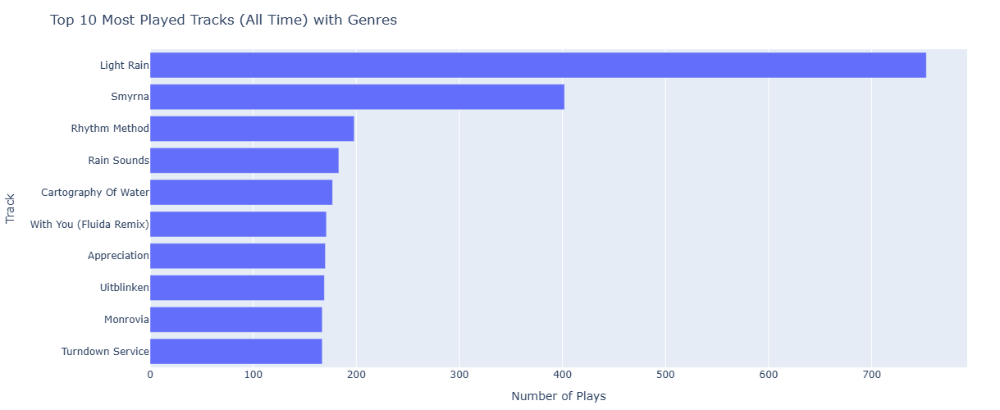

In [133]:
# Overall Top 10 tracks across entire listening history by play count, with genres included.
# Create dataframe sorted by times played
top_10_tracks_played_w_genres_df_sorted = (
    top_10_tracks_played_w_genres_df
    .sort_values(by='times_played', ascending=False)
)

# Plot the data
fig = px.bar(
    top_10_tracks_played_w_genres_df_sorted,
    x='times_played',
    y='track_name',
    orientation='h',
    title='Top 10 Most Played Tracks (All Time) with Genres',
    labels={
        'track_name': 'Track',
        'times_played': 'Number of Plays'
    },
    hover_data={
        'artist_name': True,
        'stream_year': True,
        'times_played': True,
        'genres': True, # Include genres in hover-over
        'track_name': False  # Already on y-axis
    },
    height=500
)

# Sort bars top to bottom
fig.update_layout(
    yaxis=dict(categoryorder='total ascending'),
    margin=dict(t=60, l=160, r=40, b=40)
)

fig.show()


The ambiguous nature of the songs becomes a bit apparent with genres included. While most lack any genre, the [18 Carat Affair](https://open.spotify.com/track/65aQpAGncm88mRukQhJkIG?si=370bae7be9274a2b) entry leads me to believe that these were `ambient` tracks played to help me sleep or unwind; tracks of this nature would not have any recognizable vocals or artists I would associate with offhand.  [Chill Bees](https://open.spotify.com/artist/317OsNvmAmolBVu7dLWhhD?si=i9xWwgNuRZWBpyu4vc-ZGw), with their [Light Rain](https://open.spotify.com/track/3BA4y1ENVDOeT7XP82sk09?si=ba1a93507d574640) entry was result of me wanting some natural sounds in the loud apartment complex I previously resided in. California does not have much interesting weather, so having a gentle sense of a softened world, with leaves and moisture, elicited by rain sounds makes sense. Since I would request my home automation to "play rain" or "play ocean waves," I never took account of what artists and tracks were used.

To find top tracks partitioned by year, we use our previous foundation, rank the tracks based on play count, partition by the year, then filter the records down to tracks with a `ranking` below **10**. We also will slightly modify the output table, since we want to quantify the play count, then shift into greater details about the track, such as artist, track name, and genres.

In [135]:
query = """
-- Find top tracks for entire history and include genres, rank by times played, then filter
-- results down to top 10 by ranking column.
WITH track_count_cte AS 
	(
		SELECT 
			COUNT(timestamp_column) AS track_count
			,artist_name
			,track_name
			,album_name
			,spotify_track_uri
			,DATE_PART('year', timestamp_column) AS stream_year
		FROM spotify_data
		WHERE 
			ms_played > 5000
		GROUP BY 
		artist_name
		,track_name
		,album_name
		,spotify_track_uri
		,stream_year
	),
tracks_and_genres AS
	(
		SELECT
			tce.stream_year
			,SUM(tce.track_count) AS times_played
			,RANK() OVER
			(
				PARTITION BY tce.stream_year
				ORDER BY SUM(tce.track_count) DESC
			) AS ranking
			,tce.artist_name
			,tce.track_name
			,a.genres AS genres

		FROM 
			track_count_cte AS tce
		LEFT JOIN 
			artists AS a 
		ON 
			tce.artist_name = a.artist_name
		GROUP BY 
			tce.artist_name
			,tce.track_name
			,tce.stream_year
			,a.genres
		ORDER BY 
			tce.stream_year
			,RANK() OVER
			(
				PARTITION BY tce.stream_year
				ORDER BY SUM(tce.track_count) DESC
			)
	)
SELECT 
	* 
FROM 
	tracks_and_genres
WHERE
	ranking <= 10
"""

In [136]:
# Query DB for top 10 tracks played by year.
top_10_tracks_played_by_year_df = fetch_query_results(query)

# View top 10 tracks 
top_10_tracks_played_by_year_df

,stream_year,times_played,ranking,artist_name,track_name,genres
0,2014,1.0,1,Ron Basejam,Get Closer,None
1,2015,3.0,1,Lars Behrenroth,Within Reason,[deep house]
2,2015,1.0,2,Tef Poe,F.a.M.E.,[]
3,2015,1.0,2,Scott Walker,Brando,None
4,2015,1.0,2,Pelican,The Creeper - Live,None
...,...,...,...,...,...,...
103,2025,6.0,5,H X 7,LATE NIGHT MISSIONS,"[drift phonk, phonk, memphis rap]"
104,2025,6.0,5,JASON RICH,Stickup,"[phonk, memphis rap, drift phonk]"
105,2025,6.0,5,Cassyb,Like One,"[drift phonk, rally house, phonk]"
106,2025,6.0,5,sword,Alien Squidfall,"[stoner rock, sludge metal, doom metal]"


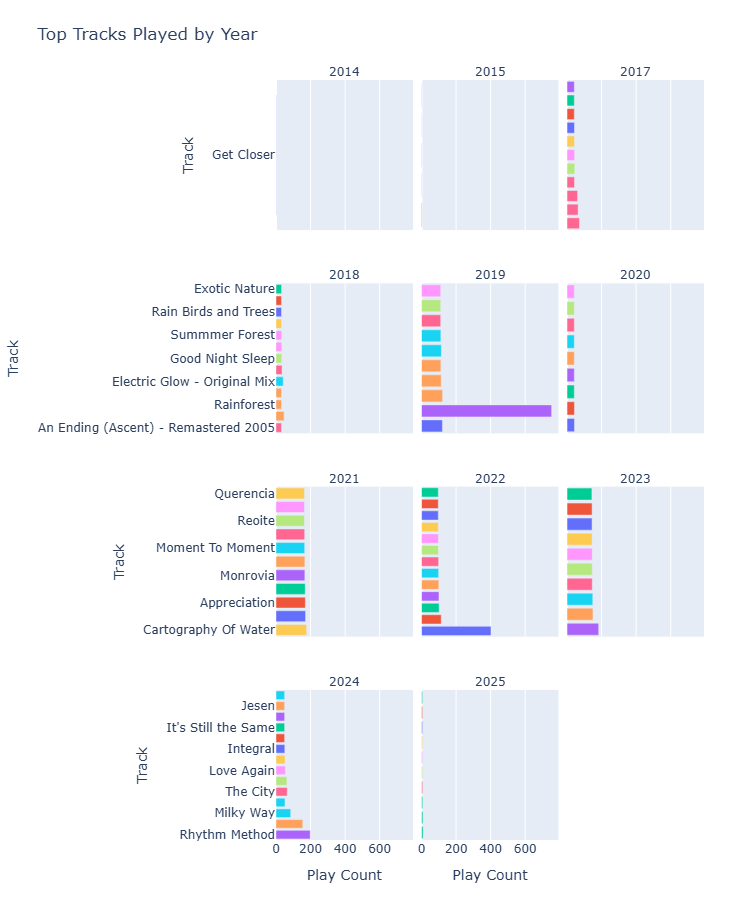

In [137]:
fig = px.bar(
    top_10_tracks_played_by_year_df,
    x='times_played',
    y='track_name',
    color='artist_name',
    facet_col='stream_year',
    facet_col_wrap=3,
    orientation='h',
    title='Top Tracks Played by Year',
    labels={
        'track_name': 'Track',
        'times_played': 'Play Count',
        'artist_name': 'Artist',
        'stream_year': 'Year'
    },
    hover_data={
        'artist_name': True,
        'times_played': True,
        'genres': True,
        'stream_year': False  # already in facet title
    },
    height=900
)

# Improve readability
fig.update_layout(
    margin=dict(t=80, l=120, r=40, b=60),
    showlegend=False
)

# Avoid automatic category linking.
fig.update_yaxes(matches=None, automargin=True)

# Clean up facet titles.
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))

fig.show()

Visually inspecting datadata, a familiar name in [Brian Eno](https://open.spotify.com/artist/7MSUfLeTdDEoZiJPDSBXgi?si=hpYRD84HSGO9De1pJWYgRA) tops the play count in **2017**, totaling **4** out of **11** of the most played tracks. I recognize no other artists in that year.

The years **2018** - **2023**, with the exceptions of Brian Eno and jackLNDN, I recognize absolutely _none_ of the artists, nor their tracks. Numerous tracks have absolutely no genres data present. Significant amounts of the tracks are dotted with terms indicating ambient nature sounds, such as "rain," "thunder," and "forest." This speaks to me barking out orders to my home automation to play natural sounds, to lull me into a pleasant slumber. I would never know, nor select any of the artists or tracks by any measure. I unintentionally and deliberately have been listening in ignorance.

**2024** is a more comforting and clear view, with my current set of preferred `phonk`, `lofi-*`, and `vaporware` genres. Among the top artists for **2024** I have name recognition of [Green Piccolo](https://open.spotify.com/artist/0Of8ndqAY23l2wV3sS6Zez?si=7GJLm-sTRber2niW9WzM1g), [Ryan Celsius Sounds](https://open.spotify.com/artist/2AtYJoC6VmUtkxonmVnbVR?si=Fj7AGZu-TMO9lnxeooHtBw), [Yvng Tavo](https://open.spotify.com/artist/0cNu3VVuE76EYfID6I9v1H?si=Sc90ywR-TD-NMvldKULElw), and [Baxdew](https://open.spotify.com/artist/2SQGn8IQmPyUTO6oJtejAl?si=DzPqhavGR_SDkvfBrPKNDg), with many of the songs I would play on continuous rotation, and consciously reference by name.  


### Amount of Plays for Top Tracks per Year

This data is implicit in the `top_10_tracks_played_by_year`, but we can get some general statistics from the `times_played` column.

In [138]:
top_10_tracks_played_by_year_df['times_played'].describe()

count    108.000000
mean      85.953704
std       90.396053
min        1.000000
25%       40.250000
50%       53.000000
75%      116.500000
max      753.000000
Name: times_played, dtype: float64

The average amount of plays for top played tracks is ~**85.95**. We can filter this dataframe and see if there are any recognizable artists amount tricks played greater than the average.

In [139]:
# We can reduce the working set to a smaller number of tracks to visualize.
top_tracks_per_year = (
    top_10_tracks_played_by_year_df
    .sort_values(['stream_year', 'times_played'], ascending=[True, False])
    .groupby('stream_year', group_keys=False)
    .head(5)
    .reset_index(drop=True)
)

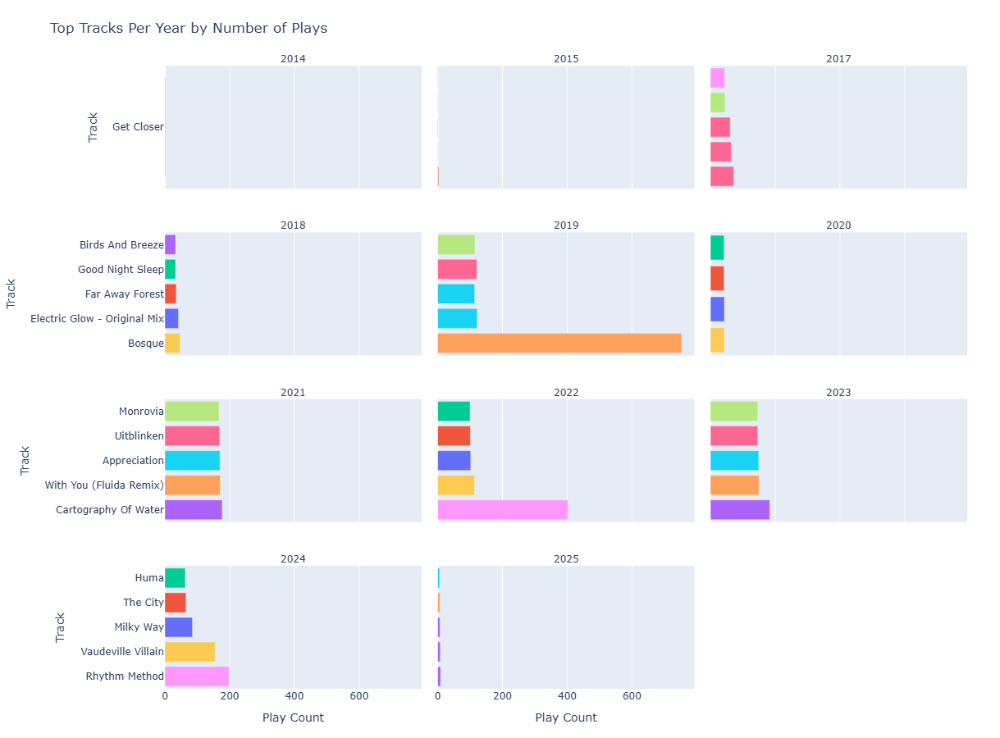

In [140]:
# Plot top_tracks_per_year in faceted fashion.

fig = px.bar(
    top_tracks_per_year,
    x='times_played',
    y='track_name',
    color='artist_name',
    facet_col='stream_year',
    facet_col_wrap=3,
    orientation='h',
    title='Top Tracks Per Year by Number of Plays',
    labels={
        'track_name': 'Track',
        'times_played': 'Play Count',
        'artist_name': 'Artist'
    },
    hover_data={
        'artist_name': True,
        'times_played': True,
        'genres': True
    },
    height=900
)

fig.update_layout(
    margin=dict(t=80, l=140, r=40, b=60),
    showlegend=False
)

fig.update_yaxes(matches=None, automargin=True)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))

fig.show()

Out of curiosity, I wanted to see if I recalled any artists wherein their times played exceeded the mean. 

In [189]:
# View tracks played equal to or more times than average.
top_10_tracks_played_by_year_df.query('times_played >= 85.95')

,stream_year,times_played,ranking,artist_name,track_name,genres
30,2019,753.0,1,Chill Bees,Light Rain,[]
31,2019,122.0,2,Thunderstorm Sound Bank,Monsun Thunderstorm,[]
32,2019,121.0,3,Mother Nature Sound FX,Florida Rain Storm,[]
33,2019,115.0,4,Weather Factory,Calm Rain & Thunder,[]
34,2019,114.0,5,Thunderstorm Sound Bank,Thunderstorm By The Waterfall,[]
35,2019,112.0,6,Thunderstorm Sound Bank,Rain & Thunder,[]
36,2019,112.0,6,Weather Factory,Forest Thunderstorm,[]
37,2019,111.0,8,Rain Sound Studio,Miami Rain,None
38,2019,111.0,8,The Sleep Helpers,Never Ending Rain,[]
39,2019,111.0,8,"Sounds Of Nature : Thunderstorm, Rain","Music For Sleep Thunderstorm, Rain",[]


Again, the only recognizable artist is jackLNDN. Every other entry in the tracks exceeding the average have no artists or tracks I have any familiarity with. 

What is bothering me is that I have no _emotional_ resonance with the data. It is just text and numbers, I have no recollection of what the tracks meant to me experientially. Knowing that many of the "top tracks" are unrecognizable means these were mostly listened to in a manner similar to elevator music. They have function and no form in my mind, lacking emotion, and sterile when I survey them. The recognizable nature of more recent tracks, I can reason about, in terms of how my tastes have solidified consciously and with intent. Basically, knowing the "top tracks" for the bulk of this data, does actually _tell_ me something interesting, outside of their alien nature.

### First Date Top Tracks Were Played in a Year

As mentioned before, "Top Tracks" will be defined as tracks having the highest ranking based on play count within each year. We have a query providing these top tracks, but we need to use a for-loop like structure to search the `spotify_data` table, find instances of the track, then find the track with the oldest date. We create a temp table by using the same basic query, wrapping it inside of a `CREATE TABLE AS(..)` statement and altering the ranking filter for values of `1`. (This query can also be found inside of the `sql/queries.sql` file.)

With the temp table `temp_most_played_tracks` created for our session, we can then use this to search the `spotify_data` table and extract the first date a track was played. We use `LATERAL` with `JOIN` for the for-loop invocation we desire. For each row generated by the query in front of the `LATERAL` join, a subquery or function after the `LATERAL` join will be evaluated once. 

For every entry in the temp table, we will execute the subquery, isolate the oldest record, then move on to the next entry.

In [141]:
query = """
-- Use the "for loop like" functionality of LATERAL with JOIN
SELECT 
	tmpt.artist_name
	,tmpt.track_name
	,tmpt.times_played
	,sd.timestamp_column
FROM
	temp_most_played_tracks AS tmpt
LEFT JOIN LATERAL (
	SELECT
		timestamp_column
		,DATE_PART('year', timestamp_column) AS sd_stream_year
	FROM
		spotify_data
	WHERE
		artist_name = tmpt.artist_name
		AND
		track_name = tmpt.track_name
		AND
		DATE_PART('year', timestamp_column) = tmpt.stream_year
	ORDER BY 
		timestamp_column ASC
	LIMIT 1
	) AS sd
ON TRUE
"""

In [142]:
# Query DB for when top 10 tracks were first played.
top_10_tracks_played_first_played = fetch_query_results(query)

# Peruse top 10 tracks and when they were played first.
top_10_tracks_played_first_played

,artist_name,track_name,times_played,timestamp_column
0,Ron Basejam,Get Closer,1.0,2014-02-08 00:19:05-08:00
1,Lars Behrenroth,Within Reason,3.0,2015-06-30 13:39:57-07:00
2,Brian Eno,Emerald and Stone,72.0,2017-03-31 07:11:46-07:00
3,Lluvia del Bosque,Bosque,47.0,2018-02-10 09:53:10-08:00
4,Chill Bees,Light Rain,753.0,2019-01-27 02:20:22-08:00
5,Tine Mydland,Et øyeblikk,43.0,2020-03-30 05:30:21-07:00
6,Najma Wallin,Med slutna ögon,43.0,2020-03-30 05:13:07-07:00
7,Beautiful Storms,Cartography Of Water,177.0,2021-03-23 00:00:27-07:00
8,From Us,Smyrna,402.0,2022-01-01 15:01:36-08:00
9,Wp Sounds,Rain Sounds,183.0,2023-09-27 03:48:28-07:00


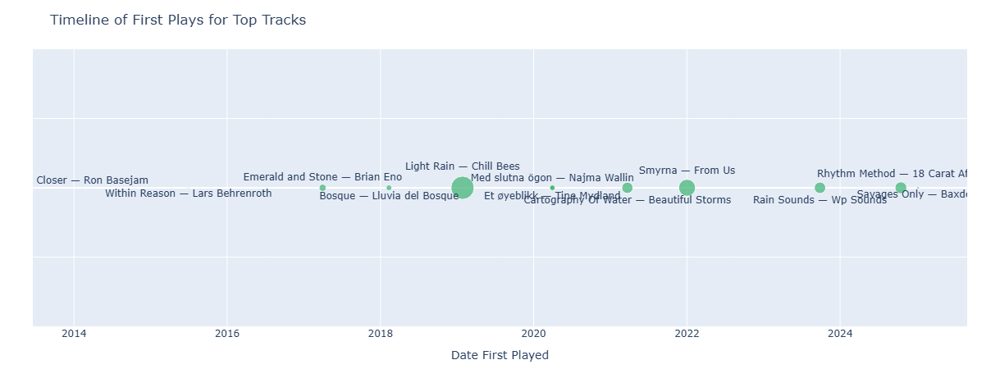

In [152]:
# Ensure the timestamp is parsed properly.
first_played_df = top_10_tracks_played_first_played.copy()

# Add a dummy Y axis just to anchor points to the horizontal baseline.
first_played_df['y'] = 0

# Optionally create a label column
first_played_df['label'] = first_played_df['track_name'] + " — " + first_played_df['artist_name']

# Alternate label positions: top for even rows, bottom for odd. Otherwise, the labels
# will run on to each other and be unreadable.
text_positions = ['top center' if i % 2 == 0 else 'bottom center' for i in range(len(first_played_df))]

fig = px.scatter(
    first_played_df,
    x='timestamp_column',
    y='y',
    size='times_played',
    text='label',
    hover_data={
        'timestamp_column': True,
        'track_name': True,
        'artist_name': True,
        'times_played': True,
        'y': False
    },
    title="Timeline of First Plays for Top Tracks",
    height=450
)

# Apply alternating text positions
fig.update_traces(
    marker=dict(color='mediumseagreen', opacity=0.7),
    textposition=text_positions
)

fig.update_layout(
    showlegend=False,
    yaxis=dict(showticklabels=False, title=None),
    xaxis_title='Date First Played',
    margin=dict(t=60, l=40, r=40, b=40)
)

fig.show()

**10** out of the **12** listening years, the tracks were listened to before the midpoint of that respective year. This may provide those tracks with a longer time period of opportunity to be played in that year.  Top tracks appearing closer to the end of a year, may indicate "binging" behavior, as there is literally less time to be played. 

Two tracks topped **2020** and happened to have the exact same play count are "[Med slutna ögon](https://open.spotify.com/track/6RuFOroO9VO0aMGEzirLHk?si=4199a10926b34cda)" and "[Et øyeblikk](https://open.spotify.com/track/4wwtlq6dqi0ztt989n4yiQ?si=b2939931d3c34a72)." The fact they have a proximate initial listening start date, have exactly the same amount of plays, would indicate a level of determinism. Using home-automation to trigger sleeping or nature sounds, the playlist appears to have deterministically played the _exact_ set of tracks, in the same sequence, over the same time period, such that these tracks ranked equally at the end of year.

To detect how much time elapsed between the time first played and end of the year, we create a function to read a timestamp and return this time delta. We can then apply this to our current dataframe, and do some interesting calculations.

In [196]:
from datetime import datetime, timezone

def last_day_of_year(timestamp):
    # Ensure timestamp is a proper datetime object
    ts = pd.to_datetime(timestamp)

    # Final second of the same year in UTC
    end_of_year = datetime(ts.year, 12, 31, 23, 59, 59, tzinfo=timezone.utc)
    
    # Convert both to UTC timestamps (in seconds since epoch)
    ts_utc = ts.tz_localize('UTC') if ts.tzinfo is None else ts.astimezone(timezone.utc)
    
    # Compute time delta in seconds
    delta_seconds = (end_of_year - ts_utc).total_seconds()
    
    # Return in days
    return delta_seconds / 86400


In [197]:
# Modify the dataframe to have a `time_delta` column,delta from the time of 
# timestamp and the final day of its respective year.
top_10_tracks_played_first_played['time_delta'] =\
    top_10_tracks_played_first_played['timestamp_column'].apply(last_day_of_year)

# Peruse the dataframe after changes.
top_10_tracks_played_first_played

,artist_name,track_name,times_played,timestamp_column,time_delta
0,Ron Basejam,Get Closer,1.0,2014-02-08 00:19:05-08:00,326.653403
1,Lars Behrenroth,Within Reason,3.0,2015-06-30 13:39:57-07:00,184.138912
2,Brian Eno,Emerald and Stone,72.0,2017-03-31 07:11:46-07:00,275.408484
3,Lluvia del Bosque,Bosque,47.0,2018-02-10 09:53:10-08:00,324.254734
4,Chill Bees,Light Rain,753.0,2019-01-27 02:20:22-08:00,338.569178
5,Tine Mydland,Et øyeblikk,43.0,2020-03-30 05:30:21-07:00,276.478912
6,Najma Wallin,Med slutna ögon,43.0,2020-03-30 05:13:07-07:00,276.490880
7,Beautiful Storms,Cartography Of Water,177.0,2021-03-23 00:00:27-07:00,283.708009
8,From Us,Smyrna,402.0,2022-01-01 15:01:36-08:00,364.040544
9,Wp Sounds,Rain Sounds,183.0,2023-09-27 03:48:28-07:00,95.549664


In [198]:
# Using the `time_delta` and `times_played, we can generate average amount of
# times per day a song was played.  
top_10_tracks_played_first_played['average_plays_per_day'] = \
    top_10_tracks_played_first_played['times_played'] / top_10_tracks_played_first_played['time_delta']

# Check our data.
top_10_tracks_played_first_played

,artist_name,track_name,times_played,timestamp_column,time_delta,average_plays_per_day
0,Ron Basejam,Get Closer,1.0,2014-02-08 00:19:05-08:00,326.653403,0.003061
1,Lars Behrenroth,Within Reason,3.0,2015-06-30 13:39:57-07:00,184.138912,0.016292
2,Brian Eno,Emerald and Stone,72.0,2017-03-31 07:11:46-07:00,275.408484,0.261430
3,Lluvia del Bosque,Bosque,47.0,2018-02-10 09:53:10-08:00,324.254734,0.144948
4,Chill Bees,Light Rain,753.0,2019-01-27 02:20:22-08:00,338.569178,2.224065
5,Tine Mydland,Et øyeblikk,43.0,2020-03-30 05:30:21-07:00,276.478912,0.155527
6,Najma Wallin,Med slutna ögon,43.0,2020-03-30 05:13:07-07:00,276.490880,0.155521
7,Beautiful Storms,Cartography Of Water,177.0,2021-03-23 00:00:27-07:00,283.708009,0.623881
8,From Us,Smyrna,402.0,2022-01-01 15:01:36-08:00,364.040544,1.104273
9,Wp Sounds,Rain Sounds,183.0,2023-09-27 03:48:28-07:00,95.549664,1.915234


The years of **2014** and **2015** lack enough data to merit deep consideration. **2017** and my Brian Eno phase seems interesting, with me listening to this track every ~**3.84** days. This feels like a weekend habit, especially given the **275** day spread. The peculiar nature of the `Chill Bees` track makes me wonder about the nature of the playist and its frequency. If played during sleeping hours, and more than twice a day on average, I suspect that I must have been using the _exact_ same home automation command to trigger the _exact_ same playlist. There also must be a directive to repeat the playlist, cycling through the same set of songs to enable this track to play multiple times in a single session. There may also be some peculiarity to the playlist composition. The track listing for the `Chill Bees` track may need to be short enough to enable the same songs to replay more than once in a session. Another possibility is that the track length may impact how quickly the songs are cycled. We could foresee a situation where there are minimal songs that play for longer periods before cycling back to the beginning, or a smaller number of tracks that have shorter play times to enable the full rotation of the entries. 

The nature/sleep sounds era from **2018** till **2023**, is a bit concerning. If these songs were the most played for that year, their initial play times could indicate aspects of my sleeping schedule. The fact that many of the tracks start some hours _after_ midnight, implies I am nocturnal. 

The [18 Carat Affair](https://open.spotify.com/track/65aQpAGncm88mRukQhJkIG?si=246e6af8823d48da) track seems like a conscious decision on my part, given the time of day initially seen, and the truncated time-span at the tail-end of **2024**. The phrasing that comes to mind is "earworm."

### Total Distinct Tracks Played per Year

This task is pretty straightforward to express in SQL and we can use multiple columns within a `DISTINCT` clause. Searching for "unique tracks," we interpret this as the artist + track name + album name, without further filtering. We want to avoid situations where a track name and artist combo may actually have multiple `spotify_track_url` values, but still be _effectively_ the same track. We also _do_ want to count when tracks have the same title, but reside on different albums; these may be live version studio versions, remixes, mashups, and so on. These tracks are "unique" in that regard, despite sharing other metadata.

In [73]:
query = """
SELECT 
	DATE_PART('year', timestamp_column)::INT AS year
	,COUNT(DISTINCT (track_name, artist_name, album_name)) AS distinct_song_count
FROM 
	spotify_data
GROUP BY 
	year
ORDER BY
	year;
"""

In [74]:
# Query DB for distinct tracks played per year.
distinct_tracks_played_per_year = fetch_query_results(query)

# View distinct tracks played per year
distinct_tracks_played_per_year

,year,distinct_song_count
0,2014,1
1,2015,24
2,2016,1
3,2017,5267
4,2018,6719
5,2019,5220
6,2020,5543
7,2021,7209
8,2022,8279
9,2023,11869


<Axes: xlabel='year'>

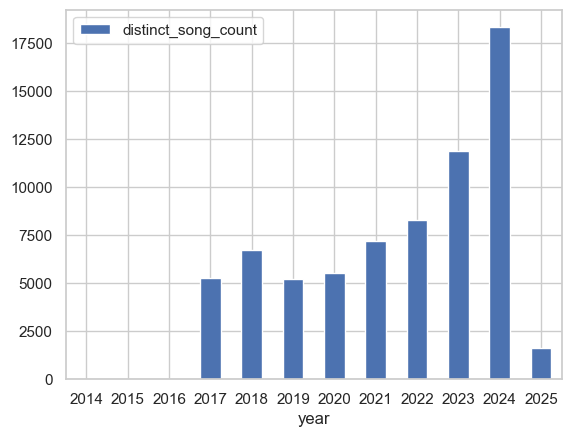

In [201]:
distinct_tracks_played_per_year.plot.bar(x='year', y='distinct_song_count', rot=0)

The distinct song count follows a steeper trajectory in unique tracks for every subsequent year. Compared to unique genres, the total amount of distinct tracks played, especially in **2024** is striking. The number of unique genres of artists I listen to has gradually increased, while the sheer amount of distinct tracks has risen at an extraordinary rate.  I am likely listening to more unique tracks within an only marginally increasing amount of genres. More unique tracks, implies more distinct artists. We can confirm that with a query to count the number of unique artists, not caring about any track info.

In [75]:
query = """
-- Find unique artists per year
SELECT 
	DATE_PART('year', timestamp_column) AS year,
	COUNT(DISTINCT (artist_name)) AS distinct_artist_count
FROM 
	spotify_data
GROUP BY 
	year
ORDER BY
	year;
"""

In [76]:
# Query DB for distinct artist count.
distinct_artists_by_year = fetch_query_results(query)

# View distinct artists by year.
distinct_artists_by_year

,year,distinct_artist_count
0,2014,1
1,2015,6
2,2016,0
3,2017,1726
4,2018,2157
5,2019,2276
6,2020,2621
7,2021,3164
8,2022,3754
9,2023,4955


<Axes: xlabel='year'>

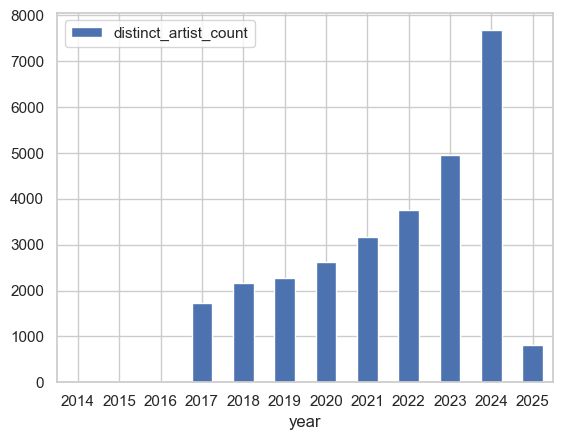

In [204]:
distinct_artists_by_year.plot.bar(x='year', y='distinct_artist_count', rot=0)

The distinct artist count similarly rises with every subsequent year as did the distinct song count. I am hearing an increasing amount of novel artists every successive year, while not necessarily increasing the total diversity of genres within my Spotify listening history. 

### Total Time Listened on Spotify per Year

Since milliseconds are not a useful measure, we will compute total listening time in hours. Again, we only are concerned with tracks with over **5** seconds of time elapsed, to avoid counting situations of mistakenly played tracks or tracks skipped over.

In [78]:
query = """
-- Total time in hours listened on Spotify by year.
SELECT 
	DATE_PART('year', timestamp_column) AS year
	,SUM(ms_played)/3600000 AS hours_played
FROM spotify_data
WHERE
	ms_played > 5000
GROUP BY year
ORDER BY year ASC
"""

In [79]:
# Query DB for distinct artist count.
total_listening_time_by_year = fetch_query_results(query)

# Show total listening time by year
total_listening_time_by_year

,year,hours_played
0,2014,0
1,2015,0
2,2017,1148
3,2018,1173
4,2019,1965
5,2020,1040
6,2021,2438
7,2022,2053
8,2023,2199
9,2024,2005


<Axes: xlabel='year'>

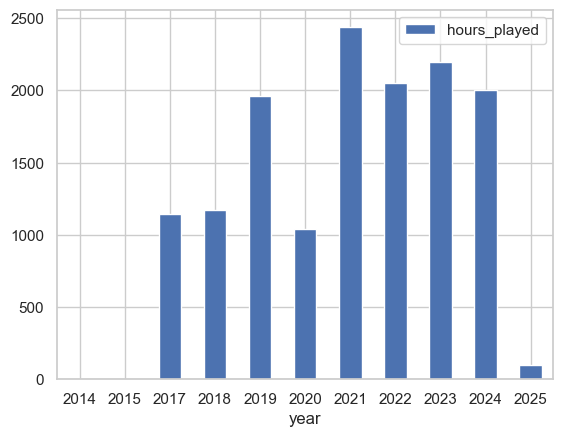

In [207]:
total_listening_time_by_year.plot.bar(x='year', y='hours_played', rot=0)

**2020** stands out due to the COVID-19 pandemic and subsequent work from home directives disrupting my Spotify listening habits. It seem peculiar that I have a stable amount of stable amount of listening time after **2021**, but ended up increasing the amount of unique artists and tracks I was exposed to. One possibility is that the average amount of time of individual tracks may have decreased as a result of listening to less nature/sleep sounds and consciously listening to genres that may have shorter playing times, like `phonk` and `lofi`.

In [80]:
query = """
-- Find the average track length in minutes
SELECT 
	DATE_PART('year', timestamp_column) AS year
	,ROUND((AVG(ms_played)/60000),2) AS avg_mins_played
FROM
	spotify_data
WHERE
	ms_played > 5000
GROUP BY
	year
ORDER BY
	year ASC
"""

In [81]:
# Query for average track elapsed time per year
avg_track_elapsed_time_by_year_df = fetch_query_results(query)

# Display average track elapsed time by year
avg_track_elapsed_time_by_year_df

,year,avg_mins_played
0,2014,5.76
1,2015,1.57
2,2017,3.49
3,2018,3.69
4,2019,3.99
5,2020,3.36
6,2021,3.06
7,2022,3.06
8,2023,3.08
9,2024,2.66


<Axes: xlabel='year'>

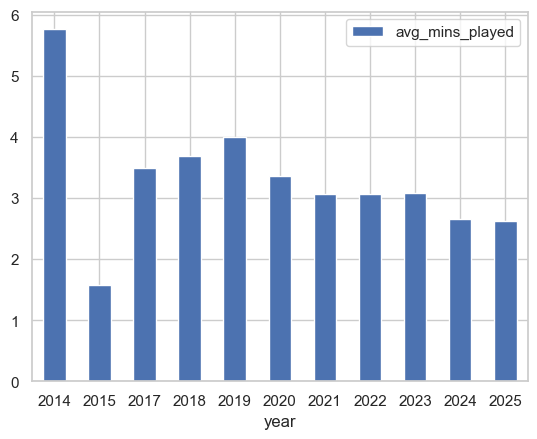

In [210]:
avg_track_elapsed_time_by_year_df.plot.bar(x='year', y='avg_mins_played', rot=0)

The first year of our listening history has only a few rows of data, so its high magnitude is an outlier. It appears that the overall average time per track has reduced since **2019**. The reduction in average time by **13.6%** in **2024** as compared to **2023** may indicate more intention with my listening habits; I may skip forward, stop, change tracks consciously, versus more passive nature/sleep sound oriented behavior. The genres I choose may simply have shorter general play times for their works. One challenge for this consideration is that the `ms_played` column communicates how much time the track was played; it may not be indicative of the actual song length, start to finish. This makes it challenging to state that particular genres may have shorter play times generally, since the elapsed time may relate to how I use Spotify to listen. 

Since we have dozens of genres, we create a temp table called `temp_genre_track_avg_playtime` in case we need to query for the average play time for songs in a respective genre, for a particular year. (This query can also be found inside of the `sql/queries.sql` file.)

The `temp_genre_track_avg_playtime` temp table has **3140** entries. Let's see what genres had the highest average minutes for **2020**.

In [82]:
query = """
--Sample data from temp table
SELECT 
	*
FROM  
	temp_genre_track_avg_playtime
WHERE
	avg_mins_played > 4
	AND stream_year = '2020'
ORDER BY
	stream_year
	,avg_mins_played DESC
LIMIT 10
"""

In [83]:
# Query DB for validating temp table.
temp_table_df = fetch_query_results(query)

# View contents of temp_table_df
temp_table_df

,stream_year,genre,avg_mins_played
0,2020,salsa,36.04
1,2020,cha cha cha,36.04
2,2020,avant-garde,22.23
3,2020,symphonic metal,10.13
4,2020,christian rock,10.13
5,2020,nz reggae,7.29
6,2020,sea shanties,6.97
7,2020,latin,6.94
8,2020,new age,6.54
9,2020,uk funky,6.30


While this output is simply representing the average times we associate with a genre, they seem absolutely out of left field. When have I _ever_ played a sea shanty? Why is a `cha cha cha` song even in my listening history? Why are `salsa` and `cha cha cha` genres averaging **36.04** minutes? We can glance at the `artists` table and see a bit more about this.

Only two artist results, one of them being [Joe Baker](https://open.spotify.com/album/26jfzSuXL8FWoTMpUyc8Od?si=jz4GEjctS0-6_sxxGNQqvg). I recognize Joe Baker, as this was the artist mentioned by my home automation software when I would request it to play "ocean waves" at night for natural sounds. We can survey how much time their associated tracks were played.  

In [85]:
query = """
-- Joe Baker, my "ocean waves" artist, classified as 'cha cha cha', focusing on 2020.
SELECT 
	artist_name
	,track_name
	,ms_played/6000 as min_played
FROM 
	spotify_data
WHERE 
	artist_name = 'Joe Baker'
	AND DATE_PART('year', timestamp_column) = 2020
"""

In [86]:
# Query DB for distinct artist count.
joe_baker_2020_df = fetch_query_results(query)

# View Joe Baker data.
joe_baker_2020_df

,artist_name,track_name,min_played
0,Joe Baker,Ocean Waves,735
1,Joe Baker,Thunderstorm by the Sea,734
2,Joe Baker,The Sound of Summer Rain,734
3,Joe Baker,Babbling Brook,214
4,Joe Baker,Babbling Brook,0
5,Joe Baker,Cha Cha Practice Music 105 Beats/min.,0
6,Joe Baker,Ocean Waves,0
7,Joe Baker,Tango No. 1 120 Bpm,0
8,Joe Baker,Wind and Rain,0
9,Joe Baker,Piano Waltz 90 Bpm,0


In [19]:
# Our manual calculations align with the SQL query data for ~ 35.7 min average playtime
joe_baker_2020_df['min_played'].describe()

count     17.000000
mean     359.941176
std      345.159288
min        0.000000
25%        0.000000
50%      290.000000
75%      734.000000
max      735.000000
Name: min_played, dtype: float64

It was _precisely_ this scenario I was afraid of related to the design decision to attach genres to artists instead of tracks/songs. I would initially think I may have had a one-off instance of playing a song in the genre on some mystical night in **2020**, only to find it conflicts with my lived experience of dozing off to `Joe Baker`. The ambiguity of associating genres with artists means we should compare findings in the data with our actual, lived, experience of Spotify listening.

### Day with the Most Time Spent Listening

This question of what day each year had the most listening time can be framed in two ways:
* The calendar day that had the most elapsed listening time initiated in that 24-hour period, out of all days in a calendar year.
* The specific weekday (Sunday through Saturday) when we listened to Spotify, compared to other weekdays.

#### Calendar Day

In [134]:
query = """
WITH daily_playtime AS (
  SELECT
    DATE_TRUNC('day', timestamp_column) AS calendar_day,
    DATE_PART('year', timestamp_column) AS year,
    SUM(ms_played) / 3600000.0 AS hours_played
  FROM spotify_data
  GROUP BY 
	  year
	  ,calendar_day
)
SELECT *
FROM (
  SELECT 
    *
    ,RANK() OVER (PARTITION BY year ORDER BY hours_played DESC) AS rank
  FROM daily_playtime
) ranked
WHERE rank = 1
ORDER BY year;
"""

In [135]:
# Query DB for days with highest listening.
days_of_highest_listening_df = fetch_query_results(query)

# View days of highest listening activity.
days_of_highest_listening_df

,calendar_day,year,hours_played,rank
0,2014-02-08 00:00:00-08:00,2014,0.096036,1
1,2015-06-30 00:00:00-07:00,2015,0.130866,1
2,2016-01-01 00:00:00-08:00,2016,0.000000,1
3,2017-10-28 00:00:00-07:00,2017,23.359132,1
4,2018-06-01 00:00:00-07:00,2018,24.009676,1
5,2019-06-30 00:00:00-07:00,2019,26.928960,1
6,2020-03-26 00:00:00-07:00,2020,24.001257,1
7,2021-08-24 00:00:00-07:00,2021,24.304734,1
8,2022-03-12 00:00:00-08:00,2022,22.741986,1
9,2023-12-19 00:00:00-08:00,2023,24.005644,1


In [182]:
query = """
WITH daily_playtime AS (
  SELECT
    DATE_TRUNC('day', timestamp_column) AS calendar_day
    ,DATE_PART('year', timestamp_column) AS year
    ,SUM(ms_played) / 3600000.0 AS hours_played
  FROM spotify_data
  GROUP BY 
    year
    ,calendar_day
),
ranked AS (
  SELECT 
    *
    ,RANK() OVER (PARTITION BY year ORDER BY hours_played DESC) AS rank
  FROM daily_playtime
)
SELECT *
FROM ranked
WHERE rank <= 5
ORDER BY 
    year
    ,rank;
"""

In [183]:
days_of_highest_listening_df = fetch_query_results(query)

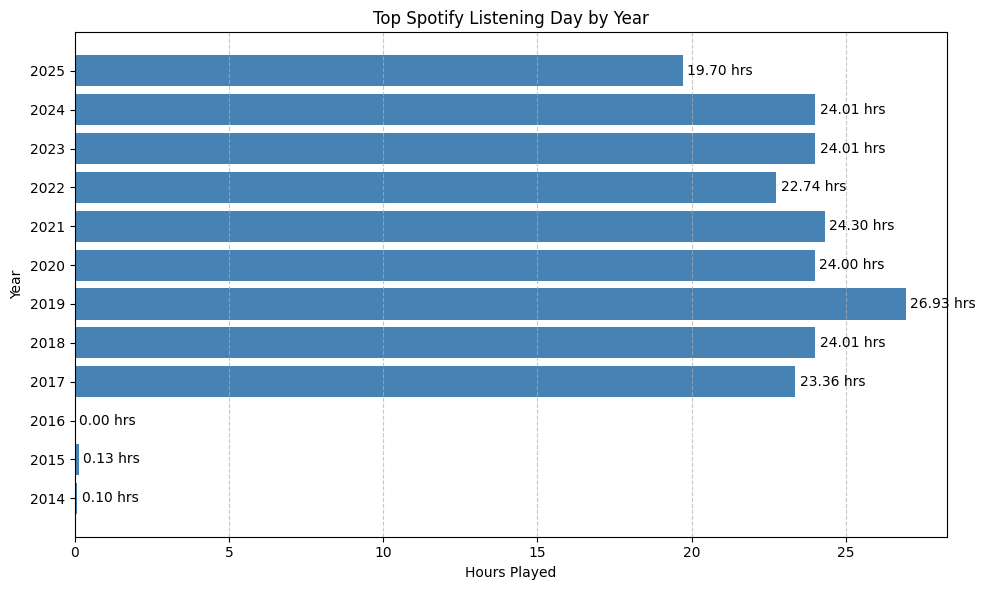

In [206]:
# Filter to only top (rank 1) day per year. Avoids duplicative labeling.
top_days_df = days_of_highest_listening_df[days_of_highest_listening_df['rank'] == 1].copy()

# Setup the figure and bars.
fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.barh(
    top_days_df['year'].astype(str), 
    top_days_df['hours_played'], 
    color='steelblue'
)

# Add one label per bar using bar_label.
ax.bar_label(bars, labels=[f'{v:.2f} hrs' for v in top_days_df['hours_played']], 
             label_type='edge', padding=3, fontsize=10, color='black')

# Add graph elements.
ax.set_xlabel('Hours Played')
ax.set_ylabel('Year')
ax.set_title('Top Spotify Listening Day by Year')
ax.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


Knowing the day with the maximum amount of playtime seems important, but needs to be seated in context. We now will plot a continuous-like line across all days of the listening history, to see how many hours were played daily across all of the days.

In [207]:
query = """
SELECT
    DATE_TRUNC('day', timestamp_column)::date AS calendar_day
    ,ROUND(SUM(ms_played) / 3600000.0, 2) AS hours_played
FROM spotify_data
--WHERE DATE_PART('year', timestamp_column) = 2021
GROUP BY calendar_day
ORDER BY calendar_day;
"""

In [208]:
hours_played_per_day_df = fetch_query_results(query)

In [228]:
# Ensure datetime and year
df = hours_played_per_day_df.copy()
df['calendar_day'] = pd.to_datetime(df['calendar_day'])
df['year'] = df['calendar_day'].dt.year
df['month'] = df['calendar_day'].dt.month

# Create a full date range from min to max
full_range = pd.date_range(start=df['calendar_day'].min(), end=df['calendar_day'].max())

# Reindex with full calendar and fill missing days with 0
df_full = df.set_index('calendar_day').reindex(full_range).rename_axis('calendar_day').reset_index()
df_full['hours_played'] = df_full['hours_played'].fillna(0)

# Recompute year column after reindexing
df_full['year'] = df_full['calendar_day'].dt.year


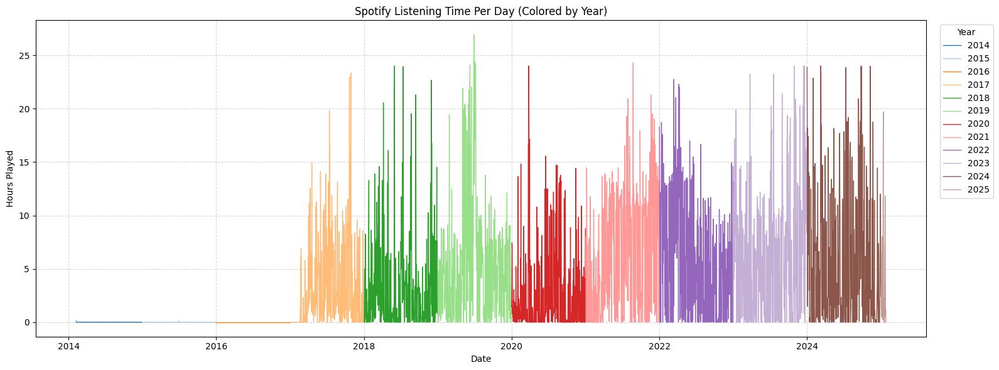

In [229]:
plt.figure(figsize=(16, 6))

# Create a color palette with unique colors per year
palette = sns.color_palette('tab20', n_colors=df_full['year'].nunique())

# Plot each year with a distinct color
for i, (year, group) in enumerate(df_full.groupby('year')):
    plt.plot(group['calendar_day'], group['hours_played'], label=str(year), color=palette[i], linewidth=1)

plt.title("Spotify Listening Time Per Day (Colored by Year)")
plt.xlabel("Date")
plt.ylabel("Hours Played")
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(title="Year", bbox_to_anchor=(1.01, 1), loc='upper left')
plt.tight_layout()
plt.show()


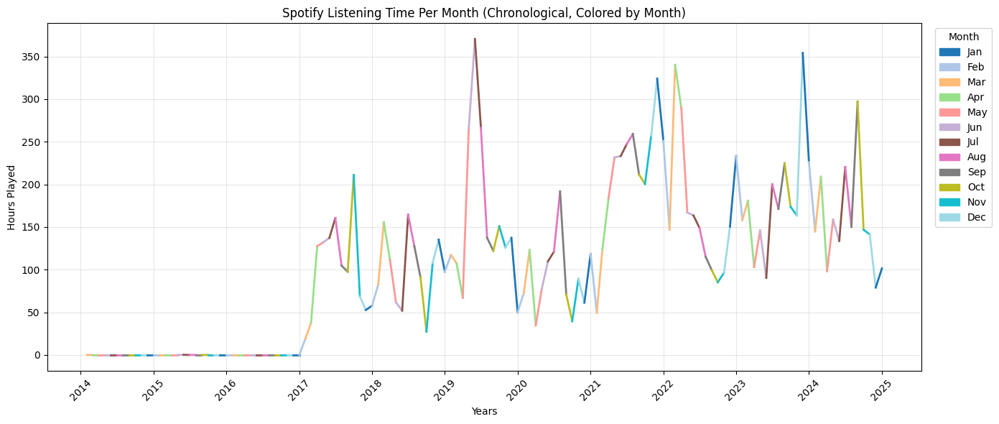

In [238]:
# base dataframe with 'calendar_day' and 'hours_played'
df = df_full.copy()
df['month'] = df['calendar_day'].dt.month
df['year_month'] = df['calendar_day'].dt.to_period('M').dt.to_timestamp()

# Aggregate by month.
monthly_df = df.groupby('year_month', as_index=False)['hours_played'].sum()
monthly_df['month'] = monthly_df['year_month'].dt.month  # for color

# Plot.
plt.figure(figsize=(14, 6))
norm = plt.Normalize(1, 12)
sm = plt.cm.ScalarMappable(cmap='tab20', norm=norm)

for i in range(1, len(monthly_df)):
    plt.plot(
        [monthly_df['year_month'][i-1], monthly_df['year_month'][i]],
        [monthly_df['hours_played'][i-1], monthly_df['hours_played'][i]],
        color=plt.cm.tab20(norm(monthly_df['month'][i])),
        linewidth=2
    )

plt.title('Spotify Listening Time Per Month (Chronological, Colored by Month)')
plt.ylabel('Hours Played')
plt.xlabel('Years')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)

# Set major ticks to every year
years = df_full['calendar_day'].dt.year.unique()
year_starts = pd.to_datetime([f"{y}-01-01" for y in years])

plt.xticks(
    ticks=year_starts,
    labels=[str(y) for y in years],
    rotation=45
)


# Legend
# Replace numeric month labels with 3-letter month abbreviations
month_labels = [calendar.month_abbr[i] for i in range(1, 13)]

legend_handles = [
    mpatches.Patch(color=plt.cm.tab20(norm(i)), label=month_labels[i-1])
    for i in range(1, 13)
]

plt.legend(
    handles=legend_handles,
    title='Month',
    bbox_to_anchor=(1.01, 1),
    loc='upper left'
)
plt.tight_layout()
plt.show()


The  `DATE_TRUNC` can be used to good effect to truncate the dates of each of the tracks in the `spotify_data` table. We include the year inside of the CTE as we need this in order to `PARTITION` the data later. 

Using a subquery, since we must first produce the rank. A window function such as `RANK` cannot filter the rows, but add information to the output, so we must filter outside of the subquery, only selecting those rows with the highest rank value.

**2019** looks extremely odd. Since the listening time runs three hours over 24, I suspect this must have been a long-running track that started before midnight and did not end until several hours afterward. A listening session that may have been initiated for sleep/nature sounds where I neglected to end my listening would align with this, in terms of running time as well as a track of sufficient individual length being able to run over. We can query for specific days and inspect what tracks were played on the day.

If we are interested in knowing what specific tracks were played on each of the days with the longest listening times for each year, we can create a temp table to capture that. (This query can also be found inside of the `sql/queries.sql` file.)

Armed with a temp table, we can suss out what genres composed each of the top listening days by genre count. Days where we see nature/sleep sounds, or other ambient genres, we can assume I started the genre via home automation and left it running for over a day. Days with more "danceable" or vocalized genres were instances where I actively chose the music. We will only filter to the top 10 genres ranked by count.

In [89]:
query = """
-- Generating genre counts for days with 
-- highest listening time.
WITH tracks_and_genres AS (
	SELECT 
		tlda.timestamp_column
		,UNNEST(a.genres) AS genre
	FROM 
		temp_longest_listening_days AS tlda
	LEFT JOIN artists AS a
		ON tlda.artist_name = a.artist_name
),
ranking_table AS (
	SELECT
		DATE_PART('year', timestamp_column) AS year
		,genre
		,COUNT(genre) AS genre_count
		,RANK() OVER (PARTITION BY DATE_PART('year', timestamp_column) ORDER BY COUNT(genre) DESC) AS ranking
	FROM 
		tracks_and_genres
	GROUP BY
		genre
		,year
	ORDER BY
		year ASC
		,ranking
		,genre_count DESC
)
SELECT *
FROM ranking_table
WHERE ranking <= 10;
"""

In [90]:
# Query DB for top 10 genres on days with highest listening.
top_10_genres_most_listened_days_df = fetch_query_results(query)

# View the top 10 genres on the most listened days.
top_10_genres_most_listened_days_df

,year,genre,genre_count,ranking
0,2015,deep house,38,1
1,2017,ambient,60,1
2,2017,space music,41,2
3,2017,drone,33,3
4,2017,neoclassical,14,4
...,...,...,...,...
94,2025,memphis rap,4,7
95,2025,classical,3,10
96,2025,classical piano,3,10
97,2025,shoegaze,3,10


**2019** is what I expected it to be, full of `ambient`, `drone` and `minimalism` tracks, which would match with my perception of this being a sleep session left to run.

In [37]:
# 2019 looks like a Brian Eno session that never ends.
top_10_genres_most_listened_days_df.query('year == 2019')

,year,genre,genre_count,ranking
22,2019,ambient,26,1
23,2019,drone,17,2
24,2019,minimalism,15,3
25,2019,art rock,10,4
26,2019,space music,10,4
27,2019,northern soul,8,6
28,2019,neoclassical,8,6
29,2019,glam rock,7,8
30,2019,krautrock,7,8
31,2019,motown,6,10


**2024** looks to be a binge session I had for French artist [Lala &ace](https://open.spotify.com/artist/1AKP8Tnz8KfOdRM4mqvNtF?si=hwb5ADPySGycq_F65Qrrtw), a purveyor of [cloud rap](https://en.wikipedia.org/wiki/Cloud_rap).

In [38]:
# 2024 looks like the Lala &ce binge-listening session.
top_10_genres_most_listened_days_df.query('year == 2024')

,year,genre,genre_count,ranking
74,2024,french rap,198,1
75,2024,french r&b,69,2
76,2024,new wave,51,3
77,2024,ambient,45,4
78,2024,melodic house,33,5
79,2024,melodic techno,33,5
80,2024,hyperpop,25,7
81,2024,french indie pop,25,7
82,2024,french house,15,9
83,2024,french pop,15,9


We have our answer for what days have the longest play time as well as how long each day ran in terms of hours. 

#### Day of the Week

Discovering what weekday had the most tracks played may be straightforward. We need only process the `timestamp_column`, extracting the weekday, and then group our results. We will find out which days have the most tracks played as well as what days had the longest cumulative amount of listening time.

In [91]:
query = """
-- Find the cumulative amount of track and hours played
-- segmented by weekday. 
SELECT
	TO_CHAR(timestamp_column, 'Day') as day_of_week
	,EXTRACT(DOW FROM timestamp_column) as numeric_day
	,ROUND((SUM(ms_played) / 3600000.0), 2) AS hours_played
	,COUNT(*) as track_count
FROM 
	spotify_data
GROUP BY
	day_of_week
	,numeric_day
ORDER BY
	numeric_day
	,hours_played DESC
"""

In [92]:
# Query DB to see listening activity broken down by weekday.
weekdays_of_listening_df = fetch_query_results(query)

# Peruse the days of highest listening.
weekdays_of_listening_df

,day_of_week,numeric_day,hours_played,track_count
0,Sunday,0.0,2122.16,41227
1,Monday,1.0,1991.10,38675
2,Tuesday,2.0,2103.53,39960
3,Wednesday,3.0,1930.12,37235
4,Thursday,4.0,2101.54,40585
5,Friday,5.0,1939.73,37573
6,Saturday,6.0,1941.27,36571


<Axes: xlabel='day_of_week'>

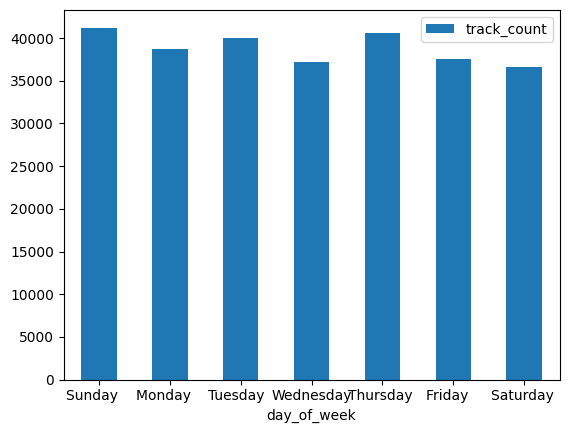

In [93]:
weekdays_of_listening_df.plot.bar(x='day_of_week', y='track_count', rot=0)

<Axes: xlabel='day_of_week'>

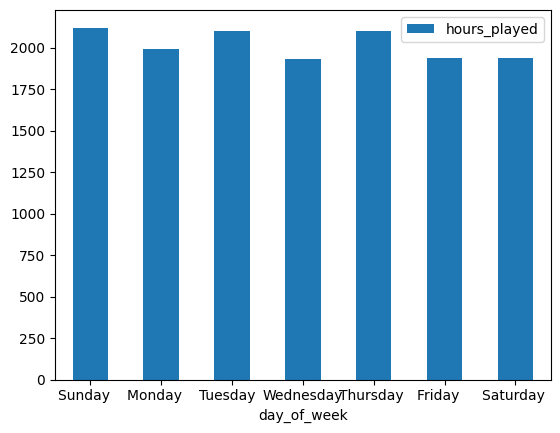

In [94]:
weekdays_of_listening_df.plot.bar(x='day_of_week', y='hours_played', rot=0)

* **Sunday** having the highest track count and hours played across our entire listening history makes sense. A day off, unencumbered by work responsibilities combined with my habit of weekly cleaning would enable more opportunity to listen to more tracks.
* **Monday** and **Wednesday** having lower amounts of hours played and track counts can be reasoned by those days usually being full of meetings, distractions, and work-related activities may permit less opportunity to play Spotify, at home or work. "Hump day" is real.
* **Thursday** having a higher number of tracks and playtime  is likely due to **Friday**. As in, no meetings, the periodic day off, and expectations to relax on the weekend.
* **Saturday** may have less tracks, due to weekend activities, being away from work and from home. 

## 🌞 Temporal Patterns

In this section, we will surface our listening history at varying levels of granularity. First, we start with plotting listening activity across every day of our listening history. Then, we aggregate monthly, to get a general sense how listening activity could fluctuate month-to-month. Then, we roll up to seasons and then drill downward to times of day.

### ⌛ Hours of Daily Listening 

Knowing the day with the maximum amount of playtime seems important, but needs to be seated in context. We now will plot a continuous-like line across all days of the listening history, to see how many hours were played daily across all of the days.

In [207]:
# Extract the number of hours played for *every* day. We can then aggregate by transforming
# the calendar_day value as needed.
query = """
SELECT
    DATE_TRUNC('day', timestamp_column)::date AS calendar_day
    ,ROUND(SUM(ms_played) / 3600000.0, 2) AS hours_played
FROM spotify_data
--WHERE DATE_PART('year', timestamp_column) = 2021
GROUP BY calendar_day
ORDER BY calendar_day;
"""

In [208]:
hours_played_per_day_df = fetch_query_results(query)

In [228]:
# Ensure datetime and year
df = hours_played_per_day_df.copy()
df['calendar_day'] = pd.to_datetime(df['calendar_day'])
df['year'] = df['calendar_day'].dt.year
df['month'] = df['calendar_day'].dt.month

# Create a full date range from min to max
full_range = pd.date_range(start=df['calendar_day'].min(), end=df['calendar_day'].max())

# Reindex with full calendar and fill missing days with 0
df_full = df.set_index('calendar_day').reindex(full_range).rename_axis('calendar_day').reset_index()
df_full['hours_played'] = df_full['hours_played'].fillna(0)

# Recompute year column after reindexing
df_full['year'] = df_full['calendar_day'].dt.year


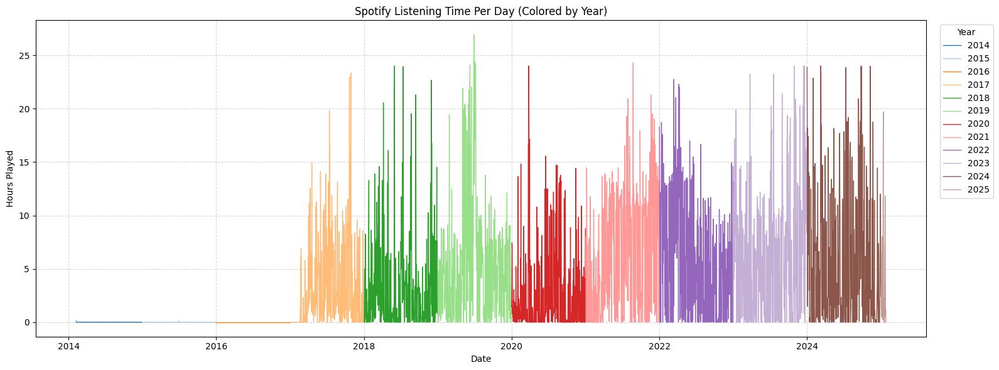

In [229]:
plt.figure(figsize=(16, 6))

# Create a color palette with unique colors per year
palette = sns.color_palette('tab20', n_colors=df_full['year'].nunique())

# Plot each year with a distinct color
for i, (year, group) in enumerate(df_full.groupby('year')):
    plt.plot(group['calendar_day'], group['hours_played'], label=str(year), color=palette[i], linewidth=1)

plt.title("Spotify Listening Time Per Day (Colored by Year)")
plt.xlabel("Date")
plt.ylabel("Hours Played")
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(title="Year", bbox_to_anchor=(1.01, 1), loc='upper left')
plt.tight_layout()
plt.show()


It is interesting to see the day by day fluctuations of listening activity. The lack of any involvement in Spotify is stark from 2014 until 2017. Afterwards, it appears to be a consistent portion of my daily lifestyle. Since this is a line plot, and not a bar, seeing "air" beneath the lines would indicate heightened listening activity, consistently, over a period of days. It is difficult to discern how this listening activity stacks up between days, but the "peaks" are noticeable.

We now will aggregate the amount of hours played on a monthly level, and plot this similarly to daily data. The monthly aggregation might reveal easier-to-discern patterns, should any exist. 

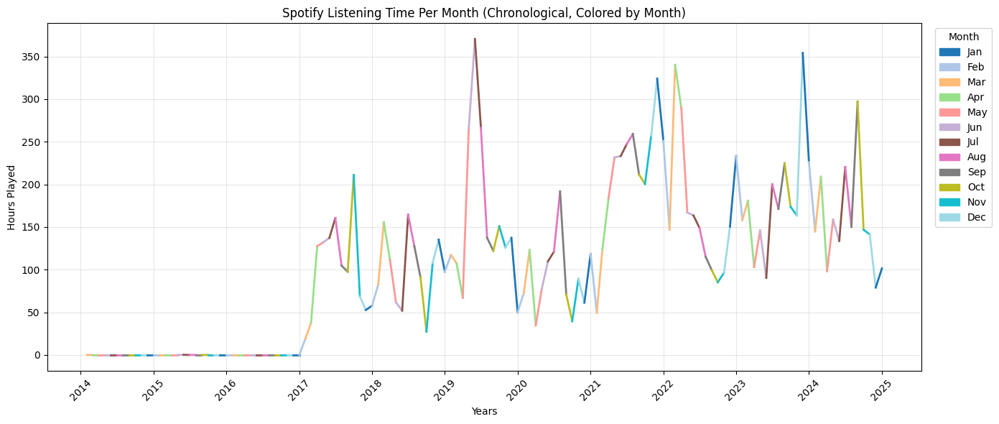

In [238]:
# base dataframe with 'calendar_day' and 'hours_played'
df = df_full.copy()
df['month'] = df['calendar_day'].dt.month
df['year_month'] = df['calendar_day'].dt.to_period('M').dt.to_timestamp()

# Aggregate by month.
monthly_df = df.groupby('year_month', as_index=False)['hours_played'].sum()
monthly_df['month'] = monthly_df['year_month'].dt.month  # for color

# Plot.
plt.figure(figsize=(14, 6))
norm = plt.Normalize(1, 12)
sm = plt.cm.ScalarMappable(cmap='tab20', norm=norm)

for i in range(1, len(monthly_df)):
    plt.plot(
        [monthly_df['year_month'][i-1], monthly_df['year_month'][i]],
        [monthly_df['hours_played'][i-1], monthly_df['hours_played'][i]],
        color=plt.cm.tab20(norm(monthly_df['month'][i])),
        linewidth=2
    )

plt.title('Spotify Listening Time Per Month (Chronological, Colored by Month)')
plt.ylabel('Hours Played')
plt.xlabel('Years')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)

# Set major ticks to every year
years = df_full['calendar_day'].dt.year.unique()
year_starts = pd.to_datetime([f"{y}-01-01" for y in years])

plt.xticks(
    ticks=year_starts,
    labels=[str(y) for y in years],
    rotation=45
)


# Legend
# Replace numeric month labels with 3-letter month abbreviations
month_labels = [calendar.month_abbr[i] for i in range(1, 13)]

legend_handles = [
    mpatches.Patch(color=plt.cm.tab20(norm(i)), label=month_labels[i-1])
    for i in range(1, 13)
]

plt.legend(
    handles=legend_handles,
    title='Month',
    bbox_to_anchor=(1.01, 1),
    loc='upper left'
)
plt.tight_layout()
plt.show()


In [252]:
query = """
-- Generate Top Genres for 2020
WITH artist_playtime AS (
	SELECT 
		timestamp_column::date AS cal_day
		,a.genres
		,sd.ms_played
	FROM artists AS a
	JOIN sd_artists_join AS sdj 
		ON a.id = sdj.artist_id
	JOIN spotify_data AS sd 
		ON sdj.sd_id = sd.id
	AND year_played = 2020
	GROUP BY 
		cal_day
		,a.genres
		,sd.ms_played
	ORDER BY
		timestamp_column::date ASC
),
genre_ranks AS (
	SELECT
		UNNEST(genres) AS genre,
		ROUND((CAST(SUM(ms_played) AS numeric)  / 3600000) , 2) AS hours_played,
		RANK() OVER (
			PARTITION BY cal_day
			ORDER BY SUM(ms_played) DESC
		) AS genre_rank,
		cal_day
	FROM artist_playtime
	GROUP BY cal_day, genre
)
SELECT *
FROM genre_ranks
WHERE genre_rank <= 10
ORDER BY cal_day, genre_rank;
"""

In [254]:
# Obtain the top 5 genres in 2020, partitioned on a daily level
top_10_genres_2020_df = fetch_query_results(query)
top_10_genres_2020_df.head(5)

,genre,hours_played,genre_rank,cal_day
0,lo-fi beats,0.25,1,2020-01-01
1,lo-fi,0.21,2,2020-01-01
2,indie jazz,0.18,3,2020-01-01
3,lo-fi hip hop,0.11,4,2020-01-01
4,nu disco,0.08,5,2020-01-01


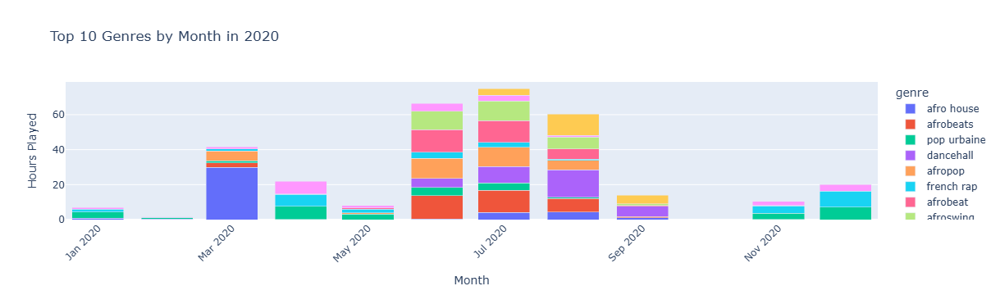

In [262]:
#Convert date
top_10_genres_2020_df['cal_day'] = pd.to_datetime(top_10_genres_2020_df['cal_day'])

# Create 'month' column  with `YYYY-MM`format
top_10_genres_2020_df['month'] = top_10_genres_2020_df['cal_day'].dt.to_period('M').astype(str)

# Parameterize the number of genres displayed. 5 through 10 should be sufficient.
num_genres = 10

# Aggregate by month + genre
monthly = top_10_genres_2020_df.groupby(['month', 'genre'], as_index=False)['hours_played'].sum()

# Sort genres by total hours played (descending), to control stacking order
genre_order = (
    monthly.groupby('genre')['hours_played']
    .sum()
    .sort_values(ascending=False)
    .index.tolist()
)

# Step 4: Keep only top 10 genres overall (or top N)
top_genres = (
    monthly_genre.groupby('genre')['hours_played']
    .sum()
    .nlargest(num_genres)
    .index
)

monthly_top = monthly_genre[monthly_genre['genre'].isin(top_genres)]


# Plot
fig = px.bar(
    monthly_top,
    x='month',
    y='hours_played',
    color='genre',
    title=f'Top {num_genres} Genres by Month in 2020',
    labels={'hours_played': 'Hours Played', 'month': 'Month'},
    category_orders={'genre': genre_order}
)

fig.update_layout(
    barmode='stack',
    xaxis_tickangle=-45
)
fig.show()


* The `afro house` genre had a significant share of hours played in March. Afterwards, this genre does not have a prominent share in any subsequent month.
* With COVID-19 emergency lockdown and workplace restrictions taking place towards the end of march, the dropoff in hours played in April and May coincide. This is counterintuitive, since one would expert that more time at home, away from the office would mean more listening time. In this case, the disruption of routine explains the plummet in listening time. As detailed in the "Time of Day" section, we see a notable drop in morning time listening behavior as well as less listening volume on a yearly scale.
* June, July, and August aligned with my personal preconception of Summer months being more "free," lending themselves to higher listening volume.
* The "Francophone" nature of my listening habits seems to fluctuate. `Pop urbaine`, `french rap`, `french r&b` in Winter months mostly, beginning and end, and in the months immediately after lockdown, before Summer listening explosion. While these genres are still present in summer, their contribution to listening time is overwhelmed by other genres. 
* The Summer genres are very danceable: `afrobeats`, `afropop`, `dancehall`, `afroswing`. I suspect I needed uplifting music to counter the stresses of that year.
* Qualitatively, "feel" of the genres seems to match the season.`Afropop`, `afrobeats` being a light, summer sound, while the "Francophone" sounds dominate the winter months, more bleak, and sinister.

### ❄️ Seasons

Another method of viewing our listening activity would be partitioning the data by seasons. I held a preconception that my Spotify listening activity would increase in  inclement months, with inhospitable weather. Given that I use the service when I am at home, being at home for longer periods _should_ lend credence to there being more listening activity when the weather prevents me from venturing outside more frequently.

Winter is an interesting season to categorize, since it resides at the cusp of year's end and year's start. We added separate categorizations of this season to clearly differentiate when a track was played.

In [97]:
query = """
-- Query to find track counts during different seasons.
WITH with_seasons AS (
	SELECT 
		timestamp_column,
		DATE_PART('year', timestamp_column) AS year,
		CASE
			WHEN (EXTRACT(MONTH FROM timestamp_column) = 12 AND EXTRACT(DAY FROM timestamp_column) >= 21) THEN 'Winter End'
			WHEN (EXTRACT(MONTH FROM timestamp_column) IN (1, 2)) THEN 'Winter Start'
			WHEN (EXTRACT(MONTH FROM timestamp_column) = 3 AND EXTRACT(DAY FROM timestamp_column) <= 19) THEN 'Winter Start'
			WHEN (EXTRACT(MONTH FROM timestamp_column) = 3 AND EXTRACT(DAY FROM timestamp_column) >= 20) THEN 'Spring'
			WHEN (EXTRACT(MONTH FROM timestamp_column) IN (4, 5)) THEN 'Spring'
			WHEN (EXTRACT(MONTH FROM timestamp_column) = 6 AND EXTRACT(DAY FROM timestamp_column) <= 20) THEN 'Spring'
			WHEN (EXTRACT(MONTH FROM timestamp_column) = 6 AND EXTRACT(DAY FROM timestamp_column) >= 21) THEN 'Summer'
			WHEN (EXTRACT(MONTH FROM timestamp_column) IN (7, 8)) THEN 'Summer'
			WHEN (EXTRACT(MONTH FROM timestamp_column) = 9 AND EXTRACT(DAY FROM timestamp_column) <= 22) THEN 'Summer'
			WHEN (EXTRACT(MONTH FROM timestamp_column) = 9 AND EXTRACT(DAY FROM timestamp_column) >= 23) THEN 'Fall'
			WHEN (EXTRACT(MONTH FROM timestamp_column) IN (10, 11)) THEN 'Fall'
			WHEN (EXTRACT(MONTH FROM timestamp_column) = 12 AND EXTRACT(DAY FROM timestamp_column) <= 20) THEN 'Fall'
			ELSE 'Unknown'
		END AS season,
		CASE
			WHEN (EXTRACT(MONTH FROM timestamp_column) = 12 AND EXTRACT(DAY FROM timestamp_column) >= 21) THEN 4
			WHEN (EXTRACT(MONTH FROM timestamp_column) IN (1, 2)) THEN 0
			WHEN (EXTRACT(MONTH FROM timestamp_column) = 3 AND EXTRACT(DAY FROM timestamp_column) <= 19) THEN 0
			WHEN (EXTRACT(MONTH FROM timestamp_column) = 3 AND EXTRACT(DAY FROM timestamp_column) >= 20) THEN 1
			WHEN (EXTRACT(MONTH FROM timestamp_column) IN (4, 5)) THEN 1
			WHEN (EXTRACT(MONTH FROM timestamp_column) = 6 AND EXTRACT(DAY FROM timestamp_column) <= 20) THEN 1
			WHEN (EXTRACT(MONTH FROM timestamp_column) = 6 AND EXTRACT(DAY FROM timestamp_column) >= 21) THEN 2
			WHEN (EXTRACT(MONTH FROM timestamp_column) IN (7, 8)) THEN 2
			WHEN (EXTRACT(MONTH FROM timestamp_column) = 9 AND EXTRACT(DAY FROM timestamp_column) <= 22) THEN 2
			WHEN (EXTRACT(MONTH FROM timestamp_column) = 9 AND EXTRACT(DAY FROM timestamp_column) >= 23) THEN 3
			WHEN (EXTRACT(MONTH FROM timestamp_column) IN (10, 11)) THEN 3
			WHEN (EXTRACT(MONTH FROM timestamp_column) = 12 AND EXTRACT(DAY FROM timestamp_column) <= 20) THEN 3
			ELSE 99
		END AS season_order
	FROM spotify_data
)
SELECT 
	year,
	season,
	season_order,
	COUNT(*) AS track_count
FROM with_seasons
GROUP BY year, season, season_order
ORDER BY year, season_order;
"""

In [98]:
# Query the DB for tracks and the season they occupy.
seasonal_track_count_df = fetch_query_results(query)

seasonal_track_count_df

,year,season,season_order,track_count
0,2014,Winter Start,0,1
1,2015,Summer,2,54
2,2016,Winter Start,0,1
3,2017,Winter Start,0,753
4,2017,Spring,1,6994
5,2017,Summer,2,6724
6,2017,Fall,3,6007
7,2017,Winter End,4,337
8,2018,Winter Start,0,4282
9,2018,Spring,1,4263


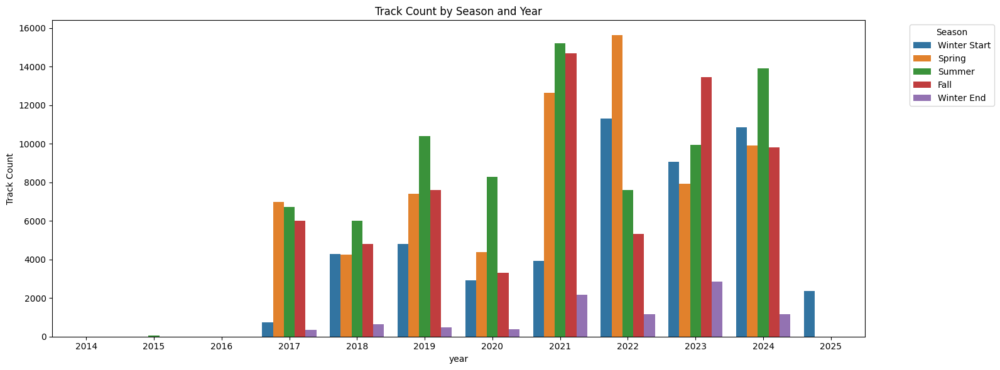

In [99]:
# Step 1: Define the correct season order
season_order = [
    'Winter Start', 'Spring', 'Summer', 'Fall', 'Winter End'
]

# Step 2: Set the 'season' column as a categorical for sorting in the plot
seasonal_track_count_df['season'] = pd.Categorical(
    seasonal_track_count_df['season'],
    categories=season_order,
    ordered=True
)

# Step 3: Sort the DataFrame so plotting is predictable
seasonal_track_count_df = seasonal_track_count_df.sort_values(['year', 'season'])

# Step 4: Plot using Seaborn
plt.figure(figsize=(16, 6))
sns.barplot(
    data=seasonal_track_count_df,
    x='year',
    y='track_count',
    hue='season',
    hue_order=season_order
)
plt.title("Track Count by Season and Year")
plt.ylabel("Track Count")
plt.xticks(rotation=0)
plt.legend(title="Season", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


Surprisingly, summer appears to be the season I listen to with the highest track count in five years out of the ten full listening years in our history. Spring clocks in with the highest amount within two of the years, and Fall only has only a single year with the maximum track count. Our splitting of winter into "start" and "end" segments, even combined, never rises to a level where this becomes the season with the highest play count. This is a bit surprising, since Winter may afford more time indoors and less opportunity to leave the house for other activities outside of music listening. Another approach is that summer months may permit more vacation time, and the listening activity observed during these periods reflect this. 

### ⏱️ Time of Day

To refresh our memories we define the times of day as follows:
* **Morning**: 5:00 AM to Noon (7 hours)
* **Afternoon**: Noon to 6:00 PM (6 hours)
* **Evening**: 6:00 PM to 11:00 PM (5 hours)
* **Night**: 11:00PM to 5:00 AM (6 hours)

In [154]:
query = """
	SELECT 
		year_played
        ,time_of_day
        ,COUNT(*) as track_count
        ,ROUND((SUM(ms_played) / 3600000.0), 2) AS hours_played
        ,CASE
			WHEN time_of_day = 'morning' THEN 0
			WHEN time_of_day = 'afternoon' THEN 1
			WHEN time_of_day = 'evening' THEN 2
			WHEN time_of_day = 'night' THEN 3
            ELSE 4
        END AS tod_order
    FROM spotify_data
    WHERE
        ms_played > 5000
    GROUP BY
        year_played
        ,time_of_day
    ORDER BY
        year_played ASC
        ,tod_order ASC
        ,track_count
    """

In [155]:
time_of_day_df = fetch_query_results(query)
time_of_day_df.head()

,year_played,time_of_day,track_count,hours_played,tod_order
0,2014,night,1,0.10,3
1,2015,afternoon,6,0.16,1
2,2015,night,1,0.03,3
3,2017,morning,6816,426.80,0
4,2017,afternoon,4151,234.21,1


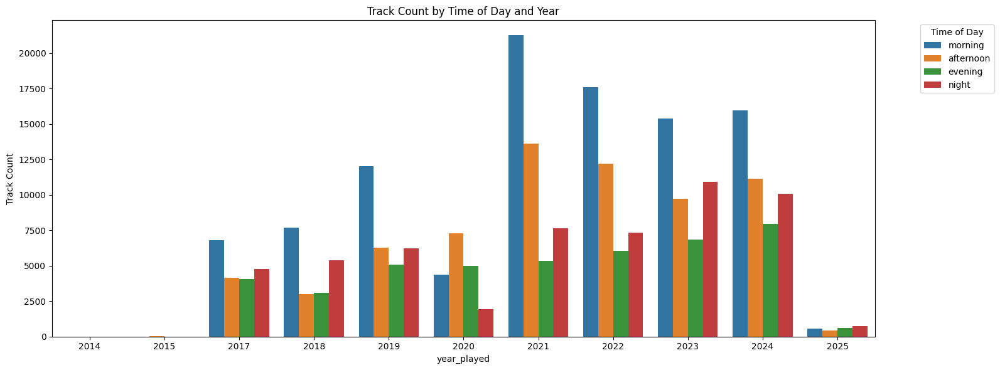

In [152]:
# Define the correct time of day order
tod_order = [
    'morning', 'afternoon', 'evening', 'night'
]

# Set the 'time_of_day' column as a categorical for sorting in the plot
time_of_day_df['time_of_day'] = pd.Categorical(
    time_of_day_df['time_of_day'],
    categories=tod_order,
    ordered=True
)

# Sort the dataFrame 
time_of_day_df = time_of_day_df.sort_values(['year_played', 'time_of_day'])

# Plot the data
plt.figure(figsize=(16, 6))
sns.barplot(
    data=time_of_day_df,
    x='year_played',
    y='track_count',
    hue='time_of_day',
    hue_order=tod_order
)
plt.title("Track Count by Time of Day and Year")
plt.ylabel("Track Count")
plt.xticks(rotation=0)
plt.legend(title="Time of Day", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


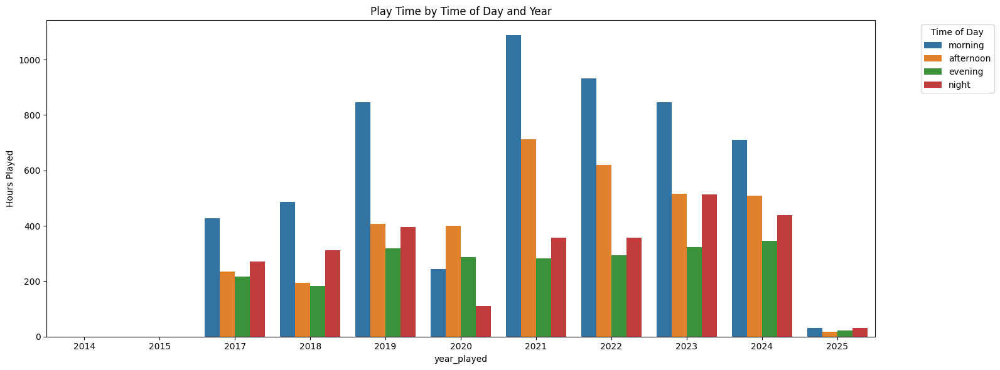

In [157]:
# Define the correct time of day order
tod_order = [
    'morning', 'afternoon', 'evening', 'night'
]

# Set the 'time_of_day' column as a categorical for sorting in the plot
time_of_day_df['time_of_day'] = pd.Categorical(
    time_of_day_df['time_of_day'],
    categories=tod_order,
    ordered=True
)

# Sort the dataFrame 
time_of_day_df = time_of_day_df.sort_values(['year_played', 'time_of_day'])

# Plot the data
plt.figure(figsize=(16, 6))
sns.barplot(
    data=time_of_day_df,
    x='year_played',
    y='hours_played',
    hue='time_of_day',
    hue_order=tod_order
)
plt.title("Play Time by Time of Day and Year")
plt.ylabel("Hours Played")
plt.xticks(rotation=0)
plt.legend(title="Time of Day", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


Every single year, with the exception of **2020** and the incomplete **2025** had `morning` as the time of day with the highest count of tracks played and hours played. I am a bit shocked at this and am wondering how the global pandemic and its impact on my working and personal life _reduced_ my listening activity in the `morning` segment of the day instead of increasing it. Likely, this may be related to acclimation to working from home, and the corporatist over-emphasis on utilizing teleconferencing as a replacement for in-person meetings. This appears to be corrected in **2021**, but it _feels_ like there is a literal missed year where the hours played _should_ have been between **850** and **1000**.

Another generalizable pattern over each year is:
* Peak listening is always in `morning`.
* We observe lesser,but still significant, listening in `afternoon`.
* The azimuth of listening in the `evening`.
* Resurgent listening at `night`.

Comparisons between the different times of day are not exactly fair, given that the time boundaries between them are not exactly equivalent. What explains this may be my own nocturnal nature, the music selections, and Silicon Valley workstyles. If I sleep later than most people conventionally, this will limit any potential Spotify usage. If the genres in play at that phase of day are atmospheric/sleep-sounds, then they may tend to have longer play times, which would limit the track count. My previous employer had a "core hours" practice where in-office attendance usually meant you arrived by 10:00 AM. This would enable ample time for any music I would normally play to occupy the `morning` zone. `Afternoon` may also have high contributions, as this would be when there were less meetings and Spotify would act as a productivity booster, enabling focus and background noise to drown out office distractions. I admit I was definitely expecting larger amounts of `evening` time, assuming there would be more time and freedom to play music after work. This time may have been exercise, outside activities, or other distractions which may have meant no occasion to be at the desk to consider use of the Spotify platform.

Inspecting **2020** afternoons in greater detail, I was curious as to _what_ exactly I was playing during those periods. I ran a filtered version of the "Top Genres of the Year" query to get a list of genres, then ran the following query to get a list of artists in that year.

In [15]:
query = """
-- Get list of artists in 2020 played in the afternoon matching 
-- top genres discovered earlier.
WITH artist_playtime AS (
	SELECT 
		a.artist_name AS artist_name
		,a.genres
		,sd.ms_played
		,year_played
	FROM artists AS a
	JOIN sd_artists_join AS sdj 
		ON a.id = sdj.artist_id
	JOIN spotify_data AS sd 
		ON sdj.sd_id = sd.id
	WHERE time_of_day IN ('afternoon')
	AND year_played = 2020
),
genre_ranks AS (
	SELECT
		artist_name
		,year_played
		,UNNEST(genres) AS genre
		,ROUND((CAST(SUM(ms_played) AS numeric)  / 3600000) , 2) AS hours_played
		,RANK() OVER (
			PARTITION BY year_played
			ORDER BY SUM(ms_played) DESC
		) AS genre_rank
	FROM artist_playtime
	GROUP BY artist_name, year_played, genre
)
SELECT DISTINCT 
	artist_name
	,SUM(hours_played) AS hours_played
FROM genre_ranks
WHERE genre_rank <= 20
AND genre IN ('dancehall', 'dancehall','pop urbaine', 'afrobeats', 'afro house', 'french rap',
'afrobeat',	'afropop soca', 'afroswing', 'french r&b', 'riddim' ,'alternative r&b', 'afro soul', 'gqom', 'amapiano'
)
GROUP BY artist_name
ORDER BY 
	hours_played DESC
	,artist_name
"""

In [19]:
interesting_2020_afternoon_df = fetch_query_results(query)
interesting_2020_afternoon_df

,artist_name,hours_played
0,Dexta Daps,20.94
1,MHD,13.59
2,Burna Boy,11.56
3,Damso,9.60
4,Mister V,6.98


The `dancehall` prominence is quickly explained by [Dexta Daps](https://open.spotify.com/artist/28UDeKu2FPrU0T7dpUiSGY?si=Vr5J35rgSEG7E0EUavMKgA) and [Burna Boy](https://open.spotify.com/artist/3wcj11K77LjEY1PkEazffa?si=siPwYQrrTKSZ81gZU3cW-Q). The other artists took me a bit of time to discern. [MHD](https://open.spotify.com/artist/4WnAHZz1pgl8hus8hidIRV?si=T1WmFKYtSlSna_IpiBOZZg), [Damso](https://open.spotify.com/artist/2UwqpfQtNuhBwviIC0f2ie?si=kNgnPFOFSDCPD2zyKhAMTg), and [Mister V](https://open.spotify.com/artist/5qisLjDrKoHMI9zOK2hfzs?si=PPvtncuBTna7cF5bCzoXFQ). So, I was likely binge-listening to the `pop urbaine`, `french rap`, and `french r&b` genres _heavily_ fixated on these three artists. I do **not** speak any French in the slightest, I just like how it feels in my ear.

* [Fuego](https://open.spotify.com/track/2BbvRknyKBO1A2wp8nFOtZ?si=d2fe676391a54b79)
* [Apollo13](https://open.spotify.com/track/0P8n6AIBVc88gxbliu0lej?si=37c5f299a2f64311)
* [K.Kin la belle](https://open.spotify.com/track/6YuSiFqJP4MUo88RtUAfAX?si=54f20f0bbcf740fc)

## 🗓️ When Did I Find New Music?

I was curious  _when_ I first played a genre during my listening history. It may not be the first time I have heard the song in life, but just when I played it on Spotify. We focus our attention on the top 10 genres instead of applying this across the board.

In [138]:
# Find when a genre first appeared in top 10.
genre_first_appearance = top_genres_per_year_df.groupby('genre')['stream_year'].min().sort_values()

# Find recent genres
new_genres = top_genres_per_year_df[top_genres_per_year_df['stream_year'] >= 2020]['genre'].value_counts().head(10)

In [143]:
# Visually inspect when we first encountered genres.
genre_first_appearance

genre
dark ambient        2015
deep house          2015
doom metal          2015
avant-garde         2015
drone               2015
sludge metal        2015
art rock            2017
alternative r&b     2017
glam rock           2017
krautrock           2017
minimalism          2017
space rock          2017
space music         2017
neoclassical        2017
ambient             2017
lo-fi               2018
rumba congolaise    2018
lo-fi beats         2018
french house        2019
nu disco            2019
lo-fi house         2019
indie soul          2019
french rap          2020
soca                2020
pop urbaine         2020
afrobeat            2020
dancehall           2020
afro soul           2020
afrobeats           2020
afropop             2020
afroswing           2020
afro house          2020
french r&b          2021
synthwave           2021
grupera             2021
phonk               2022
city pop            2022
drift phonk         2023
vaporwave           2023
chillwave          

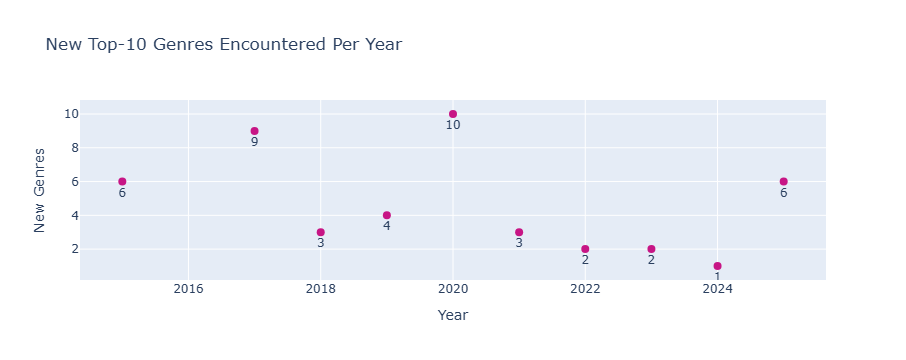

In [151]:
# Convert to DataFrame
genre_first_df = genre_first_appearance.reset_index()
genre_first_df.columns = ['genre', 'first_year']

# Count number of new genres per year
new_genres_by_year = genre_first_df.groupby('first_year').size().reset_index(name='genre_count')

# Plot as scatter plot
fig = px.scatter(
    new_genres_by_year,
    x='first_year',
    y='genre_count',
    text='genre_count',
    title='New Top-10 Genres Encountered Per Year',
    labels={'first_year': 'Year', 'genre_count': 'New Genres'},
    hover_data={'first_year': True, 'genre_count': True}
)

fig.update_traces(marker=dict(size=8, color="mediumvioletred"), textposition='bottom center')
fig.update_layout(showlegend=False)

fig.show()

At the tail end of the history, we observe the introduction larger amounts of new genres (>**6**), as well as the zenith in **2020** of **10** new genres. **2025** and my initial surfacing of the platform would lend itself to new music, but the **2020** explosion is intriguing. I wonder if work-from-home initiatives, coupled with the generalized reduction in availability of activities outside of the home unintentionally provide more opportunity and motivation to find new music.

In [144]:
# List the genres seen after the year 2020. More recently discovered music may share characteristics.
new_genres

genre
lo-fi          5
ambient        4
space music    4
synthwave      4
lo-fi beats    4
phonk          4
drift phonk    3
drone          3
french rap     2
pop urbaine    2
Name: count, dtype: int64

In [141]:
top_genres_per_year_df.describe()

,stream_year,hours_played,genre_rank
count,96.000000,96.000000,96.000000
mean,2020.625000,89.045729,5.270833
std,2.906436,92.185636,2.936088
min,2015.000000,0.000000,1.000000
25%,2018.000000,28.337500,2.750000
50%,2021.000000,57.595000,5.000000
75%,2023.000000,141.980000,8.000000
max,2025.000000,669.310000,10.000000


In [142]:
# Let's find genres played for time larger than the mean of 89.046
top_genres_per_year_df.query('hours_played >=89.045729')

,stream_year,genre,hours_played,genre_rank
6,2017,ambient,253.70,1
7,2017,drone,203.81,2
8,2017,minimalism,194.27,3
9,2017,space music,191.84,4
10,2017,krautrock,187.71,5
11,2017,glam rock,161.10,6
12,2017,art rock,161.03,7
16,2018,ambient,205.48,1
17,2018,drone,176.59,2
18,2018,minimalism,163.48,3


The data here indicating extreme paytime for `ambient`, `drone` and `minimalism` speaks to my utilization of Spotify as a "tool." A tool to provide a productivity boon, for working relaxation, or a tool to help me fall asleep more easily. There is nothing about this that seems danceable, melodic, or strongly emotionally evocative at the top of the pile. Less is more, and I wanted to do more, with Spotify in the background.

## 🥣 Where Are My Tastes Centered?

We have spent plenty of time on quantitative data, how much we listen to and when it was listened to, but we have not analyzed this qualitatively. Since we seek insights, I am curious _how_ my tastes have changed over time, along with my increased Spotify listening activity.

I stumbled upon the [Every Noise At Once](https://everynoise.com/) website made by [Glenn McDonald](http://furia.com/)  as I was exploring how to access the Spotify Web API. There are thousands of musical genres displayed on the site seemingly mapped in two-dimensional space.

If we view every genre shown at ENAO as a fixed 2-d point, each point could become a **vector**; with our listening history in mind, we can assign each vector a magnitude based on play count or time elapsed associated with tracks in our listening history, normalizing as needed. If we compute a weighted average for "genre-vectors" for a given year, we could compute a crude "musical center of gravity" per year. We could then observe, year by year, how this musical center of gravity changes over time. 
 

### Caveats

There are caveats to this approach, since 
* Defining "genre points" in a coordinate system I am appropriating for said purpose, is "fuzzy" by nature. My own listening activity has shifted from minimal, to non-existent, to explosive in volume; I could be trying to impose centrality and consistently across a potentially mercurial subject. That subject, being my musical tastes and listening behavior. If I happen to have unpredictable behavior, changes, fixations, the data we analyze may not communicate anything near to be conclusive.
* I am not intimately familiar with the methodology underlying [ENAO](https://everynoise.com/), so the mechanisms and relationships of this musical genre-space are nebulous.
* The Spotify design decision to associate genres with artists, means the manner with which we calculate our vectors can be impacted. Recall that I never heard of `space music` but an artist whose tracks I frequently listened to was associated with this genre. Our vector calculations may be pulled across the genre-space in mysterious ways, with genres being known to me, or completely alien.

### Implementation

We must first obtain data related to the [ENAO](https://everynoise.com/) genre coordinates. I could not locate any CSV on the site that held this information. It would be possible to inspect the source code of the main page and extract this information from the HTML `<div>` elements. Luckily, there was a GitHub gist that had some version of this accessible. 

In [103]:
# Read the EveryNoise Data from GitHub into a dataframe
genre_coords = pd.read_csv(
    'https://raw.githubusercontent.com/AyrtonB/EveryNoise-Watch/main/data/genre_attrs.csv'
)

# It typically has columns: 'genre', 'x', 'y', and RGB if desired
print(genre_coords.head())


                        genre     x      y hex_colour
0  australian classical piano   502    615    #1ca3c2
1                 piano blues   911   3891    #66882d
2       histoire pour enfants  1153   5673    #568608
3               dalarna indie   401  10634    #a77e17
4            cante alentejano   615   1881    #399c5d


We must extract the relevant genre information from our database. We execute the following query, again ensuring we only obtain tracks with relevant amounts of listening time.

In [100]:
# Execute a query to grab unnested genre data
query = """
SELECT 
    DATE_PART('year', sd.timestamp_column)::int AS year,
    g AS genre,
    sd.ms_played
FROM spotify_data sd
JOIN sd_artists_join sdj ON sd.id = sdj.sd_id
JOIN artists a ON sdj.artist_id = a.id
CROSS JOIN UNNEST(a.genres) AS g
WHERE a.genres IS NOT NULL
AND sd.ms_played > 5000
"""

In [101]:
genres_per_track_df = fetch_query_results(query)

We retrieve listening data at the level of individual genres for each track. We use the `spotify_data`, `sd_artists_join`, and `artists` tables, with the `artists` table holding the genre metadata. Since the genres are stored in an array, we must `UNNEST` to obtain them individually.

The use of `CROSS JOIN UNNEST...` expands each artist's genre array into individual rows. If an artist has three genres, for each matching track, there will be three separate rows in the result, one for each genre.

We also extract the year from the listening timestamp and include the total milliseconds played for each listening event. With the final result stored in a dataframe containing one row per track-genre-year combination, we can move on to merging this data with the genre coordinates information.

Before we can calculate a meaningful "musical center of gravity", we need to combine two sources of data:

- The listening history, with tracks and genre information.
- The genre "coordinate space," placing each genre on a 2D map

To do this, we will:
1. Ensure all required columns exist in both datasets
2.  Remove any existing `x` or `y` coordinate columns from the `genres_per_track_df` DataFrame to prevent duplicate columns during the merge
3. Merge the listening data with the genre coordinates on the genre name
4. Drop rows with missing data or zero listening time

The resulting dataframe should contain valid, coordinate-tagged listening events, ready for future calculations.

In [104]:
# Safely merge genre coordinates into the main dataset

# Step 1: Sanity check to ensure required columns are present.
assert all(col in genre_coords.columns for col in ["genre", "x", "y"]), "Missing coordinate columns in genre_coords"
assert "genre" in genres_per_track_df.columns, "'genre' column missing in genres_per_track_df"

# Step 2: Drop existing x/y columns from main DF to avoid collision during merge.
genres_per_track_df = genres_per_track_df.drop(columns=[col for col in ["x", "y"] if col in genres_per_track_df.columns])

# Step 3: Merge listening data with genre coordinates using genre as the key.
genres_with_coords = genres_per_track_df.merge(genre_coords, on="genre", how="inner")

# Step 4: Drop any rows missing coordinates or listening time.
genres_with_coords.dropna(subset=["x", "y", "ms_played"], inplace=True)

# Step 5: Filter out rows where minimal listening occurred.
valid_df = genres_with_coords[genres_with_coords["ms_played"] > 5000].copy()

# Final check: output column names to confirm structure
print("✅ Clean merge complete. valid_df columns:", valid_df.columns.tolist())


✅ Clean merge complete. valid_df columns: ['year', 'genre', 'ms_played', 'x', 'y', 'hex_colour']


We carefully merge our Spotify listening data and the genre coordinate space. As this particular step was iterated numerous times, we encountered issues like duplicate columns or missing keys, causing problems further along in our process.

To prevent problems downstream, we:
- Explicitly check that both datasets contain the necessary columns (`genre`, `x`, `y`)
- Drop any `x` or `y` columns from the listening data to avoid duplication during the merge
- Merge on the shared `genre` key to add 2D coordinates to each listening event
- Drop rows with missing or minimal `ms_played` values to ensure we are only working with valid, meaningful data

These checks may not be required in a finalized pipeline, but are useful during development to ensure that we are operating on a consistent and clean dataset.


We now compute the "musical center of gravity" for each year. Each genre has coordinates, each track has listening time. We use a weighted average to reflect listening intensity.

In [106]:
# Step 1: Sanity check for duplicate columns
dupes = valid_df.columns[valid_df.columns.duplicated()]
assert len(dupes) == 0, f"Duplicate columns found: {dupes.tolist()}"

# Step 2: Safe copy for operations
grouped = valid_df[["year", "x", "y", "ms_played"]].copy()

# Step 3: Weighted coordinate math
grouped["weighted_x"] = grouped["x"] * grouped["ms_played"]
grouped["weighted_y"] = grouped["y"] * grouped["ms_played"]

# Step 4: Aggregate totals for each year
weighted_centers = (
    grouped.groupby("year")
    .agg(
        total_ms=("ms_played", "sum"),
        total_weighted_x=("weighted_x", "sum"),
        total_weighted_y=("weighted_y", "sum")
    )
    .reset_index()
)

# Step 5: Compute final weighted centers
weighted_centers["x_center"] = weighted_centers["total_weighted_x"] / weighted_centers["total_ms"]
weighted_centers["y_center"] = weighted_centers["total_weighted_y"] / weighted_centers["total_ms"]

# Optional cleanup
weighted_centers.drop(columns=["total_ms", "total_weighted_x", "total_weighted_y"], inplace=True)

# ✅ Sanity check
print("✅ Weighted centers calculated:")
display(weighted_centers)


✅ Weighted centers calculated:


,year,x_center,y_center
0,2015,1225.000000,18707.000000
1,2017,510.122338,8444.386510
2,2018,557.065620,8465.551523
3,2019,741.202673,11486.298508
4,2020,999.168655,13392.796083
5,2021,599.178060,10353.176554
6,2022,560.933276,9926.688049
7,2023,520.700996,9446.406585
8,2024,668.210003,11232.646811
9,2025,788.564304,11441.289185


We verify there are no duplicated columns before calculations, weighting each genre’s coordinates by listening time and compute the center for each year. 

We can now begin visualizing listening patterns for each year. Each genre appears as a dot, colored by hex values merged in, if needed. The large red star marks the weighted listening center for the year.

In [ ]:
# Step 1: Re-attach hex colors if not present
if "hex_colour" not in valid_df.columns:
    valid_df = valid_df.merge(
        genre_coords[["genre", "hex_colour"]],
        on="genre",
        how="left"
    )
    assert "hex_colour" in valid_df.columns, "Failed to merge hex colours back in."

# Step 2: Get list of years for static plotting
years = sorted(valid_df["year"].unique())

# Step 3: Plot each year as a separate figure
for year in years:
    fig, ax = plt.subplots(figsize=(10, 12))  # Vertical emphasis
    
    # Subset for this year
    year_df = valid_df[valid_df["year"] == year]
    center = weighted_centers[weighted_centers["year"] == year]

    # Plot genre dots
    ax.scatter(
        year_df["x"], year_df["y"],
        s=100,  # Big enough to see
        c=year_df["hex_colour"],
        alpha=0.7,
        edgecolor="black",
        linewidth=0.4
    )

    # Plot the listening center star
    ax.scatter(
        center["x_center"], center["y_center"],
        color="red", marker="*", s=600, label="Listening Center"
    )

    ax.set_title(f"Yearly Genre Listening Cloud — {year}", fontsize=16)
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.legend()
    ax.grid(True)
    plt.tight_layout()
    plt.show()


These plots help us see genre spread and "center of gravity" year by year. We reattach color data if missing, then loop through each year to show listening patterns as scatterplots. These static figures are unfortunately difficult to interpret directly, as we lack legends and any hover-over functionality to isolate where our "center" lives in amongst the genre-space. We will generate plots using plotly instead.

In [ ]:
import plotly.express as px
import plotly.graph_objects as go

# Make sure we have hex colours
if "hex_colour" not in valid_df.columns:
    valid_df = valid_df.merge(
        genre_coords[["genre", "hex_colour"]],
        on="genre",
        how="left"
    )

# Unique years to loop over
years = sorted(valid_df["year"].unique())

# One plot per year
for year in years:
    year_df = valid_df[valid_df["year"] == year]
    center = weighted_centers[weighted_centers["year"] == year].iloc[0]

    fig = go.Figure()

    # Plot genre dots
    fig.add_trace(go.Scatter(
        x=year_df["x"],
        y=year_df["y"],
        mode='markers',
        marker=dict(
            size=10,
            color=year_df["hex_colour"],
            line=dict(width=0.5, color='black'),
            opacity=0.7
        ),
        text=year_df["genre"],
        hoverinfo='text',
        name='Genres'
    ))

    # Plot listening center
    fig.add_trace(go.Scatter(
        x=[center["x_center"]],
        y=[center["y_center"]],
        mode='markers',
        marker=dict(
            size=30,
            color='red',
            symbol='star',
            line=dict(width=2, color='black')
        ),
        text=[f"Listening Center: {year}"],
        hoverinfo='text',
        name='Listening Center'
    ))

    fig.update_layout(
        title=f"Yearly Genre Listening Map — {year}",
        xaxis_title="X",
        yaxis_title="Y",
        height=800,
        width=1000,
        showlegend=True
    )

    fig.show()


The previous static plots did not work well visually, lacking hover information and clear legends. We now regenerate plots using plotly, with each genre dot now supporting tooltips on hover, clear labeling for the "musical center of gravity," looping through the years to render an interactive plot for each.

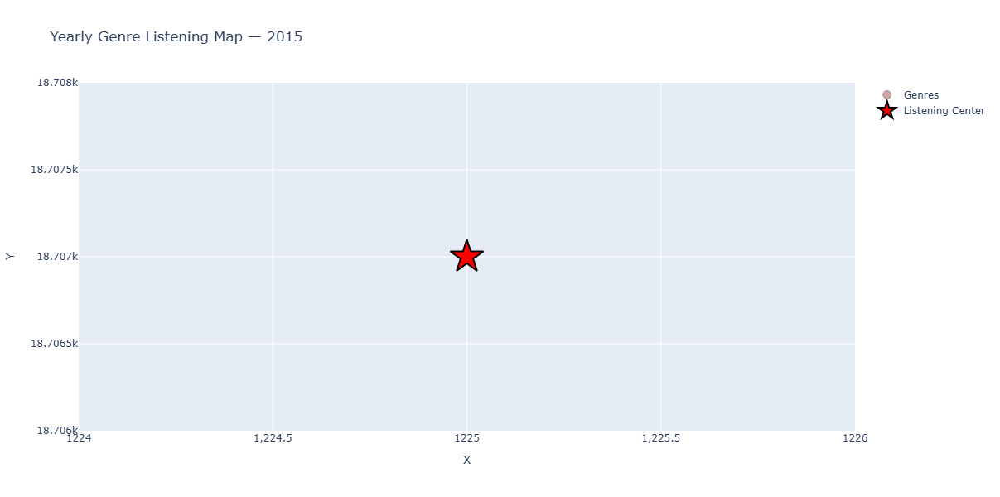

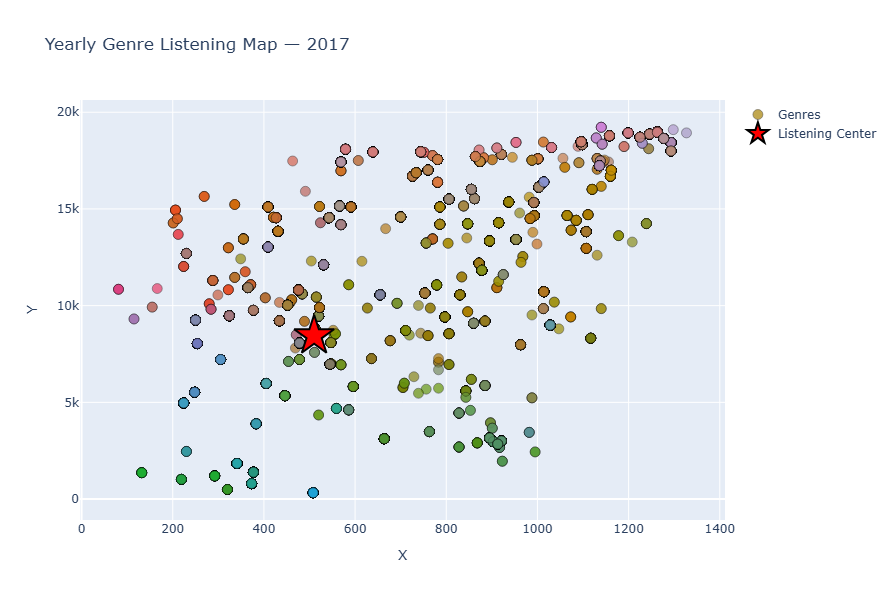

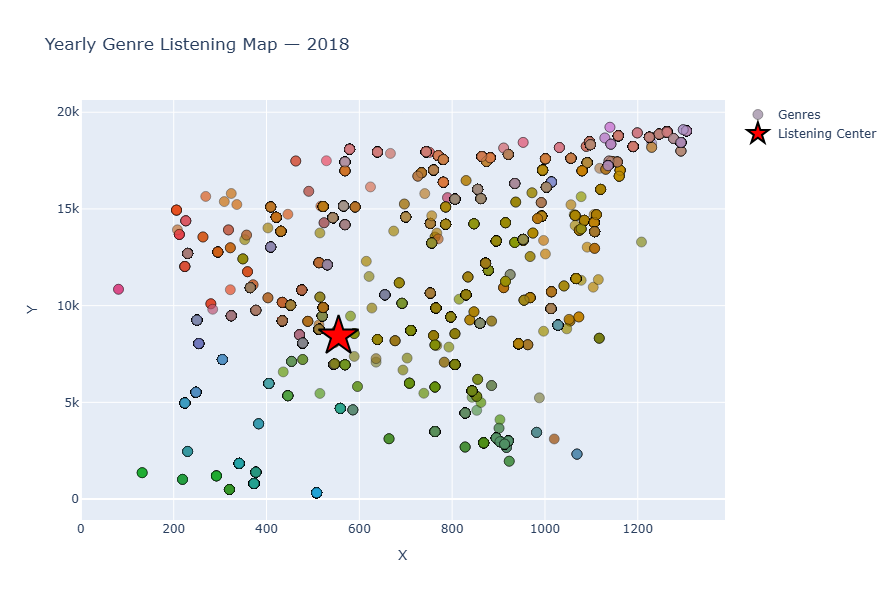

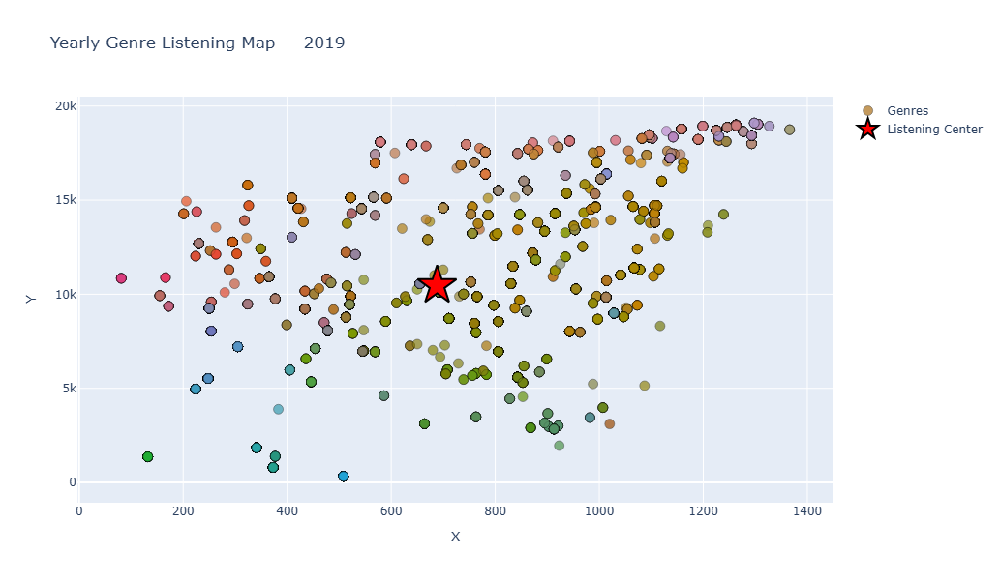

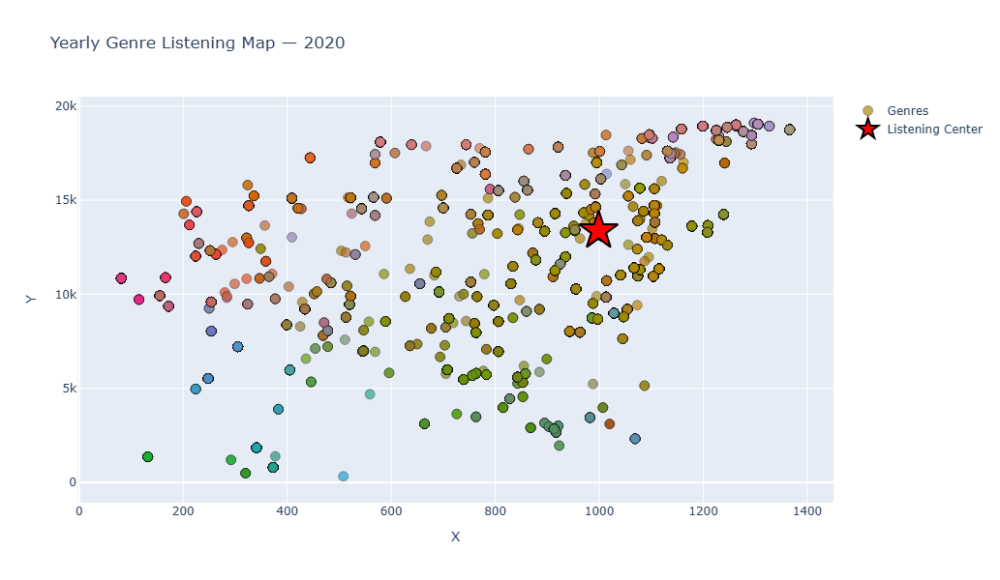

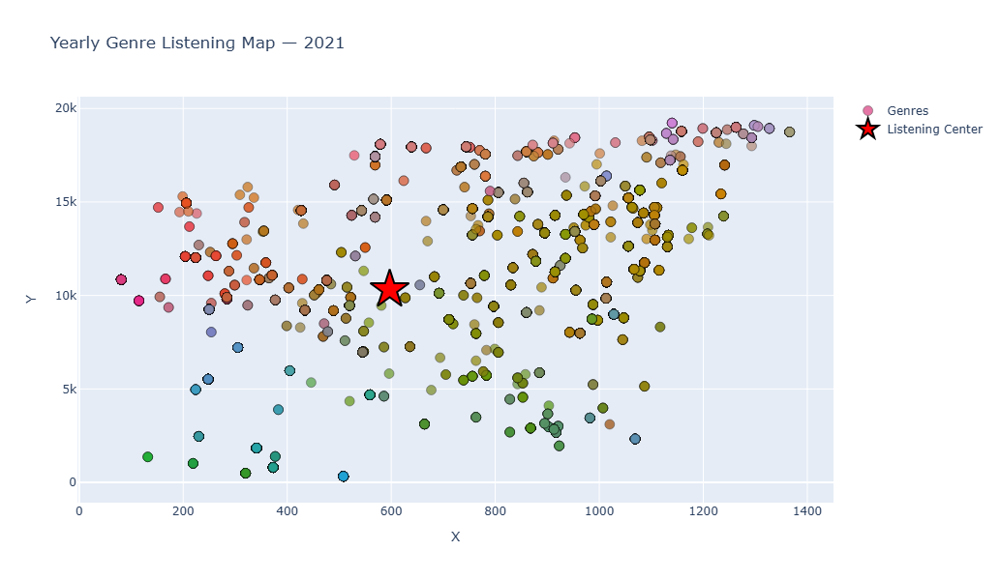

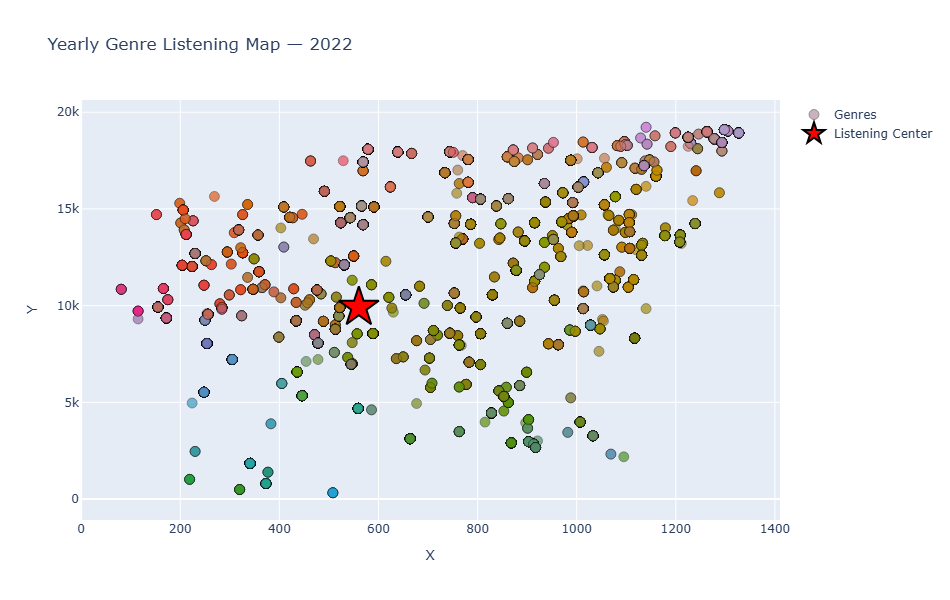

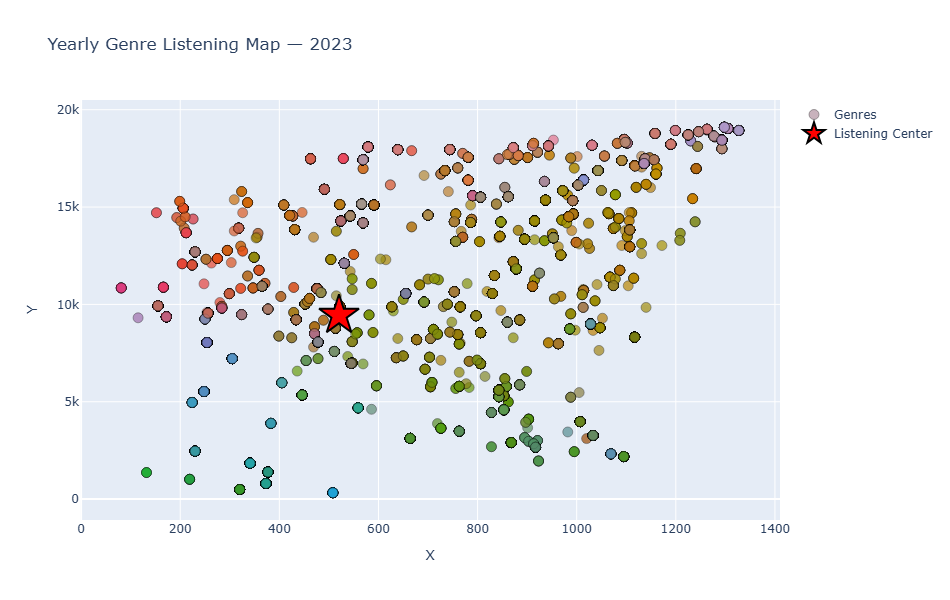

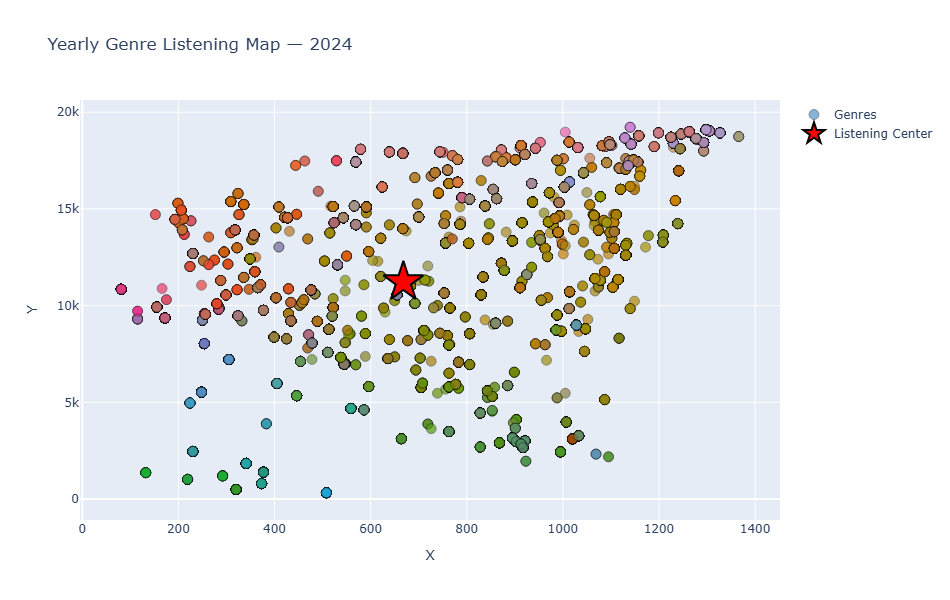

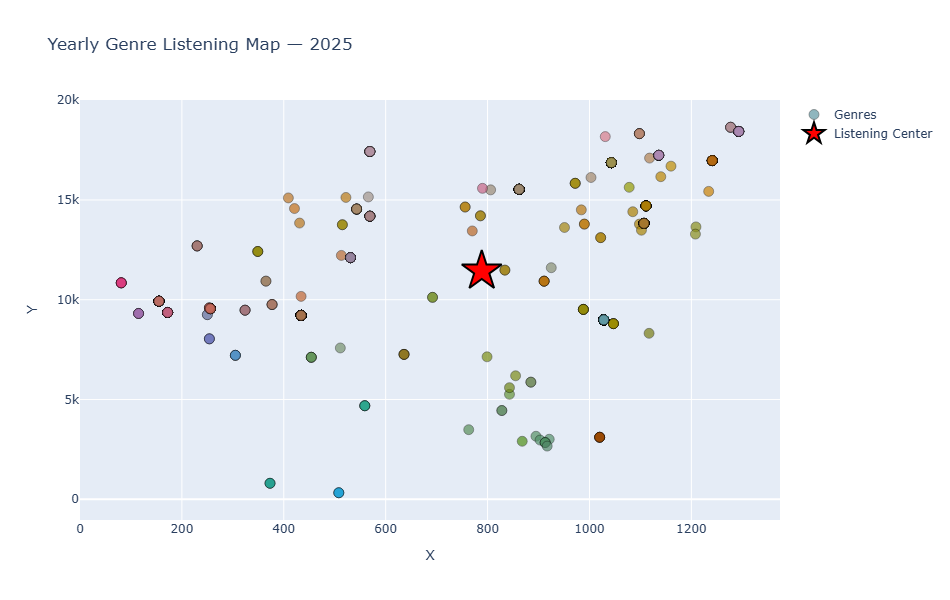

In [20]:
import plotly.express as px
import plotly.graph_objects as go

# Make sure we have hex colours.
if "hex_colour" not in valid_df.columns:
    valid_df = valid_df.merge(
        genre_coords[["genre", "hex_colour"]],
        on="genre",
        how="left"
    )

# Unique years to loop over.
years = sorted(valid_df["year"].unique())

# One plot per year.
for year in years:
    year_df = valid_df[valid_df["year"] == year]
    center = weighted_centers[weighted_centers["year"] == year].iloc[0]

    fig = go.Figure()

    # Plot genre dots.
    fig.add_trace(go.Scatter(
        x=year_df["x"],
        y=year_df["y"],
        mode='markers',
        marker=dict(
            size=10,
            color=year_df["hex_colour"],
            line=dict(width=0.5, color='black'),
            opacity=0.7
        ),
        text=year_df["genre"],
        hoverinfo='text',
        name='Genres'
    ))

    # Plot the listening "center."
    fig.add_trace(go.Scatter(
        x=[center["x_center"]],
        y=[center["y_center"]],
        mode='markers',
        marker=dict(
            size=30,
            color='red',
            symbol='star',
            line=dict(width=2, color='black')
        ),
        text=[f"Listening Center: {year}"],
        hoverinfo='text',
        name='Listening Center'
    ))

    fig.update_layout(
        title=f"Yearly Genre Listening Map — {year}",
        xaxis_title="X",
        yaxis_title="Y",
        height=600,
        width=800,
        showlegend=True
    )

    fig.show()


Hovering over the plot points clearly reveals genre names, giving clearer insight into what clusters form around each of the listening centers. 
In spite of the improved visibility, we want the ability to determine genres that are proximate to our "center" via function. The following function allows us to zoom into the “neighborhood” around any (x, y) coordinate and retrieve the genres located nearby. The search radius is defined as a percentage of the total horizontal (x-axis) spread, and we can optionally filter by year.

In [108]:
import math

def get_surrounding_genres(df, center_x, center_y, radius_pct=5, year=None):
    """
    Returns genres within a radius (as % of x-axis range) around a center (x, y).
    
    Parameters:
        df (pd.DataFrame): DataFrame with columns 'x', 'y', 'genre', 'year'
        center_x (float): X coordinate of the center
        center_y (float): Y coordinate of the center
        radius_pct (float): Radius as percentage of total X-axis range
        year (int or None): Filter data to a specific year (optional)
        
    Returns:
        pd.DataFrame: Genres within the computed radius, sorted by distance
    """

    # Sanity check
    required_cols = {"x", "y", "genre", "year"}
    assert required_cols.issubset(df.columns), f"Missing columns: {required_cols - set(df.columns)}"

    # Filter by year if specified
    if year is not None:
        df = df[df["year"] == year].copy()
        assert not df.empty, f"No data for year {year}"

    # Compute radius in x-axis units
    x_range = df["x"].max() - df["x"].min()
    radius = (radius_pct / 100.0) * x_range

    # Compute Euclidean distance to the center
    df["distance"] = ((df["x"] - center_x)**2 + (df["y"] - center_y)**2)**0.5

    # Filter to points within the radius
    nearby = df[df["distance"] <= radius].copy()
    nearby = nearby.sort_values("distance")

    return nearby[["genre", "x", "y", "distance", "ms_played", "year"]].reset_index(drop=True)


In [109]:
# Get surrounding genres in 2020 within 30% x-range of the center
center_row = weighted_centers[weighted_centers["year"] == 2020].iloc[0]
surrounding_genres_2020 = get_surrounding_genres(valid_df, center_row["x_center"], center_row["y_center"], radius_pct=30, year=2020)

# Preview results
surrounding_genres_2020.head()


,genre,x,y,distance,ms_played,year
0,kompa,953,13372,50.636171,251574,2020
1,kompa,953,13372,50.636171,224363,2020
2,kompa,953,13372,50.636171,251039,2020
3,kompa,953,13372,50.636171,235180,2020
4,kompa,953,13372,50.636171,224363,2020


In [124]:
# Get surrounding genres in 2024 within 30% x-range of the center
center_row = weighted_centers[weighted_centers["year"] == 2020].iloc[0]

# Obtain surrounding genres
#surrounding_genres_2025 = get_surrounding_genres(valid_df, center_row["x_center"], center_row["y_center"], radius_pct=60, year=2025)
surrounding_genres = get_surrounding_genres(valid_df, center_row["x_center"], center_row["y_center"], radius_pct=60, year=2020)

# Preview results
surrounding_genres.query('distance <200')


,genre,x,y,distance,ms_played,year
0,kompa,953,13372,50.636171,224363,2020
1,kompa,953,13372,50.636171,224363,2020
2,kompa,953,13372,50.636171,251039,2020
3,kompa,953,13372,50.636171,224363,2020
4,kompa,953,13372,50.636171,235180,2020
...,...,...,...,...,...,...
223,moroccan pop,843,13423,159.062646,193700,2020
224,moroccan pop,843,13423,159.062646,193700,2020
225,moroccan pop,843,13423,159.062646,175565,2020
226,moroccan pop,843,13423,159.062646,193700,2020


In [121]:
for year in range(2013,2026):
    print(year)
    try:
        center_row = weighted_centers[weighted_centers["year"] == year].iloc[0]
        
        # Find surrounding genres
        surrounding_genres = get_surrounding_genres(valid_df, center_row["x_center"], center_row["y_center"], radius_pct=30, year=year)

        # Extract the unique genres and select 10 of them
        print(surrounding_genres['genre'].unique()[:9])
    except Exception as e:
        print(f"An error occurred: {e}")
        print(f"Unable to process year: {year}")

2013
An error occurred: single positional indexer is out-of-bounds
Unable to process year: 2013
2014
An error occurred: single positional indexer is out-of-bounds
Unable to process year: 2014
2015
['deep house']
2016
An error occurred: single positional indexer is out-of-bounds
Unable to process year: 2016
2017
['acoustic pop' 'math rock' 'c-pop' 'texas country' 'northern soul'
 'modern blues' 'folk punk' 'classic rock' 'motown']
2018
['math rock' 'kayokyoku' 'northern soul' 'arabesk' 'folk punk' 'motown'
 'country' 'classic rock' 'art rock']
2019
['retro soul' 'taiwanese indie' 'smooth jazz' 'grupera' 'pop urbaine'
 'alternative r&b' 'afroswing']
2020
['kompa' 'indie soul' 'neo soul' 'mexican hip hop' 'trap soul'
 'moroccan pop' 'egyptian pop' 'reggae' 'reggae rock']
2021
['indie pop' 'power pop' 'alternative rock' 'glitch' 'bedroom pop'
 'jangle pop' 'psychedelic pop' 'marathi pop' 'quiet storm']
2022
['glam rock' 'soft rock' 'indie rock' 'yacht rock' 'philly soul'
 'bedroom pop' 'ja

## 🆚Comparing Centers vs. Top Genres

Seeing how close the musical "centers of gravity" are to other genres provides avenues of future genre exploration

As we have already analyzed our top genres by playtime, we can understand whether my top genres truly reflect the musical centers of gravity computed earlier.

The proximity of top genres to "centers" can be interpreted different ways:

| Scenario                                            | What It Tells Us                                                                               |
| --------------------------------------------------- | ---------------------------------------------------------------------------------------------- |
| Top genre is near center                            | Listening habits were consistent and focused                                                    |
| Top genre is far from center                        | Explored diverse genres, diluting the center                                            |
| Center near niche genres with minimal listening activity | Primary genres live in a crowded genre space, sharing coordinates with adjacent styles |



To understand whether my top genres truly reflect the musical centers of gravity computed earlier, we need to:

* Merge the top genres data with the genre coordinates (x, y).
* Bring in the yearly musical "centers."
* Compute the [Euclidean Distance](https://en.wikipedia.org/wiki/Euclidean_distance) between each top genre and that year's "center."
* Normalize distances from the "center" based on the range of the x-axis for easy comparison.
* Rank genres per year by proximity to their "center."

In [113]:
# Import the copy module to safely copy objects.
import copy

# Copy previously generated top genres by hours_played.
top_genres = top_genres_per_year_df.copy()

# Drop index column if present, possible if data is loaded from file.
if "Unnamed: 0" in weighted_centers.columns:
    weighted_centers.drop(columns=["Unnamed: 0"], inplace=True)

# Merge genre coordinates.
top_genres = top_genres.merge(genre_coords, on="genre", how="left")

# Merge with musical centers.
top_genres = top_genres.merge(weighted_centers, left_on="stream_year", right_on="year", how="left")

# Compute Euclidean distance.
top_genres["distance"] = np.sqrt((top_genres["x"] - top_genres["x_center"])**2 +
                                 (top_genres["y"] - top_genres["y_center"])**2)

# Normalize distance by x-axis range.
x_range = genre_coords["x"].max() - genre_coords["x"].min()
top_genres["normalized_distance"] = top_genres["distance"] / x_range

# Rank genres per year by closeness to center.
top_genres["rank_by_proximity"] = top_genres.groupby("stream_year")["normalized_distance"].rank()

# Preview results
top_genres.head()


,stream_year,genre,hours_played,genre_rank,x,y,hex_colour,year,x_center,y_center,distance,normalized_distance,rank_by_proximity
0,2015,deep house,0.13,1,1225.0,18707.0,#bf827b,2015,1225.0,18707.0,0.000000,0.000000,1.0
1,2015,dark ambient,0.00,2,254.0,8040.0,#7078bc,2015,1225.0,18707.0,10711.103118,7.140735,4.0
2,2015,doom metal,0.00,2,155.0,9925.0,#ba6c63,2015,1225.0,18707.0,8846.944331,5.897963,2.0
3,2015,drone,0.00,2,248.0,5521.0,#518dc0,2015,1225.0,18707.0,13222.145250,8.814763,5.0
4,2015,sludge metal,0.00,2,172.0,9361.0,#c1607e,2015,1225.0,18707.0,9405.132907,6.270089,3.0


In [114]:
top_genres.query('rank_by_proximity < 3')

,stream_year,genre,hours_played,genre_rank,x,y,hex_colour,year,x_center,y_center,distance,normalized_distance,rank_by_proximity
0,2015,deep house,0.13,1,1225.0,18707.0,#bf827b,2015,1225.000000,18707.000000,0.000000,0.000000,1.0
2,2015,doom metal,0.00,2,155.0,9925.0,#ba6c63,2015,1225.000000,18707.000000,8846.944331,5.897963,2.0
10,2017,krautrock,187.71,5,478.0,8065.0,#84848c,2017,510.122338,8444.386510,380.743967,0.253829,2.0
12,2017,art rock,161.03,7,513.0,8779.0,#987a35,2017,510.122338,8444.386510,334.625864,0.223084,1.0
20,2018,krautrock,142.76,5,478.0,8065.0,#84848c,2018,557.065620,8465.551523,408.280412,0.272187,2.0
22,2018,art rock,140.63,7,513.0,8779.0,#987a35,2018,557.065620,8465.551523,316.530767,0.211021,1.0
26,2019,indie soul,90.34,1,953.0,13423.0,#938d4b,2019,741.202673,11486.298508,1948.248130,1.298832,2.0
35,2019,alternative r&b,26.72,10,878.0,11826.0,#87921a,2019,741.202673,11486.298508,366.211158,0.244141,1.0
44,2020,soca,31.90,9,1091.0,13024.0,#c08305,2020,999.168655,13392.796083,380.057294,0.253372,1.0
45,2020,afro soul,30.52,10,882.0,13804.0,#a7881a,2020,999.168655,13392.796083,427.571228,0.285047,2.0


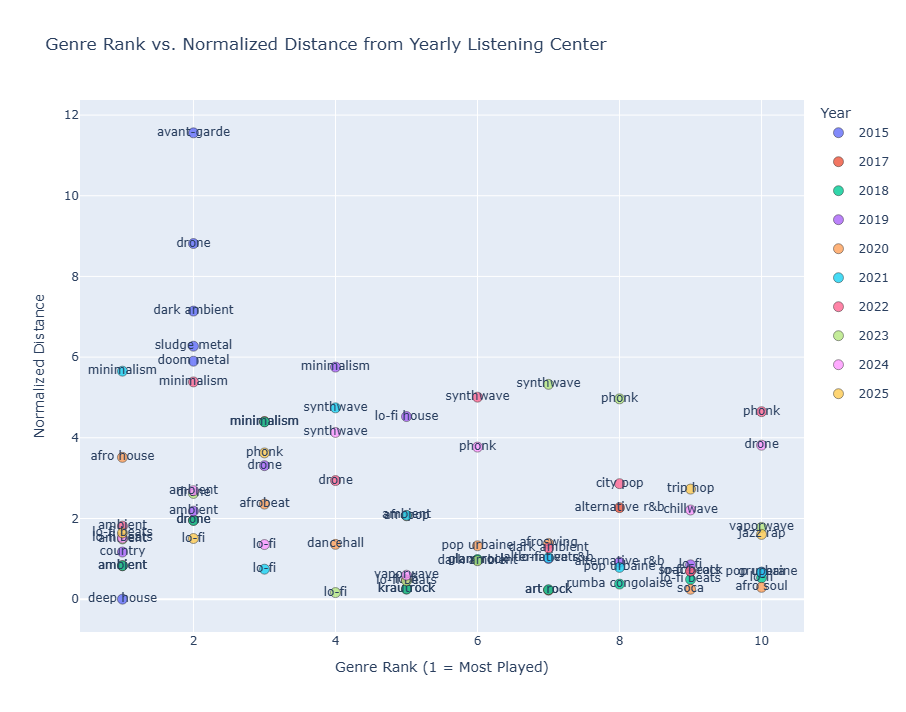

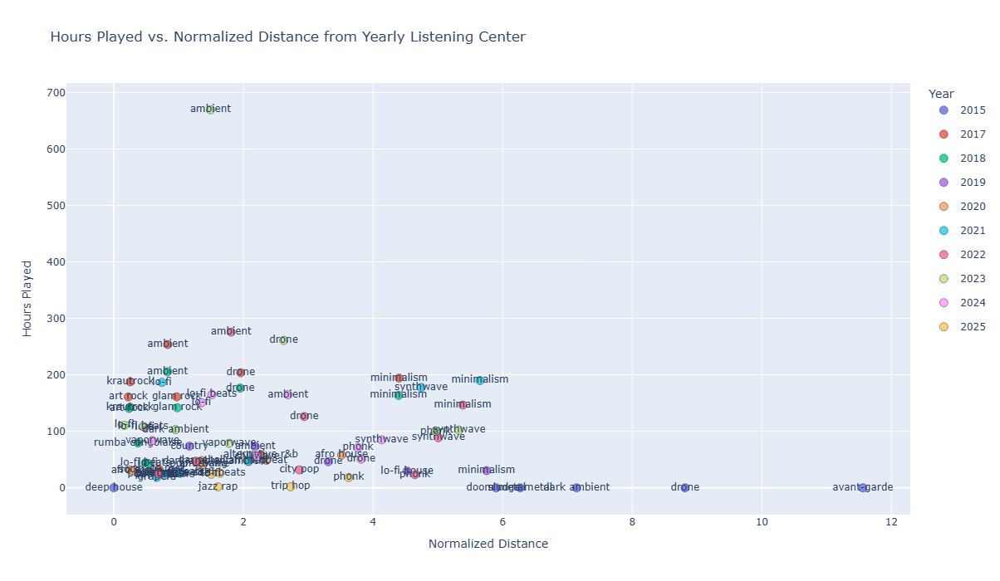

In [27]:
import plotly.graph_objects as go
import plotly.express as px

# Sort and map colors to years.
years = sorted(top_genres["year"].unique())
color_map = {
    year: px.colors.qualitative.Plotly[i % len(px.colors.qualitative.Plotly)]
    for i, year in enumerate(years)
}

# Genre Rank vs Normalized Distance.
fig1 = go.Figure()
for year in years:
    year_df = top_genres[top_genres["year"] == year]
    fig1.add_trace(go.Scatter(
        x=year_df["genre_rank"],
        y=year_df["normalized_distance"],
        mode='markers+text',
        text=year_df["genre"],
        marker=dict(
            size=10,
            color=color_map[year],
            line=dict(width=0.5, color="black"),
            opacity=0.8
        ),
        name=str(year),
        legendgroup=str(year),
        customdata=year_df[["hours_played"]].values,
        hovertemplate=(
            "<b>Genre:</b> %{text}<br>" +
            "<b>Rank:</b> %{x}<br>" +
            "<b>Normalized Distance:</b> %{y:.2f}<br>" +
            "<b>Hours Played:</b> %{customdata[0]:.2f}<extra></extra>"
        )
    ))

fig1.update_layout(
    title="Genre Rank vs. Normalized Distance from Yearly Listening Center",
    xaxis_title="Genre Rank (1 = Most Played)",
    yaxis_title="Normalized Distance",
    legend_title="Year",
    height=700,
    width=1000
)
fig1.show()

# 2. Hours Played vs Normalized Distance
fig2 = go.Figure()
for year in years:
    year_df = top_genres[top_genres["year"] == year]
    fig2.add_trace(go.Scatter(
        x=year_df["normalized_distance"],
        y=year_df["hours_played"],
        mode='markers+text',
        text=year_df["genre"],
        marker=dict(
            size=10,
            color=color_map[year],
            line=dict(width=0.5, color="black"),
            opacity=0.8
        ),
        name=str(year),
        legendgroup=str(year),
        hovertemplate=(
            "<b>Genre:</b> %{text}<br>" +
            "<b>Normalized Distance:</b> %{x:.2f}<br>" +
            "<b>Hours Played:</b> %{y:.2f}<extra></extra>"
        )
    ))

fig2.update_layout(
    title="Hours Played vs. Normalized Distance from Yearly Listening Center",
    xaxis_title="Normalized Distance",
    yaxis_title="Hours Played",
    legend_title="Year",
    height=700,
    width=1000
)
fig2.show()


We can further enrich our plotting of yearly listening "centers" by layering in genre context from the coordinate space. In the following plot, the red path shows how our listening "centers" shifted over time.

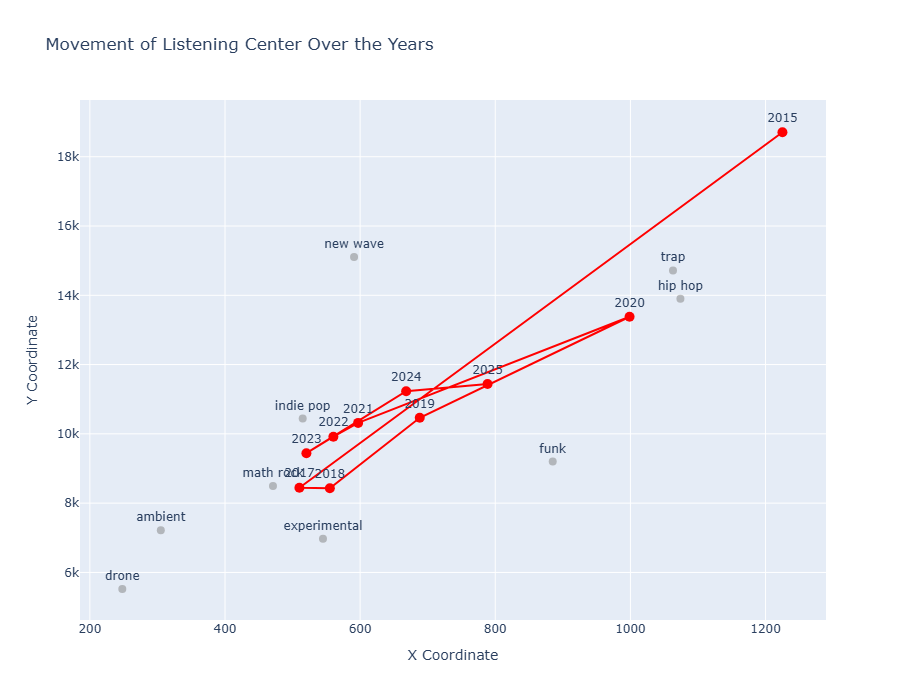

In [30]:
# Group by year to get unique centers.
center_df = top_genres.groupby("year")[["x_center", "y_center"]].first().reset_index()

# Add line connecting centers.
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=center_df["x_center"],
    y=center_df["y_center"],
    mode="lines+markers+text",
    text=center_df["year"],
    marker=dict(size=10, color="red"),
    line=dict(width=2),
    name="Center Movement",
    hovertemplate="<b>Year:</b> %{text}<br><b>X:</b> %{x}<br><b>Y:</b> %{y}<extra></extra>",
    textposition="top center"
))

fig.update_layout(
    title="Movement of Listening Center Over the Years",
    xaxis_title="X Coordinate",
    yaxis_title="Y Coordinate",
    height=700,
    width=900,
    showlegend=False
)

# Adding genres to flesh out plot
genre_labels = ["hip hop", "ambient", "math rock", "experimental", "indie pop", "drone", "new wave", "funk", "trap"]

label_df = genre_coords[genre_coords["genre"].isin(genre_labels)].copy()

fig.add_trace(go.Scatter(
    x=label_df["x"],
    y=label_df["y"],
    mode='markers+text',
    marker=dict(
        color="gray",
        size=8,
        opacity=0.5
    ),
    text=label_df["genre"],
    textposition="top center",
    hoverinfo="text",
    name="Reference Genres",
    showlegend=False
))


fig.show()

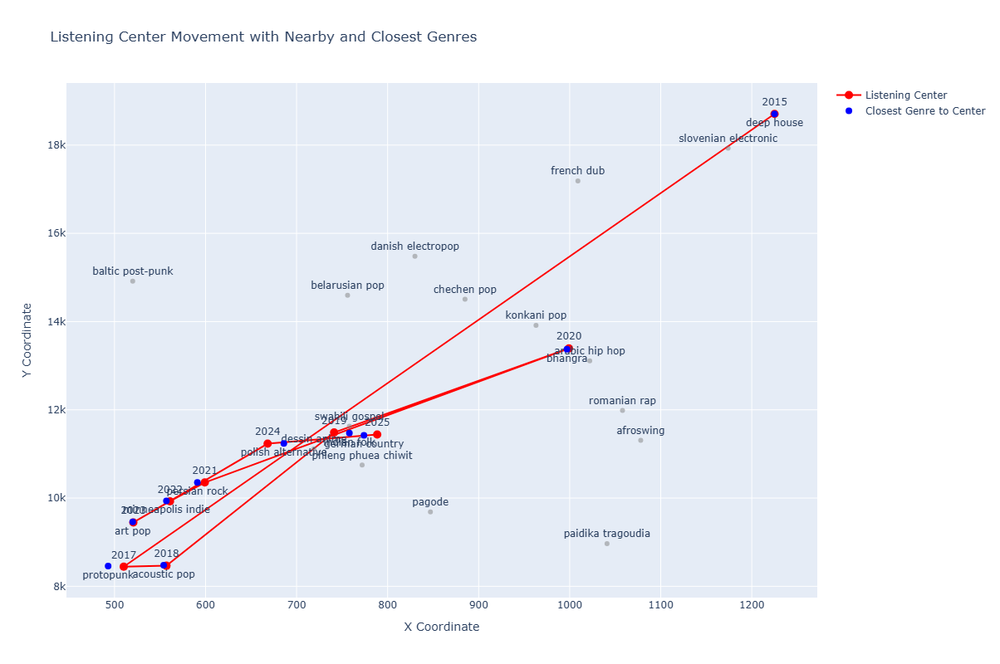

In [118]:
# Clean column names
genre_coords.columns = [col.strip() for col in genre_coords.columns]
weighted_centers.columns = [col.strip() for col in weighted_centers.columns]

# Select genres near the center region.
manual_genre_labels = genre_coords[
    (genre_coords["x"] >= 500) & (genre_coords["x"] <= 12000) &
    (genre_coords["y"] >= 8000) & (genre_coords["y"] <= 18000) 
].copy()

manual_genre_labels = manual_genre_labels.sample(n=15, random_state=42)  # Select a sample to avoid clutter

# Identify the genre closest to each yearly center.
closest_genres = []
for _, row in weighted_centers.iterrows():
    year = row["year"]
    center_x, center_y = row["x_center"], row["y_center"]
    genre_coords["distance"] = ((genre_coords["x"] - center_x) ** 2 + (genre_coords["y"] - center_y) ** 2) ** 0.5
    closest = genre_coords.loc[genre_coords["distance"].idxmin()]
    closest_genres.append({
        "genre": closest["genre"],
        "x": closest["x"],
        "y": closest["y"],
        "year": year
    })

closest_genre_df = pd.DataFrame(closest_genres)

# Plot the movement, nearby genres, and closest genres.
fig = go.Figure()

# Listening center path
fig.add_trace(go.Scatter(
    x=weighted_centers["x_center"],
    y=weighted_centers["y_center"],
    mode="lines+markers+text",
    text=weighted_centers["year"].astype(str),
    line=dict(color="red", width=2),
    marker=dict(size=10, color="red"),
    textposition="top center",
    name="Listening Center"
))

# Manually selected nearby genres
fig.add_trace(go.Scatter(
    x=manual_genre_labels["x"],
    y=manual_genre_labels["y"],
    mode="markers+text",
    marker=dict(color="gray", size=6, opacity=0.5),
    text=manual_genre_labels["genre"],
    textposition="top center",
    name="Nearby Genres",
    showlegend=False
))

# Closest genre per year
fig.add_trace(go.Scatter(
    x=closest_genre_df["x"],
    y=closest_genre_df["y"],
    mode="markers+text",
    marker=dict(color="blue", size=8),
    text=closest_genre_df["genre"],
    textposition="bottom center",
    name="Closest Genre to Center"
))

# Added layout tweaks
fig.update_layout(
    title="Listening Center Movement with Nearby and Closest Genres",
    xaxis_title="X Coordinate",
    yaxis_title="Y Coordinate",
    height=800,
    width=1000,
    showlegend=True
)

fig.show()


This visualization provides more context for our listening trajectory, with the inclusion of nearby genres along with the nearest genre to a yearly "center." The gray-labeled genres help ground the movement path within familiar genre clusters and give us a clearer sense of musical space. The blue-labeled genres pinpoint the genre most associated with each year's listening center. This can provide "anchor points" in our musical taste.

Inspecting **2020**, apparently my tastes were centered near `bhangra` and `hip hop`. While I would normally not explicitly play a `bhangra` track off the top of my head, this genre having proximity to `romanian rap` and `afroswing` is easier to reason about given our remembrance of the "Francophone" binge-listening period (`pop urbaine`, `french rap`) uncovered earlier in discussions relating to time of day.

**2015** being an "outlier" is likely due to the extremely small amount of data collected in that year of listening. 

In [128]:
top_genres_per_year_df.query('stream_year == 2024')

,stream_year,genre,hours_played,genre_rank
76,2024,lo-fi beats,165.03,1
77,2024,ambient,164.80,2
78,2024,lo-fi,150.70,3
79,2024,synthwave,85.04,4
80,2024,vaporwave,83.74,5
81,2024,phonk,71.13,6
82,2024,space music,64.81,7
83,2024,drift phonk,57.07,8
84,2024,chillwave,55.89,9
85,2024,drone,50.79,10


In [121]:
for year in range(2013,2026):
    print(year)
    try:
        center_row = weighted_centers[weighted_centers["year"] == year].iloc[0]
        
        # Find surrounding genres
        surrounding_genres = get_surrounding_genres(valid_df, center_row["x_center"], center_row["y_center"], radius_pct=30, year=year)

        # Extract the unique genres and select 10 of them
        print(surrounding_genres['genre'].unique()[:9])
    except Exception as e:
        print(f"An error occurred: {e}")
        print(f"Unable to process year: {year}")

2013
An error occurred: single positional indexer is out-of-bounds
Unable to process year: 2013
2014
An error occurred: single positional indexer is out-of-bounds
Unable to process year: 2014
2015
['deep house']
2016
An error occurred: single positional indexer is out-of-bounds
Unable to process year: 2016
2017
['acoustic pop' 'math rock' 'c-pop' 'texas country' 'northern soul'
 'modern blues' 'folk punk' 'classic rock' 'motown']
2018
['math rock' 'kayokyoku' 'northern soul' 'arabesk' 'folk punk' 'motown'
 'country' 'classic rock' 'art rock']
2019
['retro soul' 'taiwanese indie' 'smooth jazz' 'grupera' 'pop urbaine'
 'alternative r&b' 'afroswing']
2020
['kompa' 'indie soul' 'neo soul' 'mexican hip hop' 'trap soul'
 'moroccan pop' 'egyptian pop' 'reggae' 'reggae rock']
2021
['indie pop' 'power pop' 'alternative rock' 'glitch' 'bedroom pop'
 'jangle pop' 'psychedelic pop' 'marathi pop' 'quiet storm']
2022
['glam rock' 'soft rock' 'indie rock' 'yacht rock' 'philly soul'
 'bedroom pop' 'ja

### Year-by-Year Comparison: Listening Centers vs. Top Genres

We visualized each year's listening center mapped onto the genre coordinate system, and labeled the nearest genre to each center. We can also compare each center's location alongside the actual top genres in our listening history. This can determine whether our listening was highly focused (center aligned with top genres) or more exploratory (center lies in a niche away from top genres).

---

#### 2015
- **Top Genres**: *deep house*
- **Closest Genres**: *deep house*
- **Interpretation**: An "outlier" year with only the `deep house` genre was played. Only **11** minutes of music in this genre was played for the entire year. It may give indications of what sorts of music I wanted to hear with my initial foray into the platform, but will be eclipsed by later activity.

---

#### 2017–2018
- **Top Genres**: *ambient*, *drone*, *minimalism*
- **Closest Genres**: *acoustic pop*, *math rock*, *kayokyoku*
- **Interpretation**: These years were my [Brian Eno](https://open.spotify.com/artist/7MSUfLeTdDEoZiJPDSBXgi?si=Hk8x3dnbTOe6ZOCLf3_4VA)/[Steve Reich](https://open.spotify.com/artist/1aVONoJ0EM97BB26etc1vo?si=-5rOKMNnRKqGRDE5GYq3xw) era. These years had strong thematic coherence, with the centers deeply embedded in the regions where the top genres also lay. I could see tracks of this ilk bleeding into some form of `acoustic pop` but the proximity to `math rock` seems odd to me; I associate `rock*` genres with aggression and higher BPM, more vocalized, and less atmospheric. It could be the case of a more dispersed set of genres, or a nascent relation to the `lo-fi` genre one would associate with more melodic rock. The `kayokyoku` is right up my alley as a Japanophile, along with its shared attributes with my beloved `city pop` genre, but appears to refer to pop much earlier in the 20th century. 

---

#### 2019
- **Top Genres**: *indie soul*, *nu disco*, *ambient*, *french house*, *drone*, *minimalism*
- **Closest Genres**: *retro soul*, *taiwanese indie*, *smooth jazz*
- **Interpretation**: Initially, the top genre was marked as `country`. I do _not_ listen to the `country` genre at all, so I inspected the tracks played this year to reason about why it featured so prominently. The literal artist name is [`Darius`](https://open.spotify.com/artist/5vfEaoOBcK0Lzr07WN8KaK?si=3KBQ78CdRhO_gIkVv2Xzyw), but the artist our data has been associated with was [`Darius Rucker`] of [Hootie and the Blowfish](https://open.spotify.com/artist/08ct2eZF5lUPdJpHwNKWof?si=RWJJxmn6SMyFV2fEU3TPLQ) fame. After using the [Get Artist](https://developer.spotify.com/documentation/web-api/reference/get-an-artist) endpoint, we repaired the `artists` table and found our correct top genres. This again reinforces concerns around the labeling the artist and not the genre, though in this case, this may have been a bug in our of our search function. We specified only want a singular result, versus collecting all possible results and having to manually validate them. Searching for `Darius`, in my mind, should mean literal `Darius` and should not have been conflated to be `Darius Rucker`. With that error correctly and plots redrawn, we found `retro soul` being the closest genre to the "center" in this year, which is easy to reason about. The `taiwanese indie` genre took me aback, but these are the sorts of songs I listen to on Mixcloud. 

---

#### 2020
- **Top Genres**: *afro house*, *afrobeat*, *afrobeat*
- **Closest Genre**: *kompa*, *indie soul*, *neo soul*
- **Interpretation**: This year was more exploratory, given the center's distance was far from previous years. Its journey to the "northeast" of the genre-space feels like a return to my first encounters with the platform, centering on more danceable fare. *kompa* sounds reminiscent of *soukous* and aligns well with *pop urbaine*, *french rap*, and *french r&b* tracks observed in this year of reduced listening activity. The *soul* entries seem shared from previous years, in spite of the drift.

---

#### 2021–2023
- **Top Genres**: *ambient*, *space music*, *minimalism*
- **Closest Genres**: *indie pop*, *glam rock*, *art pop*
- **Interpretation**: These years the centers retreat toward the cluster established in 2017–2019 in the southwest of the genre-space. This suggests I had enough experimentation and reverted to genres in my comfort zones after the experimentation of 2020. This area seems rife with *pop*, *rock*, and *indie* adjacent genres. 

---

#### 2024–2025
- **Top Genres**: *lo-fi beats*, *ambient*, *lofi*, *synthwave*
- **Closest Genres**: *chinese r&b*, *taiwanese indie*, *sholawat*, *taiwanese pop* 
- **Interpretation**: Drifting upwards again, near **2019**. Newer sounds with at eastern flourish, as seen by *chinese r&b* and *taiwanese indie*. This could reflect platform recommendations or personal curiosity, suggesting exploration within bounds rather than radical departure.

---

### Summary

- Listening centers clustered tightly in **2017**–**2019** and again in **2021**–**2023**, showing strong stylistic consolidation. I find genres I like, then stick with them for extended periods of time.
- **2020** was an intense outlier, with the listening center suggesting active searching for new music outside of prior experiences. In conjunction with play time calculations, we had less volume, more variety than previously seen. Specifically, "danceable" genres like `afrobeat`. Trapped in my house, dancing.
- Recent years (**2024**–**2025**) show consistency with some mild expansion. Perhaps I am being nudged by platform recommendations or have been stumbling upon new sounds. In spite of that, the atmospheric genres are my "foundation."


## 📜 Key Takeaways

## 📝 Appendix

### Data Import Challenges

* In spite of the `README` included with the Spotify streaming history data indicating that `offline_timestamp` was an _actual_ timestamp, this JSON field appears to be an epoch time value. Ex:
    ```
    "offline_timestamp": 1521173773147,"
    ```
    This epoch time value also includes milliseconds in the last three digits. To process this, we divide by **1000** in our `load_json_from_file` function and cast into `int` type prior to database table insertion.

* Various columns, such as  `episode_name` require use of `varchar` columns which are vastly oversized compared to the majority of the data lengths seen in this field. 
    ```
    "episode_name": "On The Continent: Tensions rise at Barcelona, Roberto Soldado's back among the goals, and Gennaro Gattuso works on his night moves",    ```
    We need `VARCHAR` columns with 100-150 character lengths just in case any one or more records has an extraordinarily long value.

* IP addresses can either be in `IPV4` or `IPV6` format. `IPV6` address types required columns of `VARCHAR(38)` in the `ip_addr` field to accommodate the long addresses in this namespace.

* Query objects are random-access, even though the expectations is that the order of records


### Obtain IP Metadata

Create the `ip_metadata` table first, to store network-related listening data.